# 导入包

In [2]:
#导入包
#用python环境
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import os

#from cdo import *
#from cdo import Cdo

#cdo = Cdo()

from scipy.stats import pearsonr
from scipy.stats import linregress
from scipy import signal
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors 
from matplotlib.colors import TwoSlopeNorm
import matplotlib.ticker as ticker
import matplotlib.patches as mpatches

In [1]:
#用area环境使用cartopy
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import os
#import rioxarray

import matplotlib as mpl
import matplotlib.colors as colors 
from matplotlib.colors import TwoSlopeNorm
import matplotlib.ticker as ticker
import matplotlib.patches as mpatches
from mpl_toolkits.axisartist.parasite_axes import HostAxes, ParasiteAxes
import seaborn as sns
from scipy.stats import pearsonr
from scipy.stats import linregress
from scipy import signal
import cartopy.io.shapereader as sr
import cartopy.feature as cfeature
from cartopy.mpl import geoaxes
import cartopy.crs as ccrs

# 土地覆盖

In [81]:
#把土地类型数据从tiff转nc，用nc处理
tudi_ndvi = rioxarray.open_rasterio('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/huabei_ndvi.tif')
tudi_cn05 = rioxarray.open_rasterio('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/huabei_cn05.tif')

tiffile = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/huabei_ndvi.tif'
ncfile = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/huabei_ndvi.nc'
xds = rioxarray.open_rasterio(tiffile)
xds.rio.to_raster(ncfile)

tiffile1 = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/huabei_cn05.tif'
ncfile1 = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/huabei_cn05.nc'
xds = rioxarray.open_rasterio(tiffile1)
xds.rio.to_raster(ncfile1)

In [5]:
#读取nc数据
tudindvi = xr.open_dataset('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/huabei_ndvi.nc')
tudicn05 = xr.open_dataset('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/huabei_cn05.nc')
#创建空数组
tudicn05_1112 = np.full((83,124),fill_value=np.nan)
tudicn05_2124 = np.full((83,124),fill_value=np.nan)
tudicn05_3133 = np.full((83,124),fill_value=np.nan)

tudindvi_1112 = np.full((248,371),fill_value=np.nan)
tudindvi_2124 = np.full((248,371),fill_value=np.nan)
tudindvi_3133 = np.full((248,371),fill_value=np.nan)
#筛选值为11 12 为农田类型
for i in range(83):
    for j in range(124):
        if tudicn05.Band1[i,j]==11:
            tudicn05_1112[i,j]=11
        elif tudicn05.Band1[i,j]==12:
            tudicn05_1112[i,j]=12
        else:
            tudicn05_1112[i,j]=np.nan

for i in range(248):
    for j in range(371):
        if tudindvi.Band1[i,j]==11:
            tudindvi_1112[i,j]=11
        elif tudindvi.Band1[i,j]==12:
            tudindvi_1112[i,j]=12
        else:
            tudindvi_1112[i,j]=np.nan

#筛选值为21 22 23 24 为森林类型
for i in range(83):
    for j in range(124):
        if tudicn05.Band1[i,j]==21:
            tudicn05_2124[i,j]=21
        elif tudicn05.Band1[i,j]==22:
            tudicn05_2124[i,j]=22
        elif tudicn05.Band1[i,j]==23:
            tudicn05_2124[i,j]=23
        elif tudicn05.Band1[i,j]==24:
            tudicn05_2124[i,j]=24
        else:
            tudicn05_2124[i,j]=np.nan

for i in range(248):
    for j in range(371):
        if tudindvi.Band1[i,j]==21:
            tudindvi_2124[i,j]=21
        elif tudindvi.Band1[i,j]==22:
            tudindvi_2124[i,j]=22
        elif tudindvi.Band1[i,j]==23:
            tudindvi_2124[i,j]=23
        elif tudindvi.Band1[i,j]==24:
            tudindvi_2124[i,j]=24
        else:
            tudindvi_2124[i,j]=np.nan

#筛选值为31 32 33 为草地类型

for i in range(83):
    for j in range(124):
        if tudicn05.Band1[i,j]==31:
            tudicn05_3133[i,j]=31
        elif tudicn05.Band1[i,j]==32:
            tudicn05_3133[i,j]=32
        elif tudicn05.Band1[i,j]==33:
            tudicn05_3133[i,j]=33
        else:
            tudicn05_3133[i,j]=np.nan

for i in range(248):
    for j in range(371):
        if tudindvi.Band1[i,j]==31:
            tudindvi_3133[i,j]=31
        elif tudindvi.Band1[i,j]==32:
            tudindvi_3133[i,j]=32
        elif tudindvi.Band1[i,j]==33:
            tudindvi_3133[i,j]=33
        else:
            tudindvi_3133[i,j]=np.nan

In [12]:
#创建nc数组
lon_ndvi = tudindvi.lon
lat_ndvi = tudindvi.lat

ndvi_1112 = xr.DataArray(tudindvi_1112,coords=[lat_ndvi,lon_ndvi],dims=['lat','lon'])
ndvi_1112= xr.Dataset({'landuse':ndvi_1112})
ndvi_1112.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_1112.nc')

ndvi_2124 = xr.DataArray(tudindvi_2124,coords=[lat_ndvi,lon_ndvi],dims=['lat','lon'])
ndvi_2124= xr.Dataset({'landuse':ndvi_2124})
ndvi_2124.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_2124.nc')

ndvi_3133 = xr.DataArray(tudindvi_3133,coords=[lat_ndvi,lon_ndvi],dims=['lat','lon'])
ndvi_3133= xr.Dataset({'landuse':ndvi_3133})
ndvi_3133.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_3133.nc')


In [6]:
#由于 gridsize 不同，需要对原数组增加一些nan的边界
ndvi_1112 = xr.open_dataset('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_1112.nc')
ndvi = xr.open_dataset('/mnt/f/month/huabei_ndvi3g_geo_v1_1982_01.nc4')

#导入进行处理
insert_up = np.full((9,248),fill_value=np.nan)
insert_down = np.full((248,40),fill_value=np.nan)
#分别在开头和结尾插入nan的行和列
#lon
landuse = np.array(ndvi_1112.landuse)
landuse = np.insert(landuse,0,insert_up, axis=1)
landuse = np.append(landuse,insert_down, axis=1)

insert_on = np.full((43,420),fill_value=np.nan)
insert_off = np.full((9,420),fill_value=np.nan)
#分别在开头和结尾插入nan的行和列
#lat
landuse = np.insert(landuse,0,insert_on, axis=0)
landuse = np.append(landuse,insert_off, axis=0)
landuse = landuse[::-1,:]
#再次导出
lon_ndvi = np.array(ndvi.lon)
lat_ndvi = np.array(ndvi.lat)
lat_ndvi = lat_ndvi[::-1]

ndvi_1112 = xr.DataArray(landuse,coords=[lat_ndvi,lon_ndvi],dims=['lat','lon'])
ndvi_1112= xr.Dataset({'landuse':ndvi_1112})
ndvi_1112.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_1112_new.nc')

In [8]:
#由于 gridsize 不同，需要对原数组增加一些nan的边界
ndvi_2124 = xr.open_dataset('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_2124.nc')
ndvi = xr.open_dataset('/mnt/f/month/huabei_ndvi3g_geo_v1_1982_01.nc4')

#导入进行处理
insert_up = np.full((9,248),fill_value=np.nan)
insert_down = np.full((248,40),fill_value=np.nan)
#分别在开头和结尾插入nan的行和列
#lon
landuse = np.array(ndvi_2124.landuse)
landuse = np.insert(landuse,0,insert_up, axis=1)
landuse = np.append(landuse,insert_down, axis=1)

insert_on = np.full((43,420),fill_value=np.nan)
insert_off = np.full((9,420),fill_value=np.nan)
#分别在开头和结尾插入nan的行和列
#lat
landuse = np.insert(landuse,0,insert_on, axis=0)
landuse = np.append(landuse,insert_off, axis=0)
landuse = landuse[::-1,:]
#再次导出
lon_ndvi = np.array(ndvi.lon)
lat_ndvi = np.array(ndvi.lat)
lat_ndvi = lat_ndvi[::-1]

ndvi_2124 = xr.DataArray(landuse,coords=[lat_ndvi,lon_ndvi],dims=['lat','lon'])
ndvi_2124= xr.Dataset({'landuse':ndvi_2124})
ndvi_2124.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_2124_new.nc')

In [7]:
#由于 gridsize 不同，需要对原数组增加一些nan的边界
ndvi_3133 = xr.open_dataset('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_3133.nc')
ndvi = xr.open_dataset('/mnt/f/month/huabei_ndvi3g_geo_v1_1982_01.nc4')

#导入进行处理
insert_up = np.full((9,248),fill_value=np.nan)
insert_down = np.full((248,40),fill_value=np.nan)
#分别在开头和结尾插入nan的行和列
#lon
landuse = np.array(ndvi_3133.landuse)
landuse = np.insert(landuse,0,insert_up, axis=1)
landuse = np.append(landuse,insert_down, axis=1)

insert_on = np.full((43,420),fill_value=np.nan)
insert_off = np.full((9,420),fill_value=np.nan)
#分别在开头和结尾插入nan的行和列
#lat
landuse = np.insert(landuse,0,insert_on, axis=0)
landuse = np.append(landuse,insert_off, axis=0)
landuse = landuse[::-1,:]
#再次导出
lon_ndvi = np.array(ndvi.lon)
lat_ndvi = np.array(ndvi.lat)
lat_ndvi = lat_ndvi[::-1]

ndvi_3133 = xr.DataArray(landuse,coords=[lat_ndvi,lon_ndvi],dims=['lat','lon'])
ndvi_3133= xr.Dataset({'landuse':ndvi_3133})
ndvi_3133.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_3133_new.nc')

In [19]:
#创建nc数组
lon_cn05 = tudicn05.lon
lat_cn05 = tudicn05.lat

cn05_1112 = xr.DataArray(tudicn05_1112,coords=[lat_cn05,lon_cn05],dims=['lat','lon'])
cn05_1112= xr.Dataset({'landuse':cn05_1112})
cn05_1112.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_1112.nc')

cn05_2124 = xr.DataArray(tudicn05_2124,coords=[lat_cn05,lon_cn05],dims=['lat','lon'])
cn05_2124= xr.Dataset({'landuse':cn05_2124})
cn05_2124.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_2124.nc')

cn05_3133 = xr.DataArray(tudicn05_3133,coords=[lat_cn05,lon_cn05],dims=['lat','lon'])
cn05_3133= xr.Dataset({'landuse':cn05_3133})
cn05_3133.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_3133.nc')

In [ ]:
#由于 gridsize 不同，需要对原数组增加一些nan的边界
cn05_1112 = xr.open_dataset('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_1112.nc')
#导入进行处理
insert_up = np.full((3,83),fill_value=np.nan)
insert_down = np.full((83,14),fill_value=np.nan)
#分别在开头和结尾插入nan的行和列

#lon
landuse = np.array(cn05_1112.landuse)
landuse = np.insert(landuse,0,insert_up, axis=1)
landuse = np.append(landuse,insert_down, axis=1)

insert_on = np.full((14,141),fill_value=np.nan)
insert_off = np.full((4,141),fill_value=np.nan)

#分别在开头和结尾插入nan的行和列
landuse = np.insert(landuse,0,insert_on, axis=0)
landuse = np.append(landuse,insert_off, axis=0)
#lat
#再次导出
lon_cn05 = np.arange(95,130.25,0.25)
lat_cn05 = np.arange(30,55.25,0.25)

cn05_1112 = xr.DataArray(landuse,coords=[lat_cn05,lon_cn05],dims=['lat','lon'])
cn05_1112= xr.Dataset({'landuse':cn05_1112})
cn05_1112.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_1112_new.nc')

In [43]:
#由于 gridsize 不同，需要对原数组增加一些nan的边界
cn05_2124 = xr.open_dataset('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_2124.nc')
#导入进行处理
insert_up = np.full((3,83),fill_value=np.nan)
insert_down = np.full((83,14),fill_value=np.nan)
#分别在开头和结尾插入nan的行和列

#lon
landuse = np.array(cn05_2124.landuse)
landuse = np.insert(landuse,0,insert_up, axis=1)
landuse = np.append(landuse,insert_down, axis=1)

insert_on = np.full((14,141),fill_value=np.nan)
insert_off = np.full((4,141),fill_value=np.nan)

#分别在开头和结尾插入nan的行和列
landuse = np.insert(landuse,0,insert_on, axis=0)
landuse = np.append(landuse,insert_off, axis=0)
#lat
#再次导出
lon_cn05 = np.arange(95,130.25,0.25)
lat_cn05 = np.arange(30,55.25,0.25)

cn05_2124 = xr.DataArray(landuse,coords=[lat_cn05,lon_cn05],dims=['lat','lon'])
cn05_2124= xr.Dataset({'landuse':cn05_2124})
cn05_2124.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_2124_new.nc')

In [44]:
#由于 gridsize 不同，需要对原数组增加一些nan的边界
cn05_3133 = xr.open_dataset('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_3133.nc')
#导入进行处理
insert_up = np.full((3,83),fill_value=np.nan)
insert_down = np.full((83,14),fill_value=np.nan)
#分别在开头和结尾插入nan的行和列
landuse = np.array(cn05_3133.landuse)
landuse = np.insert(landuse,0,insert_up, axis=1)
landuse = np.append(landuse,insert_down, axis=1)

insert_on = np.full((14,141),fill_value=np.nan)
insert_off = np.full((4,141),fill_value=np.nan)
#分别在开头和结尾插入nan的行和列
landuse = np.insert(landuse,0,insert_on, axis=0)
landuse = np.append(landuse,insert_off, axis=0)

#再次导出
lon_cn05 = np.arange(95,130.25,0.25)
lat_cn05 = np.arange(30,55.25,0.25)

cn05_3133 = xr.DataArray(landuse,coords=[lat_cn05,lon_cn05],dims=['lat','lon'])
cn05_3133= xr.Dataset({'landuse':cn05_3133})
cn05_3133.to_netcdf('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_3133_new.nc')

In [ ]:
#对导出的nc进行网格设置，lonlat
#此处在jupyter跑的，因为所用环境不同
#找一个相同格网的nc文件，输出他的grid信息
os.system('cdo griddes, /mnt/f/cn05/cn05_huabei/tmax/tmax1982.nc > lonlat')
os.system('sed -i "s/generic/lonlat/g" lonlat')
#导入到我们的nc里！ 大功告成！
os.system('cdo setgrid,lonlat   /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_1112_new.nc  /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_1112_setgrid.nc')
os.system('cdo setgrid,lonlat   /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_2124_new.nc  /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_2124_setgrid.nc')
os.system('cdo setgrid,lonlat   /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_3133_new.nc  /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_3133_setgrid.nc')

#找一个相同格网的nc文件，输出他的grid信息
os.system('cdo griddes, /mnt/f/month/huabei_ndvi3g_geo_v1_1982_01.nc4 > lonlat')
os.system('sed -i "s/generic/lonlat/g" lonlat')
os.system('cdo setgrid,lonlat   /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_1112_new.nc  /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_1112_setgrid.nc')
os.system('cdo setgrid,lonlat   /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_2124_new.nc  /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_2124_setgrid.nc')
os.system('cdo setgrid,lonlat   /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_3133_new.nc  /mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_3133_setgrid.nc')

# 变量修改

In [22]:
#区划变量,用作随时更改,便于重复操作
re_area = '3133'

In [ ]:
import xarray as xr
import geopandas as geo
import salem

#导入植被区划的shp
shp  = geo.read_file('shp路径')

#导入nc数据
nc = xr.open_dataset('nc路径')

#进行裁剪
output = nc.salem.roi(shape = shp)

# 裁剪cn05

In [ ]:
#导入植被区划的shp
desert_shp  = geo.read_file('/mnt/f/cn05/huabeishp/output/wdhm.shp')
grassland_shp  = geo.read_file('/mnt/f/cn05/huabeishp/output/wdcy.shp')
coniferous_shp  = geo.read_file('/mnt/f/cn05/huabeishp/output/hwdlyzyl.shp')
broad_shp  = geo.read_file('/mnt/f/cn05/huabeishp/output/nwdlykyl.shp')

#导入cn05华北地区的数据路径
path_cpre = '/mnt/f/cn05/new_pre/pre/'
path_ctmax = '/mnt/f/cn05/cn05_huabei/tmax/'
path_ctmin = '/mnt/f/cn05/cn05_huabei/tmin/'

#os.path.join 用来连接文件夹路径
filename_cpre = os.listdir(path_cpre)
filename_ctmax = os.listdir(path_ctmax)
filename_ctmin = os.listdir(path_ctmin)

#遍历文件夹内的文件进行裁剪
for file_cpre in filename_cpre:
    inputfile_cpre = os.path.join(path_cpre,file_cpre)
    cpre = xr.open_dataset(inputfile_cpre)
    output_desert = cpre.salem.roi(shape = desert_shp)
    output_grassland = cpre.salem.roi(shape = grassland_shp)
    output_coniferous = cpre.salem.roi(shape = coniferous_shp)
    output_broad = cpre.salem.roi(shape = broad_shp)
    outputfile_desert = os.path.join('/mnt/f/cn05/area/desert_pre/',"desert_" + file_cpre)
    outputfile_grassland = os.path.join('/mnt/f/cn05/area/grassland_pre/',"grassland_" + file_cpre)
    outputfile_coniferous = os.path.join('/mnt/f/cn05/area/coniferous_pre/',"coniferous_" + file_cpre)
    outputfile_broad = os.path.join('/mnt/f/cn05/area/broad_pre/',"broad_" + file_cpre)
    output_desert.to_netcdf(path = outputfile_desert)
    output_grassland.to_netcdf(path = outputfile_grassland)
    output_coniferous.to_netcdf(path = outputfile_coniferous)
    output_broad.to_netcdf(path = outputfile_broad)
    
for file_ctmax in filename_ctmax:
    inputfile_ctmax = os.path.join(path_ctmax,file_ctmax)
    ctmax = xr.open_dataset(inputfile_ctmax)
    output_desert = ctmax.salem.roi(shape = desert_shp)
    output_grassland = ctmax.salem.roi(shape = grassland_shp)
    output_coniferous = ctmax.salem.roi(shape = coniferous_shp)
    output_broad = ctmax.salem.roi(shape = broad_shp)
    outputfile_desert = os.path.join('/mnt/f/cn05/area/desert_tmax/',"desert_" + file_ctmax)
    outputfile_grassland = os.path.join('/mnt/f/cn05/area/grassland_tmax/',"grassland_" + file_ctmax)
    outputfile_coniferous = os.path.join('/mnt/f/cn05/area/coniferous_tmax/',"coniferous_" + file_ctmax)
    outputfile_broad = os.path.join('/mnt/f/cn05/area/broad_tmax/',"broad_" + file_ctmax)
    output_desert.to_netcdf(path = outputfile_desert)
    output_grassland.to_netcdf(path = outputfile_grassland)
    output_coniferous.to_netcdf(path = outputfile_coniferous)
    output_broad.to_netcdf(path = outputfile_broad)
    
for file_ctmin in filename_ctmin:
    inputfile_ctmin = os.path.join(path_ctmin,file_ctmin)
    ctmin = xr.open_dataset(inputfile_ctmin)
    output_desert = ctmin.salem.roi(shape = desert_shp)
    output_grassland = ctmin.salem.roi(shape = grassland_shp)
    output_coniferous = ctmin.salem.roi(shape = coniferous_shp)
    output_broad = ctmin.salem.roi(shape = broad_shp)
    outputfile_desert = os.path.join('/mnt/f/cn05/area/desert_tmin/',"desert_" + file_ctmin)
    outputfile_grassland = os.path.join('/mnt/f/cn05/area/grassland_tmin/',"grassland_" + file_ctmin)
    outputfile_coniferous = os.path.join('/mnt/f/cn05/area/coniferous_tmin/',"coniferous_" + file_ctmin)
    outputfile_broad = os.path.join('/mnt/f/cn05/area/broad_tmin/',"broad_" + file_ctmin)
    output_desert.to_netcdf(path = outputfile_desert)
    output_grassland.to_netcdf(path = outputfile_grassland)
    output_coniferous.to_netcdf(path = outputfile_coniferous)
    output_broad.to_netcdf(path = outputfile_broad)

In [ ]:
#土地利用类型淹没掩膜
#也是在jupyter内cdo进行
#先对pre进行掩膜
path_pre = '/mnt/f/cn05/new_pre/pre/'
filename_pre = os.listdir(path_pre)
maskout_1112 = xr.open_dataset('/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_1112_setgrid.nc')

for file_pre in filename_pre:
    inputfile_pre = os.path.join(path_pre,file_pre)
    outputfile_pre_1112 = os.path.join('/mnt/f/tudi_ndvi/1112_pre',file_pre)
    outputfile_pre_2124 = os.path.join('/mnt/f/tudi_ndvi/2124_pre',file_pre)
    outputfile_pre_3133 = os.path.join('/mnt/f/tudi_ndvi/3133_pre',file_pre)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_1112_setgrid.nc'+' '+inputfile_pre,output = outputfile_pre_1112)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_2124_setgrid.nc'+' '+inputfile_pre,output = outputfile_pre_2124)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_3133_setgrid.nc'+' '+inputfile_pre,output = outputfile_pre_3133)


#再对tmax进行掩膜
path = '/mnt/f/cn05/cn05_huabei/tmax/'
filename = os.listdir(path)

for file in filename:
    inputfile = os.path.join(path,file)
    outputfile_1112 = os.path.join('/mnt/f/tudi_ndvi/1112_tmax',file)
    outputfile_2124 = os.path.join('/mnt/f/tudi_ndvi/2124_tmax',file)
    outputfile_3133 = os.path.join('/mnt/f/tudi_ndvi/3133_tmax',file)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_1112_setgrid.nc'+' '+inputfile,output = outputfile_1112)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_2124_setgrid.nc'+' '+inputfile,output = outputfile_2124)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_3133_setgrid.nc'+' '+inputfile,output = outputfile_3133)

#再对tmin进行掩膜
path = '/mnt/f/cn05/cn05_huabei/tmin/'
filename = os.listdir(path)

for file in filename:
    inputfile = os.path.join(path,file)
    outputfile_1112 = os.path.join('/mnt/f/tudi_ndvi/1112_tmin',file)
    outputfile_2124 = os.path.join('/mnt/f/tudi_ndvi/2124_tmin',file)
    outputfile_3133 = os.path.join('/mnt/f/tudi_ndvi/3133_tmin',file)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_1112_setgrid.nc'+' '+inputfile,output = outputfile_1112)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_2124_setgrid.nc'+' '+inputfile,output = outputfile_2124)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_3133_setgrid.nc'+' '+inputfile,output = outputfile_3133)

#最后对tm进行掩膜
path = '/mnt/f/cn05/cn05_huabei/tm/'
filename = os.listdir(path)

for file in filename:
    inputfile = os.path.join(path,file)
    outputfile_1112 = os.path.join('/mnt/f/tudi_ndvi/1112_tm',file)
    outputfile_2124 = os.path.join('/mnt/f/tudi_ndvi/2124_tm',file)
    outputfile_3133 = os.path.join('/mnt/f/tudi_ndvi/3133_tm',file)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_1112_setgrid.nc'+' '+inputfile,output = outputfile_1112)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_2124_setgrid.nc'+' '+inputfile,output = outputfile_2124)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/cn05_3133_setgrid.nc'+' '+inputfile,output = outputfile_3133)

#最后的最后对ndvi进行掩膜
path = '/mnt/f/month/'
filename = os.listdir(path)

for file in filename:
    inputfile = os.path.join(path,file)
    outputfile_1112 = os.path.join('/mnt/f/tudi_ndvi/1112_ndvi',file)
    outputfile_2124 = os.path.join('/mnt/f/tudi_ndvi/2124_ndvi',file)
    outputfile_3133 = os.path.join('/mnt/f/tudi_ndvi/3133_ndvi',file)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_1112_setgrid.nc'+' '+inputfile,output = outputfile_1112)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_2124_setgrid.nc'+' '+inputfile,output = outputfile_2124)
    cdo.ifthen(input = '/mnt/f/遥感资料/2020年中国土地利用遥感监测数据/huabei/ndvi_3133_setgrid.nc'+' '+inputfile,output = outputfile_3133)

# TXX&TXN

In [23]:
#添加字符串，增加tmax，为日最高气温变量
area_tmax = re_area+'_tmax' 

#计算TXX（日最高温的最大值）和TXN（日最高温的最小值）
#定义函数 axis=0 指每个格点的时间轴上的最大值
def TX_index_TXx(tx):
    TXx=np.amax(tx, axis=0)
    return TXx

def TX_index_TXn(tx):
    TXn=np.amin(tx, axis=0)
    return TXn

#os.path.join 用来连接文件夹路径
path_tmax = os.path.join('/mnt/f/tudi_ndvi/',area_tmax)
filename_tmax = os.listdir(path_tmax)

#创建每点都为np.nan的array数组,时间为34年，纬度101，经度141
TXx_year =np.full((34,101,141),fill_value=np.nan)
TXn_year =np.full((34,101,141),fill_value=np.nan)

#将最高温文件夹内的每一个文件遍历操作
#存储进创建的34*101*141的数组里

i = 0
for file_tmax in filename_tmax:
    inputfile_tmax = os.path.join(path_tmax,file_tmax)
    tmax_year = xr.open_dataset(inputfile_tmax)
    TXx_year[i,:,:] = TX_index_TXx(tmax_year.tmax)
    TXn_year[i,:,:] = TX_index_TXn(tmax_year.tmax)
    i = i + 1

#对时间为34年的数组取区域平均

Mean_TXx =np.full(34,fill_value=np.nan)
Mean_TXn =np.full(34,fill_value=np.nan)

i = 0
for j in range(34):
    Mean_TXx[i] = np.nanmean(TXx_year[j,:,:])
    Mean_TXn[i] = np.nanmean(TXn_year[j,:,:])
    i = i + 1

#得到了1982-2015年每年的区域平均TXx和TXn指数

# TNN&TNX

In [24]:
#添加字符串，增加tmin，为日最低气温变量
area_tmin = re_area+'_tmin' 

#计算TNN（日最低温的最小值）和TNX（日最低气温的最大值）
#定义函数 axis=0 指每个格点的时间轴上的最小值
def TN_index_TNn(tn):
    TNn=np.amin(tn, axis=0)
    return TNn

def TN_index_TNX(tn):
    TNx=np.amax(tn, axis=0)
    return TNx

#os.path.join 用来连接文件夹路径
path_tmin = os.path.join('/mnt/f/tudi_ndvi/',area_tmin)
filename_tmin = os.listdir(path_tmin)

#创建每点都为np.nan的array数组,时间为34年，纬度101，经度141
TNn_year =np.full((34,101,141),fill_value=np.nan)
TNx_year =np.full((34,101,141),fill_value=np.nan)

#将最低温文件夹内的每一个文件遍历操作
#存储进创建的34*101*141的数组里
i=0
for file_tmin in filename_tmin:
    inputfile_tmin = os.path.join(path_tmin,file_tmin)
    tmin_year = xr.open_dataset(inputfile_tmin)
    TNn_year[i,:,:] = TN_index_TNn(tmin_year.tmin)
    TNx_year[i,:,:] = TN_index_TNX(tmin_year.tmin)
    i = i + 1

#对时间为34年的数组取区域平均

Mean_TNn =np.full(34,fill_value=np.nan)
Mean_TNx =np.full(34,fill_value=np.nan)

i = 0
for j in range(34):
    Mean_TNn[i] = np.nanmean(TNn_year[j,:,:])
    Mean_TNx[i] = np.nanmean(TNx_year[j,:,:])
    i = i + 1
       
#得到了1982-2015年每年的区域平均TNn和TNx指数

# DTR

In [25]:
#计算DTR（气温日较差的平均值）
#定义函数，axis=0表示每个格点的时间轴上的平均值
def TXTN_index_DTR(tx,tn):
    txtndtr=tx-tn
    DTR=np.mean(txtndtr,axis=0)
    return DTR

#os.path.join 用来连接文件夹路径
path_tmax = os.path.join('/mnt/f/tudi_ndvi/',area_tmax)
path_tmin = os.path.join('/mnt/f/tudi_ndvi/',area_tmin)
filename_tmax = os.listdir(path_tmax)
filename_tmin = os.listdir(path_tmin)

#创建每点都为np.nan的array数组,时间为34年，纬度101，经度141
DTR_year =np.full((34,101,141),fill_value=np.nan)

#将最低和最高温文件夹内的每一个文件遍历操作
#存储进创建的34*101*141的数组里

i=0
for (file_tmax,file_tmin) in zip(filename_tmax,filename_tmin):
    inputfile_tmax = os.path.join(path_tmax,file_tmax)
    inputfile_tmin = os.path.join(path_tmin,file_tmin)
    tmax_year = xr.open_dataset(inputfile_tmax)
    tmin_year = xr.open_dataset(inputfile_tmin)
    DTR_year[i,:,:] = TXTN_index_DTR(tmax_year.tmax,tmin_year.tmin)
    i = i + 1
    
#对时间为34年的数组取区域平均   

Mean_DTR =np.full(34,fill_value=np.nan)

i = 0
for j in range(34):
    Mean_DTR[i] = np.nanmean(DTR_year[j,:,:])
    i = i + 1

#得到了1982-2015年每年的区域平均DTR指数

# TX90&TX10

In [26]:
#计算TX90（日最高气温>90分位值日数）和TX10（日最高气温<10分位值日数）
#用每个格点减去分位值
#np.where：符合条件大于/小于0时赋值1，否则赋值为np.nan

def TX_index_TX90p(tx,tx90th):
    dtx=tx-tx90th
    dtx01=np.where(dtx>0,1,np.nan)
    TX90p=np.nansum(dtx01,axis=0)
    return TX90p

def TX_index_TX10p(tx,tx10th):
    dtx=tx-tx10th
    dtx01=np.where(dtx<0,1,np.nan)
    TX10p=np.nansum(dtx01,axis=0)
    return TX10p

#os.path.join 用来连接文件夹路径
path_tmax = os.path.join('/mnt/f/tudi_ndvi/',area_tmax)
filename_tmax = os.listdir(path_tmax)

#创建每点都为np.nan的array数组,时间为12418天，纬度101，经度141
tmax1982_2015 =np.full((12418,101,141),fill_value=np.nan)

#遍历文件夹内所有文件合成一个1982-2015年的连续序列
#将闰年和平年分开进行循环

i = 0
for file_tmax in filename_tmax:
    inputfile_tmax = os.path.join(path_tmax,file_tmax)
    tmax_year = xr.open_dataset(inputfile_tmax)
    if len(tmax_year.tmax) < 366:
        tmax1982_2015[i:i+365,:,:]=tmax_year.tmax
        i = i + 365
    else:
        tmax1982_2015[i:i+366,:,:]=tmax_year.tmax
        i = i + 366

#计算90分位值和10分位值
tmax90 = np.nanpercentile(tmax1982_2015,90,axis=0)
tmax10 = np.nanpercentile(tmax1982_2015,10,axis=0)

#创建每点都为np.nan的array数组,时间为34年，纬度101，经度141
TX90_year =np.full((34,101,141),fill_value=np.nan)
TX10_year =np.full((34,101,141),fill_value=np.nan)

#遍历文件夹内所有文件存储进创建的34*101*141的数组里
i = 0
for file_tmax in filename_tmax:
    inputfile_tmax = os.path.join(path_tmax,file_tmax)
    tmax_year = xr.open_dataset(inputfile_tmax)
    TX90_year[i,:,:] = TX_index_TX90p(tmax_year.tmax,tmax90)
    TX10_year[i,:,:] = TX_index_TX10p(tmax_year.tmax,tmax10)
    i = i + 1

#将0值定义为缺测值，以防后面取平均出错
TX90_year[TX90_year==0]=np.nan
TX10_year[TX10_year==0]=np.nan

#对时间为34年的数组取区域平均  

Mean_TX90 =np.full(34,fill_value=np.nan)
Mean_TX10 =np.full(34,fill_value=np.nan)

i = 0
for j in range(34):
    Mean_TX90[i] = np.nanmean(TX90_year[j,:,:])
    Mean_TX10[i] = np.nanmean(TX10_year[j,:,:])
    i = i + 1

#得到了1982-2015年每年的区域平均TX90和TX10指数

/home/yqr/miniconda3/envs/python/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


# TN90&TN10

In [27]:
#计算TN90（日最低气温>90分位值日数）和TN10（日最低气温<10分位值日数）
#用每个格点减去分位值
#np.where：符合条件大于/小于0时赋值1，否则赋值为np.nan
def TN_index_TN90p(tn,tn90th):
    dtn=tn-tn90th
    dtn01=np.where(dtn>0,1,np.nan)
    TN90p=np.nansum(dtn01,axis = 0)
    return TN90p

def TN_index_TN10p(tn,tn10th):
    dtn=tn-tn10th
    dtn01=np.where(dtn<0,1,np.nan)
    TN10p=np.nansum(dtn01,axis=0)
    return TN10p

#os.path.join 用来连接文件夹路径
path_tmin = os.path.join('/mnt/f/tudi_ndvi/',area_tmin)
filename_tmin = os.listdir(path_tmin)

#创建每点都为np.nan的array数组,时间为12418天，纬度101，经度141
tmin1982_2015 =np.full((12418,101,141),fill_value=np.nan)

#遍历文件夹内所有文件合成一个1982-2015年的连续序列
#将闰年和平年分开进行循环

i = 0
for file_tmin in filename_tmin:
    inputfile_tmin = os.path.join(path_tmin,file_tmin)
    tmin_year = xr.open_dataset(inputfile_tmin)
    if len(tmin_year.tmin) < 366:
        tmin1982_2015[i:i+365,:,:]=tmin_year.tmin
        i = i + 365
    else:
        tmin1982_2015[i:i+366,:,:]=tmin_year.tmin
        i = i + 366

#计算90分位值和10分位值
tmin90 = np.nanpercentile(tmin1982_2015,90,axis=0)
tmin10 = np.nanpercentile(tmin1982_2015,10,axis=0)

#创建每点都为np.nan的array数组,时间为34年，纬度101，经度141
TN90_year =np.full((34,101,141),fill_value=np.nan)
TN10_year =np.full((34,101,141),fill_value=np.nan)

#遍历文件夹内所有文件存储进创建的34*101*141的数组里
i = 0
for file_tmin in filename_tmin:
    inputfile_tmin = os.path.join(path_tmin,file_tmin)
    tmin_year = xr.open_dataset(inputfile_tmin)
    TN90_year[i,:,:] = TN_index_TN90p(tmin_year.tmin,tmin90)
    TN10_year[i,:,:] = TN_index_TN10p(tmin_year.tmin,tmin10)
    i = i + 1
    
#np.sum(TN10_year>0)=17714 是521乘34年 即所需值都是非零值
    
#将0值定义为缺测值，以防后面取平均出错
TN90_year[TN90_year==0]=np.nan
TN10_year[TN10_year==0]=np.nan

#对时间为34年的数组取区域平均，对时间维度进行循环   
Mean_TN90 =np.full(34,fill_value=np.nan)
Mean_TN10 =np.full(34,fill_value=np.nan)

i = 0
for j in range(34):
    Mean_TN90[i] = np.nanmean(TN90_year[j,:,:])
    Mean_TN10[i] = np.nanmean(TN10_year[j,:,:])
    i = i + 1
    
#得到了1982-2015年每年的区域平均TN90和TN10指数

/home/yqr/miniconda3/envs/python/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


# pre indicates

In [53]:
#添加字符串，增加pre，为日降水变量
area_pre = re_area+'_pre' 
area_rx1day = re_area+'_rx1day'
area_r1mm = re_area+'_r1mm'
area_r10mm = re_area+'_r10mm'
area_r20mm = re_area+'_r20mm'

#此处开始使用cdo (python内利用os.system 调用cdo)
#os.path.join 用来连接文件夹路径
path_pre = os.path.join('/mnt/f/tudi_ndvi/',area_pre)
filename_pre = os.listdir(path_pre)

path_rx1day = os.path.join('/mnt/f/tudi_ndvi/',area_rx1day)
path_r1mm = os.path.join('/mnt/f/tudi_ndvi/',area_r1mm)
path_r10mm = os.path.join('/mnt/f/tudi_ndvi/',area_r10mm)
path_r20mm = os.path.join('/mnt/f/tudi_ndvi/',area_r20mm)

for file_pre in filename_pre:
    inputfile_pre = os.path.join(path_pre,file_pre)
    outputfile_rx1day = os.path.join(path_rx1day,"Rx1day_" + file_pre)
    outputfile_r1mm = os.path.join(path_r1mm,"R1mm_" + file_pre)
    outputfile_r10mm = os.path.join(path_r10mm,"R10mm_" + file_pre)
    outputfile_r20mm = os.path.join(path_r20mm,"R20mm_" + file_pre)
    cdo.eca_rx1day(input=inputfile_pre,output=outputfile_rx1day)
    cdo.eca_pd('1',input=inputfile_pre,output=outputfile_r1mm)
    cdo.eca_pd('10',input=inputfile_pre,output=outputfile_r10mm)
    cdo.eca_pd('20',input=inputfile_pre,output=outputfile_r20mm)

In [28]:
#创建每点都为np.nan的array数组,时间为34年，纬度101，经度141
area_pre = re_area+'_pre' 
area_rx1day = re_area+'_rx1day'
area_r1mm = re_area+'_r1mm'
area_r10mm = re_area+'_r10mm'
area_r20mm = re_area+'_r20mm'

#os.path.join 用来连接文件夹路径
path_pre = os.path.join('/mnt/f/tudi_ndvi/',area_pre)
filename_pre = os.listdir(path_pre)

path_rx1day = os.path.join('/mnt/f/tudi_ndvi/',area_rx1day)
path_r1mm = os.path.join('/mnt/f/tudi_ndvi/',area_r1mm)
path_r10mm = os.path.join('/mnt/f/tudi_ndvi/',area_r10mm)
path_r20mm = os.path.join('/mnt/f/tudi_ndvi/',area_r20mm)

#连接文件夹途径
filename_rx1day = os.listdir(path_rx1day)
filename_r1mm = os.listdir(path_r1mm)
filename_r10mm = os.listdir(path_r10mm)
filename_r20mm = os.listdir(path_r20mm)
Rx1day_year = np.full((34,101,141),fill_value=np.nan)
R1mm_year = np.full((34,101,141),fill_value=np.nan)
R10mm_year = np.full((34,101,141),fill_value=np.nan)
R20mm_year = np.full((34,101,141),fill_value=np.nan)

#将每年的数据录入到一个数组里
i = 0
for file_rx1day in filename_rx1day:
    inputfile_rx1day = os.path.join(path_rx1day,file_rx1day)
    rx1day_area = xr.open_dataset(inputfile_rx1day)
    Rx1day_year[i,:,:] = rx1day_area.highest_one_day_precipitation_amount_per_time_period
    i = i + 1  
    
i = 0
for file_r1mm in filename_r1mm:
    inputfile_r1mm = os.path.join(path_r1mm,file_r1mm)
    r1mm_area = xr.open_dataset(inputfile_r1mm)
    R1mm_year[i,:,:] = r1mm_area.precipitation_days_index_per_time_period
    i = i + 1
    
i = 0
for file_r10mm in filename_r10mm:
    inputfile_r10mm = os.path.join(path_r10mm,file_r10mm)
    r10mm_area = xr.open_dataset(inputfile_r10mm)
    R10mm_year[i,:,:] = r10mm_area.precipitation_days_index_per_time_period
    i = i + 1
    
i = 0
for file_r20mm in filename_r20mm:
    inputfile_r20mm = os.path.join(path_r20mm,file_r20mm)
    r20mm_area = xr.open_dataset(inputfile_r20mm)
    R20mm_year[i,:,:] = r20mm_area.precipitation_days_index_per_time_period
    i = i + 1

#对时间为34年的数组取区域平均，对时间维度进行循环 
#先建立np.nan填充的数组
Mean_Rx1day = np.full(34,fill_value=np.nan)
Mean_R1mm = np.full(34,fill_value=np.nan)
Mean_R10mm = np.full(34,fill_value=np.nan)
Mean_R20mm = np.full(34,fill_value=np.nan)

i = 0
for file_rx1day in filename_rx1day:
    inputfile_rx1day = os.path.join(path_rx1day,file_rx1day)
    rx1day_area = xr.open_dataset(inputfile_rx1day)
    Mean_Rx1day[i] = np.nanmean(rx1day_area.highest_one_day_precipitation_amount_per_time_period)
    i = i + 1  
    
i = 0
for file_r1mm in filename_r1mm:
    inputfile_r1mm = os.path.join(path_r1mm,file_r1mm)
    r1mm_area = xr.open_dataset(inputfile_r1mm)
    Mean_R1mm[i] = np.nanmean(r1mm_area.precipitation_days_index_per_time_period)
    i = i + 1
    
i = 0
for file_r10mm in filename_r10mm:
    inputfile_r10mm = os.path.join(path_r10mm,file_r10mm)
    r10mm_area = xr.open_dataset(inputfile_r10mm)
    Mean_R10mm[i] = np.nanmean(r10mm_area.precipitation_days_index_per_time_period)
    i = i + 1
    
i = 0
for file_r20mm in filename_r20mm:
    inputfile_r20mm = os.path.join(path_r20mm,file_r20mm)
    r20mm_area = xr.open_dataset(inputfile_r20mm)
    Mean_R20mm[i] = np.nanmean(r20mm_area.precipitation_days_index_per_time_period)
    i = i + 1
    
##得到了1982-2015年每年的区域平均极端降水指数

# Tm & pre

In [29]:
#添加字符串，增加tm，为日最低气温变量
area_tm = re_area+'_tm'
#添加字符串，增加pre，为日降水变量
area_pre = re_area+'_pre'

#os.path.join 用来连接文件夹路径
path_pre = os.path.join('/mnt/f/tudi_ndvi/',area_pre)
path_tm = os.path.join('/mnt/f/tudi_ndvi/',area_tm)
filename_pre = os.listdir(path_pre)
filename_tm = os.listdir(path_tm)

#创建每点都为np.nan的array数组,时间为34年
pre_mean = np.full(34,fill_value=np.nan)
tm_mean = np.full(34,fill_value=np.nan)

i = 0
for file_pre in filename_pre:
    inputfile_pre = os.path.join(path_pre,file_pre)
    pre_year = xr.open_dataset(inputfile_pre) 
    pre_mean[i] = np.nanmean(pre_year.pre)
    i = i + 1

i = 0
for file_tm in filename_tm:
    inputfile_tm = os.path.join(path_tm,file_tm)
    tm_year = xr.open_dataset(inputfile_tm)
    tm_mean[i] = np.nanmean(tm_year.tm) 
    i = i + 1

#创建每点都为np.nan的array数组,时间为34年，每个格点的年平均
pre_year = np.full((34,101,141),fill_value=np.nan)
tm_year = np.full((34,101,141),fill_value=np.nan)

i = 0
for file_pre in filename_pre:
    inputfile_pre = os.path.join(path_pre,file_pre)
    pre_y = xr.open_dataset(inputfile_pre) 
    pre_year[i,:,:] = np.nanmean(pre_y.pre,axis = 0)
    i = i + 1

i = 0
for file_tm in filename_tm:
    inputfile_tm = os.path.join(path_tm,file_tm)
    tm_y = xr.open_dataset(inputfile_tm)
    tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0) 
    i = i + 1

/tmp/ipykernel_203/658309588.py:38: RuntimeWarning: Mean of empty slice
  pre_year[i,:,:] = np.nanmean(pre_y.pre,axis = 0)
/tmp/ipykernel_203/658309588.py:45: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_203/658309588.py:45: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_203/658309588.py:45: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_203/658309588.py:45: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_203/658309588.py:45: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_203/658309588.py:45: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_203/658309588.py:45: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_203/658309588.py:45: R

# 文件输出

In [31]:
#多个array合成一个
area_mean=np.array([tm_mean,Mean_TXx,Mean_TXn,Mean_TNx,Mean_TNn,Mean_DTR,Mean_TX90,Mean_TX10,Mean_TN90,Mean_TN10,pre_mean,Mean_Rx1day,Mean_R1mm,Mean_R10mm,Mean_R20mm])
#转置array数组
area_mean0 = area_mean.transpose(1,0)
#转置list
#data_t = list(map(list,zip(*data)))

#输出csv 这里顺序错了！！！！！！！！！！！！！！！！要注意 我在excel里改了
column = ['Tm','TXX','TXN','TNX','TNN','DTR','TX90','TX10','TN90','TN10','pre','R1xday','R1mm','R10mm','R20mm']
#column = ['Tm','TXX','TXN','TNN','TNX','TX90','TX10','TN90','TN10','DTR','pre','R1xday','R1mm','R10mm','R20mm']
mean = pd.DataFrame(columns=column,data=area_mean0)
mean.to_csv('/mnt/f/tudi_ndvi/output/3133_mean.csv')
#多个多维数组合成一个npz数据
np.savez('/mnt/f/tudi_ndvi/output/3133_year.npz',Tm =tm_year, TXX=TXx_year,TXN=TXn_year,TNN=TNn_year,TNX=TNx_year,TX90=TX90_year,TX10=TX10_year,TN90=TN90_year,TN10=TN10_year,DTR=DTR_year,pre = pre_year,Rx1day = Rx1day_year,R1mm = R1mm_year,R10mm = R10mm_year,R20mm = R20mm_year)


# NDVI

In [30]:
#区划变量,用作随时更改,便于重复操作
re_area = '3133'

In [39]:
#添加字符串
area_ndvi = re_area+'_ndvi'

#最大值合成法
def MCV(ndvi):
    NDVI=np.nanmax(ndvi,axis=0)
    return NDVI

#建造用np.nan填充的数列，408个月
ndvi_month =np.full((408,300,420),fill_value=np.nan)

#os.path.join 用来连接文件夹路径
path_ndvi = os.path.join('/mnt/f/tudi_ndvi/',area_ndvi)
filename_ndvi = os.listdir(path_ndvi)

#对每个文件进行循环
i = 0
for file_ndvi in filename_ndvi:
    inputfile = os.path.join(path_ndvi,file_ndvi)
    input_ndvi = xr.open_dataset(inputfile)
    ndvi_month[i,:,:] = MCV(input_ndvi.ndvi)
    i=i+1
    
ndvi_month = ndvi_month[:,::-1,:]
#最大值合成后得到每月的ndvi

#计算区域多年平均（只有一张图那种）
ndvi_area_mean= np.nanmean(ndvi_month,axis = 0)

#计算每年的平均值(34年，每年12个月做平均)
#建造用np.nan填充的数列，34年
ndvi_year_mean = np.full((34,300,420),fill_value=np.nan)

i = 0
for j in range(34):
    ndvi_year_mean[j,:,:]=np.nanmean(ndvi_month[i:i+12,:,:],axis = 0)
    i=i+12

#求每年的区域平均
#建造用np.nan填充的数列，34年
ndvi_mean = np.full(34,fill_value=np.nan)

i = 0
for j in range(34):
    ndvi_mean[i] = np.nanmean(ndvi_year_mean[j,:,:])
    i = i + 1

ndvi_mean=ndvi_mean/10000
#得到1982-2015年区域平均NDVI

/tmp/ipykernel_150/4101315647.py:6: RuntimeWarning: All-NaN axis encountered
  NDVI=np.nanmax(ndvi,axis=0)
/tmp/ipykernel_150/4101315647.py:28: RuntimeWarning: Mean of empty slice
  ndvi_area_mean= np.nanmean(ndvi_month,axis = 0)
/tmp/ipykernel_150/4101315647.py:36: RuntimeWarning: Mean of empty slice
  ndvi_year_mean[j,:,:]=np.nanmean(ndvi_month[i:i+12,:,:],axis = 0)


In [40]:
#转置array数组
ndvi_mean = ndvi_mean.reshape(ndvi_mean.shape[0],1)
#输出csv
column = ['NDVI']
mean = pd.DataFrame(columns=column,data=ndvi_mean)
mean.to_csv('/mnt/f/tudi_ndvi/output/3133_ndvi_mean.csv')
#多个多维数组合成一个npz数据
np.savez('/mnt/f/tudi_ndvi/output/3133_ndvi_year.npz',NDVI_month=ndvi_month,NDVI_area_mean=ndvi_area_mean,NDVI_year_mean=ndvi_year_mean)


# 插值后NDVI

In [ ]:
#把半年度的NDVI拆成月度的，一个月有两个数据
filename = os.listdir('/mnt/f/NDVI_remapbic_huabei_box/0106/')
i = 1982
for file in filename:
    inputfile = os.path.join('/mnt/f/NDVI_remapbic_huabei_box/0106/',file)
    ndvis = xr.open_dataset(inputfile)
    output01=ndvis.ndvi[0:2,:,:]
    output02=ndvis.ndvi[2:4,:,:]
    output03=ndvis.ndvi[4:6,:,:]
    output04=ndvis.ndvi[6:8,:,:]
    output05=ndvis.ndvi[8:10,:,:]
    output06=ndvis.ndvi[10:12,:,:]
    outputfile01 = os.path.join('/mnt/f/month_remapbic/',"{}_01.nc4" ).format(i)
    outputfile02 = os.path.join('/mnt/f/month_remapbic/',"{}_02.nc4" ).format(i)
    outputfile03 = os.path.join('/mnt/f/month_remapbic/',"{}_03.nc4" ).format(i)
    outputfile04 = os.path.join('/mnt/f/month_remapbic/',"{}_04.nc4" ).format(i)
    outputfile05 = os.path.join('/mnt/f/month_remapbic/',"{}_05.nc4" ).format(i)
    outputfile06 = os.path.join('/mnt/f/month_remapbic/',"{}_06.nc4" ).format(i)
    output01.to_netcdf(path = outputfile01)
    output02.to_netcdf(path = outputfile02)
    output03.to_netcdf(path = outputfile03)
    output04.to_netcdf(path = outputfile04)
    output05.to_netcdf(path = outputfile05)
    output06.to_netcdf(path = outputfile06)
    i = i + 1


filename = os.listdir('/mnt/f/NDVI_remapbic_huabei_box/0712/')
i = 1982
for file in filename:
    inputfile = os.path.join('/mnt/f/NDVI_remapbic_huabei_box/0712/',file)
    ndvis = xr.open_dataset(inputfile)
    output01=ndvis.ndvi[0:2,:,:]
    output02=ndvis.ndvi[2:4,:,:]
    output03=ndvis.ndvi[4:6,:,:]
    output04=ndvis.ndvi[6:8,:,:]
    output05=ndvis.ndvi[8:10,:,:]
    output06=ndvis.ndvi[10:12,:,:]
    outputfile01 = os.path.join('/mnt/f/month_remapbic/',"{}_07.nc4" ).format(i)
    outputfile02 = os.path.join('/mnt/f/month_remapbic/',"{}_08.nc4" ).format(i)
    outputfile03 = os.path.join('/mnt/f/month_remapbic/',"{}_09.nc4" ).format(i)
    outputfile04 = os.path.join('/mnt/f/month_remapbic/',"{}_10.nc4" ).format(i)
    outputfile05 = os.path.join('/mnt/f/month_remapbic/',"{}_11.nc4" ).format(i)
    outputfile06 = os.path.join('/mnt/f/month_remapbic/',"{}_12.nc4" ).format(i)
    output01.to_netcdf(path = outputfile01)
    output02.to_netcdf(path = outputfile02)
    output03.to_netcdf(path = outputfile03)
    output04.to_netcdf(path = outputfile04)
    output05.to_netcdf(path = outputfile05)
    output06.to_netcdf(path = outputfile06)
    i = i + 1

In [180]:
#最大值合成法
def MCV(ndvi):
    NDVI=np.nanmax(ndvi,axis=0)
    return NDVI

#建造用np.nan填充的数列，408个月
ndvi_month_bic =np.full((408,101,141),fill_value=np.nan)
#连接文件夹途径
path = '/mnt/f/month_remapbic/'
filename = os.listdir(path)

#每个月取最大值
i = 0
for file in filename:
    inputfile = os.path.join(path,file)
    input_ndvi = xr.open_dataset(inputfile)
    ndvi_month_bic[i,:,:] = MCV(input_ndvi.ndvi)
    i = i + 1
#得到408个月每个月的NDVI

#计算每年的平均值(34年，每年12个月做平均)
#建造用np.nan填充的数列，34年
ndvi_year_mean_bic = np.full((34,101,141),fill_value=np.nan)

i = 0
for j in range(34):
    ndvi_year_mean_bic[j,:,:]=np.nanmean(ndvi_month_bic[i:i+12,:,:],axis = 0)
    i = i + 12

/tmp/ipykernel_657/3778420032.py:3: RuntimeWarning: All-NaN axis encountered
  NDVI=np.nanmax(ndvi,axis=0)
/tmp/ipykernel_657/3778420032.py:27: RuntimeWarning: Mean of empty slice
  ndvi_year_mean_bic[j,:,:]=np.nanmean(ndvi_month_bic[i:i+12,:,:],axis = 0)


In [181]:
#多个多维数组合成一个npz数据
np.savez('/mnt/f/cn05/cn05_huabei/output/ndvi_bic.npz',NDVI_month_bic=ndvi_month_bic,NDVI_year_mean_bic=ndvi_year_mean_bic)

# Tm & pre

In [2]:
#os.path.join 用来连接文件夹路径
path_pre = os.path.join('/mnt/f/cn05/new_pre/pre/')
path_tm = os.path.join('/mnt/f/cn05/cn05_huabei/tm/')
filename_pre = os.listdir(path_pre)
filename_tm = os.listdir(path_tm)

#创建每点都为np.nan的array数组,时间为34年
pre_mean = np.full(34,fill_value=np.nan)
tm_mean = np.full(34,fill_value=np.nan)

i = 0
for file_pre in filename_pre:
    inputfile_pre = os.path.join(path_pre,file_pre)
    pre_year = xr.open_dataset(inputfile_pre) 
    pre_mean[i] = np.nanmean(pre_year.pre)
    i = i + 1

i = 0
for file_tm in filename_tm:
    inputfile_tm = os.path.join(path_tm,file_tm)
    tm_year = xr.open_dataset(inputfile_tm)
    tm_mean[i] = np.nanmean(tm_year.tm) 
    i = i + 1

In [3]:
#os.path.join 用来连接文件夹路径
path_pre = os.path.join('/mnt/f/cn05/new_pre/pre/')
path_tm = os.path.join('/mnt/f/cn05/cn05_huabei/tm/')
filename_pre = os.listdir(path_pre)
filename_tm = os.listdir(path_tm)

#创建每点都为np.nan的array数组,时间为34年，每个格点的年平均
pre_year = np.full((34,101,141),fill_value=np.nan)
tm_year = np.full((34,101,141),fill_value=np.nan)

i = 0
for file_pre in filename_pre:
    inputfile_pre = os.path.join(path_pre,file_pre)
    pre_y = xr.open_dataset(inputfile_pre) 
    pre_year[i,:,:] = np.nanmean(pre_y.pre,axis = 0)
    i = i + 1

i = 0
for file_tm in filename_tm:
    inputfile_tm = os.path.join(path_tm,file_tm)
    tm_y = xr.open_dataset(inputfile_tm)
    tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0) 
    i = i + 1

/tmp/ipykernel_118/1896968431.py:15: RuntimeWarning: Mean of empty slice
  pre_year[i,:,:] = np.nanmean(pre_y.pre,axis = 0)
/tmp/ipykernel_118/1896968431.py:22: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_118/1896968431.py:22: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_118/1896968431.py:22: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_118/1896968431.py:22: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_118/1896968431.py:22: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_118/1896968431.py:22: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_118/1896968431.py:22: RuntimeWarning: Mean of empty slice
  tm_year[i,:,:] = np.nanmean(tm_y.tm,axis = 0)
/tmp/ipykernel_118/1896968431

In [4]:
#多个array合成一个
mean_mean=np.array([pre_mean,tm_mean])
#转置array数组
mean_mean = mean_mean.transpose(1,0)
#输出csv
column = ['pre','tm']
mean = pd.DataFrame(columns=column,data=mean_mean)
mean.to_csv('/mnt/f/cn05/cn05_huabei/output/mean_mean.csv')
#多个多维数组合成一个npz数据
np.savez('/mnt/f/cn05/cn05_huabei/output/mean_year.npz',pre=pre_year,tm=tm_year)

# 趋势分析

In [17]:
#区划变量,用作随时更改,便于重复操作
re_area = '1112'

In [18]:
#添加字符串
area_mean = re_area+'_mean.csv'
#os.path.join 用来连接文件夹路径
path_mean = os.path.join('/mnt/f/tudi_ndvi/output/',area_mean)
#读取csv文件
area_mean = pd.read_csv(path_mean)
#读入array数组
area_mean = area_mean[['Tm','TXX', 'TXN', 'TNX', 'TNN','DTR', 'TX90', 'TX10', 'TN90', 'TN10',  'pre','R1xday', 'R1mm', 'R10mm', 'R20mm']]
#area_mean = area_mean[['Tm','TXX', 'TXN', 'TNN', 'TNX', 'TX90', 'TX10', 'TN90', 'TN10', 'DTR', 'pre','R1xday', 'R1mm', 'R10mm', 'R20mm']]
area_mean = np.array(area_mean)
#1982-2015年的时间序列
year = np.arange(1982,2016,1)
#建造np.nan填充的数组

slope = np.full(15,fill_value=np.nan)
p_value = np.full(15,fill_value=np.nan)

#遍历数组每一列
i = 0
for j in range(15): 
    s,d,r,p,_ = linregress(year,area_mean[:,i])
    slope[j] = s
    p_value[j] = p
    i = i + 1
#得到每一个指数的趋势和pvalue

In [20]:
#两个array合成一个
slope_p = np.array([slope,p_value])

#输出csv
column = ['Tm','TXX','TXN','TNX','TNN','DTR','TX90','TX10','TN90','TN10', 'pre','R1xday','R1mm','R10mm','R20mm']
slope_p = pd.DataFrame(columns=column,data=slope_p)
slope_p.to_csv('/mnt/f/tudi_ndvi/output/1112_indices_slope.csv')

In [ ]:
#ndvi趋势

#复制一份原数据防止搞坏
s_year_NDVI = ndvi_year_mean.copy()
#把数据中为np.nan的值都替换成0
s_year_NDVI[np.isnan(s_year_NDVI)]=0

#创建slope和pvalue的空数组
slope_NDVI =np.full((300,420),fill_value=np.nan)
NDVI_p =np.full((300,420),fill_value=np.nan)

#自变量年份
year = np.arange(1982,2016,1)

#对每个格点进行循环
for i in range(300):
    for j in range(420):
        slope_NDVI[i,j], _,_,NDVI_p[i,j],_ =linregress(year,s_year_NDVI[:,i,j])

#把slope中为0的格点设置为np.nan,因为此处趋势无意义
slope_NDVI[slope_NDVI==0]=np.nan
#把pvalue中为0和1的格点设置为np.nan,因为此处显著性无意义
NDVI_p[NDVI_p==0]=np.nan
NDVI_p[NDVI_p==1]=np.nan

# 去趋势

## 对区域平均去趋势

In [4]:
#os.path.join 用来连接文件夹路径
path_mean = os.path.join('/mnt/f/cn05/cn05_huabei/output/indices_mean.csv')

#读取csv文件
indices_mean = pd.read_csv(path_mean)

#读入array数组
indices_mean = indices_mean[['TXX', 'TXN', 'TNX', 'TNN', 'DTR','TX90', 'TX10', 'TN90', 'TN10', 'R1xday', 'R1mm', 'R10mm', 'R20mm']]
indices_mean = np.array(indices_mean)

#建造np.nan填充的数组
area_mean_detread = np.full((34,13),fill_value=np.nan)

#遍历数组每一列
i = 0
for j in range(13): 
    area_mean_detread[:,j] = signal.detrend(indices_mean[:,i],type='linear')
    i = i + 1

#输出csv
column = ['TXX','TXN','TNX','TNN','DTR','TX90','TX10','TN90','TN10','R1xday','R1mm','R10mm','R20mm']
area_mean_detread = pd.DataFrame(columns=column,data=area_mean_detread)
area_mean_detread.to_csv('/mnt/f/cn05/cn05_huabei/output/indices_detrend.csv')

In [27]:
#区划变量,用作随时更改,便于重复操作
re_area = '2124'

In [28]:
#添加字符串
area_mean = re_area+'_mean.csv'
area_ndvi_mean = re_area+'_ndvi_mean.csv'
#os.path.join 用来连接文件夹路径
path_mean = os.path.join('/mnt/f/tudi_ndvi/output/',area_mean)
#os.path.join 用来连接文件夹路径
path_ndvi = os.path.join('/mnt/f/tudi_ndvi/output/',area_ndvi_mean)

#读取csv文件
indices_mean = pd.read_csv(path_mean)
ndvi_mean = pd.read_csv(path_ndvi)

#读入array数组
indices_mean = indices_mean[['Tm','TXX', 'TXN', 'TNX', 'TNN', 'DTR','TX90', 'TX10', 'TN90', 'TN10', 'pre', 'R1xday', 'R1mm', 'R10mm', 'R20mm']]
indices_mean = np.array(indices_mean)

ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

#建造np.nan填充的数组
area_mean_detread = np.full((34,15),fill_value=np.nan)

#遍历数组每一列
i = 0
for j in range(15): 
    area_mean_detread[:,j] = signal.detrend(indices_mean[:,i],type='linear')
    i = i + 1

area_ndvi_detread = np.full(34,fill_value=np.nan)
area_ndvi_detread= signal.detrend(ndvi_mean,type='linear')

In [29]:
#输出csv
column = ['Tm','TXX','TXN','TNX','TNN','DTR','TX90','TX10','TN90','TN10','pre','R1xday','R1mm','R10mm','R20mm']
area_mean_detread = pd.DataFrame(columns=column,data=area_mean_detread)
area_mean_detread.to_csv('/mnt/f/tudi_ndvi/output/2124_indices_detread.csv')

#转置array数组
#area_ndvi_detread = area_ndvi_detread.reshape(area_ndvi_detread.shape[0],1)
#输出csv
#column = ['NDVI']
#mean = pd.DataFrame(columns=column,data=area_ndvi_detread)
#mean.to_csv('/mnt/f/tudi_ndvi/output/3133_ndvi_detread.csv')

In [24]:
#读取csv文件
mean_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/mean_mean.csv')

#读入array数组
mean_mean = mean_mean[['pre', 'tm']]
mean_mean = np.array(mean_mean)

#建造np.nan填充的数组
mean_detread = np.full((34,2),fill_value=np.nan)

#遍历数组每一列
i = 0
for j in range(2): 
    mean_detread[:,j] = signal.detrend(mean_mean[:,i],type='linear')
    i = i + 1

In [28]:
#输出csv
column = ['pre','tm']
mean_detread = pd.DataFrame(columns=column,data=mean_mean)
mean_detread.to_csv('/mnt/f/cn05/cn05_huabei/output/mean_detread.csv')

## 对空间每个格点去趋势

In [19]:
#对极端气候指数去趋势

#读取npz文件
indices_year =  np.load('/mnt/f/cn05/cn05_huabei/output/indices_year.npz')

#其中有一些华北地区内的格点的值是0，此处不能够直接将所有0值变成np.nan，所以找了一个没有0值的进行规范范围。
TXX_year = np.array(indices_year['TXX'])
area = TXX_year.copy()
area[np.isnan(area)]=0

mean_year = np.load('/mnt/f/cn05/cn05_huabei/output/mean_year.npz')
indices_year = np.array([mean_year['tm'],indices_year['TXX'],indices_year['TXN'], indices_year['TNN'], indices_year['TNX'], indices_year['TX90'], indices_year['TX10'], indices_year['TN90'], indices_year['TN10'], indices_year['DTR'],mean_year['pre'],indices_year['Rx1day'], indices_year['R1mm'], indices_year['R10mm'], indices_year['r20mm']])


#把数据中范围外为np.nan的值都替换成0
indices_year_zero = np.full((15,34,101,141),fill_value=np.nan)

for i in range(15):
    a = indices_year[i,:,:,:]
    a[area==0]=0
    indices_year_zero[i,:,:,:] = a


#建造np.nan填充的数组
indices_year_detread = np.full((15,34,101,141),fill_value=np.nan)

#遍历数组每一个指数的每一个格点

for k in range(15):
    for i in range(101):
        for j in range(141):
            indice_year = indices_year_zero[k,:,:,:]
            indices_year_detread[k,:,i,j] = signal.detrend(indice_year[:,i,j],type='linear')

#把去趋势后范围外为0的格点设置为np.nan

indices_year_detread_zero = np.full((15,34,101,141),fill_value=np.nan)

for i in range(15):
    a = indices_year_detread[i,:,:,:]
    a[area==0]=np.nan
    indices_year_detread_zero[i,:,:,:] = a

In [20]:
#对NDVI去趋势

#读取npz文件
ndvi_year_bic = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_bic.npz')
ndvi_year_bic = np.array(ndvi_year_bic['NDVI_year_mean_bic'])

area = ndvi_year_bic.copy()
area[np.isnan(area)]=0

#把数据中区域外为np.nan的值都替换成0
ndvi_year_bic[area==0]=0

#建造np.nan填充的数组
ndvi_year_detrend = np.full((34,101,141),fill_value=np.nan)

#遍历数组每一个指数的每一个格点

for i in range(101):
    for j in range(141):
        ndvi_year_detrend[:,i,j] = signal.detrend(ndvi_year_bic[:,i,j],type='linear')

#把去趋势后区域外为0的格点设置为np.nan
ndvi_year_detrend[area==0] = np.nan

In [21]:
#多维数组合成一个npz数据
np.savez('/mnt/f/cn05/cn05_huabei/output/indices_year_detrend.npz',inidices_year_detrend = indices_year_detread)
np.savez('/mnt/f/cn05/cn05_huabei/output/ndvi_bic_year_detrend.npz',ndvi_year_detrend = ndvi_year_detrend)

# 相关性分析

## 区域平均相关性分析

In [12]:
#os.path.join 用来连接文件夹路径
path_indices = os.path.join('/mnt/f/cn05/cn05_huabei/output/indices_mean.csv')
#读取极端气候指数的csv文件
indices_mean = pd.read_csv(path_indices)
#读入array数组
indices_mean = indices_mean[['TXX', 'TXN', 'TNX', 'TNN', 'DTR','TX90', 'TX10', 'TN90', 'TN10', 'R1xday', 'R1mm', 'R10mm', 'R20mm']]
indices_mean = np.array(indices_mean)

#os.path.join 用来连接文件夹路径
path_ndvi = os.path.join('/mnt/f/cn05/cn05_huabei/output/ndvi_mean.csv')
#读取ndvi的csv文件
ndvi_mean = pd.read_csv(path_ndvi)
#读入array数组
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

#建造np.nan填充的数组
mean_r = np.full(13,fill_value=np.nan)
mean_p = np.full(13,fill_value=np.nan)

#遍历数组每一列
i = 0
for j in range(13): 
    r,p=pearsonr(ndvi_mean,indices_mean[:,i])
    mean_r[j] = r
    mean_p[j] = p
    i = i + 1

#去趋势后进行相关性分析
#os.path.join 用来连接文件夹路径
path_inidices = os.path.join('/mnt/f/cn05/cn05_huabei/output/indices_detrend.csv')
#读取极端气候指数的csv文件
indices_mean = pd.read_csv(path_inidices)

#读入array数组
indices_mean = indices_mean[['TXX', 'TXN', 'TNX', 'TNN', 'DTR','TX90', 'TX10', 'TN90', 'TN10', 'R1xday', 'R1mm', 'R10mm', 'R20mm']]
indices_mean = np.array(indices_mean)

#os.path.join 用来连接文件夹路径
path_ndvi = os.path.join('/mnt/f/cn05/cn05_huabei/output/ndvi_detrend.csv')
#读取ndvi的csv文件
ndvi_mean = pd.read_csv(path_ndvi)
#读入array数组
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

#建造np.nan填充的数组
mean_der = np.full(13,fill_value=np.nan)
mean_dep = np.full(13,fill_value=np.nan)

#遍历数组每一列
i = 0
for j in range(13): 
    r,p=pearsonr(ndvi_mean,indices_mean[:,i])
    mean_der[j] = r
    mean_dep[j] = p
    i = i + 1

#两个array合成一个
corelation=np.array([mean_r,mean_p,mean_der,mean_dep])

#输出csv
column = ['TXX','TXN','TNX','TNN','DTR','TX90','TX10','TN90','TN10','R1xday','R1mm','R10mm','R20mm']
corelation = pd.DataFrame(columns=column,data=corelation)
corelation.to_csv('/mnt/f/cn05/cn05_huabei/output/correlation.csv')

In [46]:
#区划变量,用作随时更改,便于重复操作
re_area = '2124'

In [47]:
#先对去趋势前进行相关性分析

#添加字符串
area_mean = re_area+'_mean.csv'
#os.path.join 用来连接文件夹路径
path_indices = os.path.join('/mnt/f/tudi_ndvi/output/',area_mean)
#读取极端气候指数的csv文件
indices_mean = pd.read_csv(path_indices)
#读入array数组
indices_mean = indices_mean[['Tm','TXX', 'TXN', 'TNX', 'TNN', 'DTR','TX90', 'TX10', 'TN90', 'TN10', 'pre', 'R1xday', 'R1mm', 'R10mm', 'R20mm']]
indices_mean = np.array(indices_mean)

#添加字符串
area_mean_ndvi = re_area+'_ndvi_mean.csv'
#os.path.join 用来连接文件夹路径
path_ndvi = os.path.join('/mnt/f/tudi_ndvi/output/',area_mean_ndvi)
#读取ndvi的csv文件
ndvi_mean = pd.read_csv(path_ndvi)
#读入array数组
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

#建造np.nan填充的数组
mean_r = np.full(15,fill_value=np.nan)
mean_p = np.full(15,fill_value=np.nan)

#遍历数组每一列
i = 0
for j in range(15): 
    r,p=pearsonr(ndvi_mean,indices_mean[:,i])
    mean_r[j] = r
    mean_p[j] = p
    i = i + 1

In [48]:
#两个array合成一个
mean_rp=np.array([mean_r,mean_p])

#输出csv
column = ['Tm','TXX','TXN','TNX','TNN','DTR','TX90','TX10','TN90','TN10','pre','R1xday','R1mm','R10mm','R20mm']
mean_rp = pd.DataFrame(columns=column,data=mean_rp)
mean_rp.to_csv('/mnt/f/tudi_ndvi/output/2124_correlation.csv')

In [49]:
#去趋势后进行相关性分析
#添加字符串
area_detread = re_area+'_indices_detread.csv'
area_ndvi_detread = re_area+'_ndvi_detread.csv'
#os.path.join 用来连接文件夹路径
path_inidices = os.path.join('/mnt/f/tudi_ndvi/output/',area_detread)
#读取极端气候指数的csv文件
indices_mean = pd.read_csv(path_inidices)

#读入array数组
indices_mean = indices_mean[['Tm','TXX', 'TXN', 'TNX', 'TNN', 'DTR','TX90', 'TX10', 'TN90', 'TN10',  'pre','R1xday', 'R1mm', 'R10mm', 'R20mm']]
indices_mean = np.array(indices_mean)

#os.path.join 用来连接文件夹路径
path_ndvi = os.path.join('/mnt/f/tudi_ndvi/output/',area_ndvi_detread)
#读取ndvi的csv文件
ndvi_mean = pd.read_csv(path_ndvi)
#读入array数组
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

#建造np.nan填充的数组
mean_der = np.full(15,fill_value=np.nan)
mean_dep = np.full(15,fill_value=np.nan)

#遍历数组每一列
i = 0
for j in range(15): 
    r,p=pearsonr(ndvi_mean,indices_mean[:,i])
    mean_der[j] = r
    mean_dep[j] = p
    i = i + 1

In [50]:
#两个array合成一个
mean_derp=np.array([mean_der,mean_dep])

#输出csv
column = ['Tm','TXX','TXN','TNX','TNN','DTR','TX90','TX10','TN90','TN10','pre','R1xday','R1mm','R10mm','R20mm']
mean_rp = pd.DataFrame(columns=column,data=mean_derp)
mean_rp.to_csv('/mnt/f/tudi_ndvi/output/2124_correlation_de.csv')

## 对空间每个格点相关性分析

In [23]:
#去趋势前

#读取npz文件
indices_year =  np.load('/mnt/f/cn05/cn05_huabei/output/indices_year.npz')

#其中有一些华北地区内的格点的值是0，此处不能够直接将所有0值变成np.nan，所以找了一个没有0值的进行规范范围。
TXX_year = np.array(indices_year['TXX'])
area = TXX_year.copy()
area[np.isnan(area)]=0

mean_year = np.load('/mnt/f/cn05/cn05_huabei/output/mean_year.npz')
indices_year = np.array([mean_year['tm'],indices_year['TXX'],indices_year['TXN'], indices_year['TNN'], indices_year['TNX'], indices_year['TX90'], indices_year['TX10'], indices_year['TN90'], indices_year['TN10'], indices_year['DTR'],mean_year['pre'],indices_year['Rx1day'], indices_year['R1mm'], indices_year['R10mm'], indices_year['r20mm']])

ndvi_year_bic = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_bic.npz')
ndvi_year_bic = np.array(ndvi_year_bic['NDVI_year_mean_bic'])

#把数据中范围外为np.nan的值都替换成0
indices_year_zero = np.full((15,34,101,141),fill_value=np.nan)

for i in range(15):
    a = indices_year[i,:,:,:]
    a[area==0]=0
    indices_year_zero[i,:,:,:] = a
    

ndvi_year_bic[np.isnan(ndvi_year_bic)]=0

#建造np.nan填充的数组
indices_year_r = np.full((15,101,141),fill_value=np.nan)
indices_year_p = np.full((15,101,141),fill_value=np.nan)

#遍历数组每一个指数的每一个格点
for k in range(15):
    for i in range(101):
        for j in range(141):
            indices_year_r[k,i,j], indices_year_p[k,i,j] = pearsonr(ndvi_year_bic[:,i,j],indices_year_zero[k,:,i,j])


/home/yqr/miniconda3/envs/python/lib/python3.8/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


In [24]:
#去趋势后

#读取npz文件
indices_year_de =  np.load('/mnt/f/cn05/cn05_huabei/output/indices_year_detrend.npz')
indices_year_de =np.array(indices_year_de['inidices_year_detrend'])
ndvi_year_bic_de = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_bic_year_detrend.npz')
ndvi_year_bic_de = np.array(ndvi_year_bic_de['ndvi_year_detrend'])


#把数据中范围外为np.nan的值都替换成0
indices_year_de_zero = np.full((15,34,101,141),fill_value=np.nan)

for i in range(15):
    a = indices_year_de[i,:,:,:]
    a[area==0]=0
    indices_year_de_zero[i,:,:,:] = a

#把数据中为np.nan的值都替换成0

ndvi_year_bic_de[np.isnan(ndvi_year_bic_de)]=0

#建造np.nan填充的数组
indices_year_de_r = np.full((15,101,141),fill_value=np.nan)
indices_year_de_p = np.full((15,101,141),fill_value=np.nan)

#遍历数组每一个指数的每一个格点
for k in range(15):
    for i in range(101):
        for j in range(141):
            indices_year_de_r[k,i,j], indices_year_de_p[k,i,j] = pearsonr(ndvi_year_bic_de[:,i,j],indices_year_de_zero[k,:,i,j])


In [25]:
#多维数组合成一个npz数据
np.savez('/mnt/f/cn05/cn05_huabei/output/correlation.npz',inidices_year_r = indices_year_r,indices_year_p = indices_year_p , indices_year_de_r = indices_year_de_r,indices_year_de_p = indices_year_de_p)

# 广义线性模型

## 年尺度

In [2]:
from sklearn import linear_model
from sklearn.linear_model import Ridge,RidgeCV
from sklearn.linear_model import Lasso,LassoCV
from sklearn import model_selection
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
import seaborn as sns
from sklearn import metrics

0.1796829871495123
[ 0.          0.          0.          0.          0.          0.
 -0.          0.         -0.          0.01885697  0.          0.34560255
  0.15176284]
-1.4536716729682534e-17
0.6842934133308604 8.099159638433787e-06


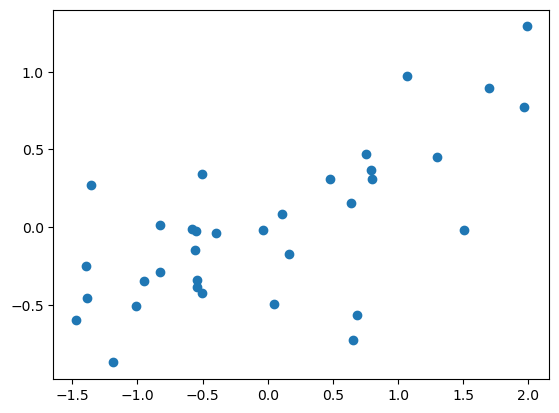

In [27]:
#年尺度
#去趋势后
indices_detrend  = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/indices_detrend.csv')
ndvi_detrend = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_detrend.csv')

indices_detrend = np.array(indices_detrend[['TXX','TXN','TNN','TNX','TX90','TX10','TN90','TN10','DTR','R1xday','R1mm','R10mm','R20mm']])
ndvi_detrend = np.array(ndvi_detrend['NDVI'])


indices_stan = np.full((34,13),fill_value=np.nan)

#标准化(按列)
for i in range(13):
    indices_stan[:,i] = preprocessing.scale(indices_detrend[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_detrend)

las= LassoCV(eps=0.1,n_alphas=10000,fit_intercept=True,cv=10).fit(indices_stan,ndvi_stan)
print(las.alpha_ )
print(las.coef_)
print(las.intercept_)
ndvi_predict = las.predict(indices_stan)
r,p=pearsonr(ndvi_stan,ndvi_predict)
print(r,p)
plt.scatter(ndvi_stan,ndvi_predict)

0.15146812091988354
[ 0.          0.          0.          0.         -0.          0.
 -0.          0.39234787 -0.02453739  0.          0.05543835  0.33812363
  0.        ]
-2.363773809256461e-15
0.756032590896476 2.3342050041595419e-07


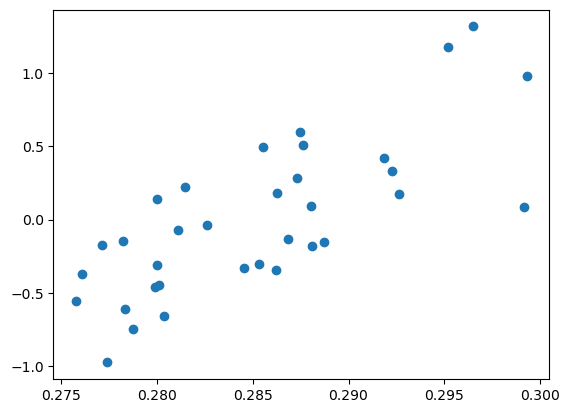

In [26]:
#年尺度
#去趋势前
indices_mean  = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/indices_mean.csv')
ndvi_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_mean.csv')

indices_mean = np.array(indices_mean[['TXX','TXN','TNN','TNX','TX90','TX10','TN90','TN10','DTR','R1xday','R1mm','R10mm','R20mm']])
ndvi_mean = np.array(ndvi_mean['NDVI'])

indices_stan = np.full((34,13),fill_value=np.nan)

#标准化(按列)
for i in range(13):
    indices_stan[:,i] = preprocessing.scale(indices_mean[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_mean)

las= LassoCV(eps=0.1,n_alphas=10000,fit_intercept=True,cv=20).fit(indices_stan,ndvi_stan)
print(las.alpha_ )
print(las.coef_)
print(las.intercept_)
ndvi_predict = las.predict(indices_stan)
r,p=pearsonr(ndvi_stan,ndvi_predict)
print(r,p)
plt.scatter(ndvi_mean,ndvi_predict)

## 月尺度

In [6]:
#导入数据
indices_mean  = np.load('/mnt/f/cn05/cn05_huabei/output/indices_month_mean.npz')
indices_month = indices_mean['month_mean408'] 
indices_month = indices_month.reshape(15,408)
delete_index = [0,10]
indices_month = np.delete(indices_month,delete_index,axis = 0)
indices_month = indices_month.transpose(1,0)

ndvi_mean = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_month_mean.npz')
ndvi_month = ndvi_mean['month_mean408']
ndvi_month = ndvi_month.reshape(408)
ndvi_month = ndvi_month/10000

#没有进行去季节化也没有标准化的序列
las= LassoCV(eps=0.1,n_alphas=10000,fit_intercept=True,cv=20).fit(indices_month,ndvi_month)
print(las.alpha_ )
print(las.coef_)
print(las.intercept_)
ndvi_predict = las.predict(indices_month)
r,p=pearsonr(ndvi_month,ndvi_predict)
print(r,p)

0.15701344701156647
[ 0.         0.         0.         0.0079812 -0.         0.
  0.         0.         0.         0.         0.         0.
  0.       ]
0.35119308239632463
0.9387198691198686 6.549128853392277e-190


In [71]:
#导入数据
indices_mean  = np.load('/mnt/f/cn05/cn05_huabei/output/indices_month_mean.npz')
indices_month = indices_mean['month_mean408'] 
indices_month = indices_month.reshape(15,408)
delete_index = [0,10]
indices_month = np.delete(indices_month,delete_index,axis = 0)
indices_month = indices_month.transpose(1,0)

ndvi_mean = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_month_mean.npz')
ndvi_month = ndvi_mean['month_mean408']
ndvi_month = ndvi_month.reshape(408)
ndvi_month = ndvi_month/10000

#没有进行去季节化也没有标准化的序列
las= LassoCV(eps=0.01,n_alphas=10000,fit_intercept=True,cv=20).fit(indices_month,ndvi_month)
print(las.alpha_ )
print(las.coef_)
print(las.intercept_)
ndvi_predict = las.predict(indices_month)
r,p=pearsonr(ndvi_month,ndvi_predict)
print(r,p)

0.01570134470115665
[-0.          0.00119005  0.          0.00702126 -0.         -0.
  0.0022088  -0.          0.00106987  0.00290054  0.          0.
  0.        ]
0.3033657126349359
0.957615806617715 1.4427574207104045e-221


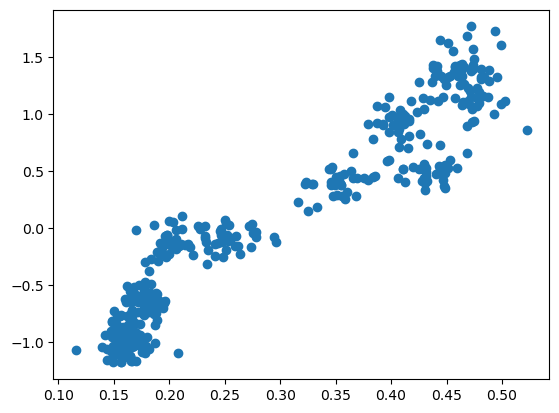

In [76]:
plt.scatter(ndvi_month,ndvi_predict)

In [11]:
#没有进行去季节化但进行标准化的序列
#导入数据
indices_mean  = np.load('/mnt/f/cn05/cn05_huabei/output/indices_month_mean.npz')
indices_month = indices_mean['month_mean408'] 
indices_month = indices_month.reshape(15,408)
delete_index = [0,10]
indices_month = np.delete(indices_month,delete_index,axis = 0)

ndvi_mean = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_month_mean.npz')
ndvi_month = ndvi_mean['month_mean408']
ndvi_month = ndvi_month.reshape(408)
ndvi_month = ndvi_month/10000

indices_stan = np.full((13,408),fill_value=np.nan)
#标准化(按列)
for i in range(13):
    indices_stan[i,:] = preprocessing.scale(indices_month[i,:])
#标准化
ndvi_stan = preprocessing.scale(ndvi_month)
#转置array数组
indices_stan = indices_stan.transpose(1,0)

las= LassoCV(eps=0.1,n_alphas=10000,fit_intercept=True,cv=10).fit(indices_stan,ndvi_stan)
print(las.alpha_ )
print(las.coef_)
print(las.intercept_)
ndvi_predict = las.predict(indices_stan)
r,p=pearsonr(ndvi_stan,ndvi_predict)
print(r,p)

0.09387198691198688
[ 0.          0.          0.          0.55860816 -0.          0.
  0.          0.          0.          0.10265264  0.21376485  0.
  0.        ]
-3.875945351036823e-17
0.9503948913584737 5.083111406705583e-208


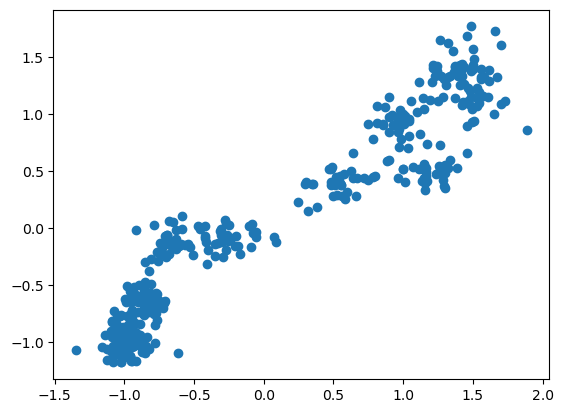

In [12]:
plt.scatter(ndvi_stan,ndvi_predict)

In [7]:
#没有进行去季节化但进行标准化的序列
#导入数据
indices_mean  = np.load('/mnt/f/cn05/cn05_huabei/output/indices_month_mean.npz')
indices_month = indices_mean['month_mean408'] 
indices_month = indices_month.reshape(15,408)
delete_index = [0,10]
indices_month = np.delete(indices_month,delete_index,axis = 0)

ndvi_mean = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_month_mean.npz')
ndvi_month = ndvi_mean['month_mean408']
ndvi_month = ndvi_month.reshape(408)
ndvi_month = ndvi_month/10000

indices_stan = np.full((13,408),fill_value=np.nan)
#标准化(按列)
for i in range(13):
    indices_stan[i,:] = preprocessing.scale(indices_month[i,:])
#标准化
ndvi_stan = preprocessing.scale(ndvi_month)
#转置array数组
indices_stan = indices_stan.transpose(1,0)

las= LassoCV(eps=0.1,n_alphas=10000,fit_intercept=True,cv=20).fit(indices_stan,ndvi_stan)
print(las.alpha_ )
print(las.coef_)
print(las.intercept_)
ndvi_predict = las.predict(indices_stan)
r,p=pearsonr(ndvi_stan,ndvi_predict)
print(r,p)

KeyboardInterrupt: 

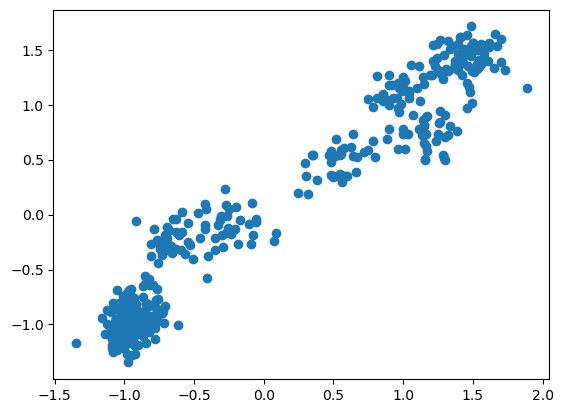

In [65]:
plt.scatter(ndvi_stan,ndvi_predict)

In [8]:
#导入数据
deseason = np.load('/mnt/f/cn05/cn05_huabei/output/month_deseason.npz')
indices_month_deseason = deseason['indices_month_deseason']
ndvi_month_deseason = deseason['ndvi_month_deseason']
ndvi_month_deseason = ndvi_month_deseason/10000
#去掉tm和pre
delete_index = [0,10]
indices_month_deseason = np.delete(indices_month_deseason,delete_index,axis = 0)

indices_stan = np.full((13,408),fill_value=np.nan)

#标准化(按列)
for i in range(13):
    indices_stan[i,:] = preprocessing.scale(indices_month_deseason[i,:])
#标准化
ndvi_stan = preprocessing.scale(ndvi_month_deseason)
#转置array数组
indices_stan = indices_stan.transpose(1,0)

#进行去季节化但没有标准化的序列
indices_month_deseason = indices_month_deseason.transpose(1,0)
las= LassoCV(eps=0.1,n_alphas=10000,fit_intercept=True,cv=34).fit(indices_month_deseason,ndvi_month_deseason)
print(las.alpha_ )
print(las.coef_)
print(las.intercept_)
ndvi_predict = las.predict(indices_month_deseason)
r,p=pearsonr(ndvi_month_deseason,ndvi_predict)
print(r,p)

0.000632600180142649
[ 0.00092547  0.00026975  0.          0.0007514   0.         -0.00062898
 -0.          0.00066367  0.00064232  0.00059512 -0.          0.
  0.        ]
7.708545351710427e-18
0.29386897027512143 1.4324770017886322e-09


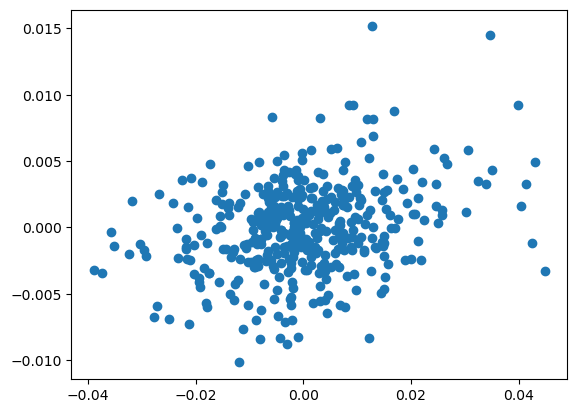

In [14]:
plt.scatter(ndvi_month_deseason/10000,ndvi_predict/10000)

In [9]:
#进行去季节化并进行标准化的序列
las= LassoCV(eps=0.1,n_alphas=10000,fit_intercept=True,cv=20).fit(indices_stan,ndvi_stan)
print(las.alpha_ )
print(las.coef_)
print(las.intercept_)
ndvi_predict = las.predict(indices_stan)
r,p=pearsonr(ndvi_stan,ndvi_predict)
print(r,p)

0.03557068621904134
[ 0.1033716   0.00562514  0.00555836  0.09770822  0.         -0.
  0.          0.02471858  0.06841187  0.         -0.          0.04402583
  0.13600387]
-2.529582361383197e-17
0.29900134887938695 7.158703597060945e-10


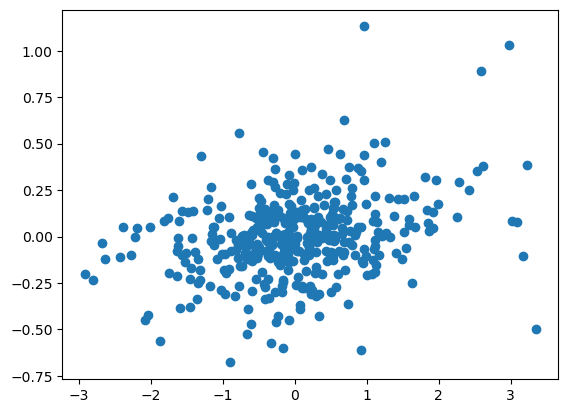

In [14]:
plt.scatter(ndvi_stan,ndvi_predict)

## RR

In [ ]:
#年尺度
#去趋势后
indices_detrend  = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/indices_detrend.csv')
ndvi_detrend = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_detrend.csv')

indices_detrend = np.array(indices_detrend[['TXX','TXN','TNN','TNX','TX90','TX10','TN90','TN10','DTR','R1xday','R1mm','R10mm','R20mm']])
ndvi_detrend = np.array(ndvi_detrend['NDVI'])

indices_stan = np.full((34,13),fill_value=np.nan)

#标准化(按列)
for i in range(13):
    indices_stan[:,i] = preprocessing.scale(indices_detrend[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_detrend)

las= LassoCV(eps=0.1,n_alphas=10000,fit_intercept=True,cv=10).fit(indices_stan,ndvi_stan)
print(las.alpha_ )
print(las.coef_)
print(las.intercept_)
ndvi_predict = las.predict(indices_stan)
r,p=pearsonr(ndvi_stan,ndvi_predict)
print(r,p)
plt.scatter(ndvi_stan,ndvi_predict)

# 月尺度

In [ ]:
#分割月
path_pre_1112 = os.path.join('/mnt/f/tudi_ndvi/1112_pre')
path_pre_1112_month = os.path.join('/mnt/f/tudi_ndvi/month/1112_pre')

path_pre_2124 = os.path.join('/mnt/f/tudi_ndvi/2124_pre')
path_pre_2124_month = os.path.join('/mnt/f/tudi_ndvi/month/2124_pre')

path_pre_3133 = os.path.join('/mnt/f/tudi_ndvi/3133_pre')
path_pre_3133_month = os.path.join('/mnt/f/tudi_ndvi/month/3133_pre')

path_tm_1112 = os.path.join('/mnt/f/tudi_ndvi/1112_tm')
path_tm_1112_month = os.path.join('/mnt/f/tudi_ndvi/month/1112_tm')

path_tm_2124 = os.path.join('/mnt/f/tudi_ndvi/2124_tm')
path_tm_2124_month = os.path.join('/mnt/f/tudi_ndvi/month/2124_tm')

path_tm_3133 = os.path.join('/mnt/f/tudi_ndvi/3133_tm')
path_tm_3133_month = os.path.join('/mnt/f/tudi_ndvi/month/3133_tm')

path_tmax_1112 = os.path.join('/mnt/f/tudi_ndvi/1112_tmax')
path_tmax_1112_month = os.path.join('/mnt/f/tudi_ndvi/month/1112_tmax')

path_tmax_2124 = os.path.join('/mnt/f/tudi_ndvi/2124_tmax')
path_tmax_2124_month = os.path.join('/mnt/f/tudi_ndvi/month/2124_tmax')

path_tmax_3133 = os.path.join('/mnt/f/tudi_ndvi/3133_tmax')
path_tmax_3133_month = os.path.join('/mnt/f/tudi_ndvi/month/3133_tmax')

path_tmin_1112 = os.path.join('/mnt/f/tudi_ndvi/1112_tmin')
path_tmin_1112_month = os.path.join('/mnt/f/tudi_ndvi/month/1112_tmin')

path_tmin_1112 = os.path.join('/mnt/f/tudi_ndvi/1112_tmin')
path_tmin_1112_month = os.path.join('/mnt/f/tudi_ndvi/month/1112_tmin')

path_tmin_2124 = os.path.join('/mnt/f/tudi_ndvi/2124_tmin')
path_tmin_2124_month = os.path.join('/mnt/f/tudi_ndvi/month/2124_tmin')

path_tmin_3133 = os.path.join('/mnt/f/tudi_ndvi/3133_tmin')
path_tmin_3133_month = os.path.join('/mnt/f/tudi_ndvi/month/3133_tmin')

indices_input = [path_pre_1112,path_pre_2124,path_pre_3133,path_tm_1112,path_tm_2124,path_tm_3133,path_tmin_1112,path_tmin_2124,path_tmin_3133]
indices_output = [path_pre_1112_month,path_pre_2124_month,path_pre_3133_month,path_tm_1112_month,path_tm_2124_month,path_tm_3133_month,path_tmin_1112_month,path_tmin_2124_month,path_tmin_3133_month]

for (path_in,path_out) in zip(indices_input,indices_output):
    filename = os.listdir(path_in)
    for file in filename:
        inputfile = os.path.join(path_in,file)
        outputfile = os.path.join(path_out,file)
        cdo.splityearmon(input = inputfile,output = outputfile)

In [44]:
#区划变量,用作随时更改,便于重复操作
re_area = '3133'

## 查看农田类型的植被

In [5]:
ndvi_farm = xr.open_dataset('/mnt/f/tudi_ndvi/1112_ndvi/huabei_ndvi3g_geo_v1_2015_01.nc4')
ndvi = ndvi_farm.ndvi

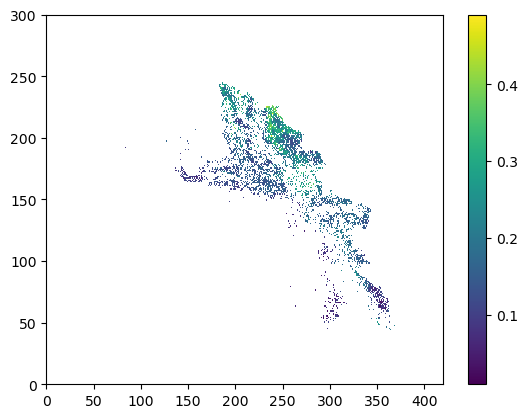

In [6]:
plt.pcolormesh(ndvi[0]/10000)
plt.colorbar()

## TXX&TXN

In [24]:
#添加字符串，增加tmax，为日最高气温变量
area_tmax = re_area+'_tmax' 

#计算TXX（日最高温的最大值）和TXN（日最高温的最小值）
#定义函数 axis=0 指每个格点的时间轴上的最大值
def TX_index_TXx(tx):
    TXx=np.amax(tx, axis=0)
    return TXx

def TX_index_TXn(tx):
    TXn=np.amin(tx, axis=0)
    return TXn

#os.path.join 用来连接文件夹路径
path_tmax = os.path.join('/mnt/f/tudi_ndvi/month/',area_tmax)
filename_tmax = os.listdir(path_tmax)

#创建每点都为np.nan的array数组,时间为408月，纬度101，经度141
TXx_month =np.full((408,101,141),fill_value=np.nan)
TXn_month =np.full((408,101,141),fill_value=np.nan)

#将最高温文件夹内的每一个文件遍历操作
#存储进创建的408*101*141的数组里

i = 0
for file_tmax in filename_tmax:
    inputfile_tmax = os.path.join(path_tmax,file_tmax)
    tmax_month = xr.open_dataset(inputfile_tmax)
    TXx_month[i,:,:] = TX_index_TXx(tmax_month.tmax)
    TXn_month[i,:,:] = TX_index_TXn(tmax_month.tmax)
    i = i + 1

## TNN & TNX

In [25]:
#添加字符串，增加tmin，为日最低气温变量
area_tmin = re_area+'_tmin' 
#计算TNN（日最低温的最小值）和TNX（日最低气温的最大值）
#定义函数 axis=0 指每个格点的时间轴上的最小值
def TN_index_TNn(tn):
    TNn=np.amin(tn, axis=0)
    return TNn

def TN_index_TNX(tn):
    TNx=np.amax(tn, axis=0)
    return TNx

#os.path.join 用来连接文件夹路径
path_tmin = os.path.join('/mnt/f/tudi_ndvi/month/',area_tmin)
filename_tmin = os.listdir(path_tmin)

#创建每点都为np.nan的array数组,时间为34年，纬度101，经度141
TNn_month =np.full((408,101,141),fill_value=np.nan)
TNx_month =np.full((408,101,141),fill_value=np.nan)

#将最低温文件夹内的每一个文件遍历操作
#存储进创建的408*101*141的数组里
i=0
for file_tmin in filename_tmin:
    inputfile_tmin = os.path.join(path_tmin,file_tmin)
    tmin_month = xr.open_dataset(inputfile_tmin)
    TNn_month[i,:,:] = TN_index_TNn(tmin_month.tmin)
    TNx_month[i,:,:] = TN_index_TNX(tmin_month.tmin)
    i = i + 1

## DTR

In [26]:
#添加字符串，增加tmax，为日最低气温变量
area_tmax = re_area+'_tmax'
#添加字符串，增加tmin，为日最低气温变量
area_tmin = re_area+'_tmin'

#计算DTR（气温日较差的平均值）
#定义函数，axis=0表示每个格点的时间轴上的平均值
def TXTN_index_DTR(tx,tn):
    txtndtr=tx-tn
    DTR=np.mean(txtndtr,axis=0)
    return DTR

#os.path.join 用来连接文件夹路径
path_tmax = os.path.join('/mnt/f/tudi_ndvi/month/',area_tmax)
path_tmin = os.path.join('/mnt/f/tudi_ndvi/month/',area_tmin)
filename_tmax = os.listdir(path_tmax)
filename_tmin = os.listdir(path_tmin)

#创建每点都为np.nan的array数组,时间为408月，纬度101，经度141
DTR_month =np.full((408,101,141),fill_value=np.nan)

#将最低和最高温文件夹内的每一个文件遍历操作
#存储进创建的408*101*141的数组里

i=0
for (file_tmax,file_tmin) in zip(filename_tmax,filename_tmin):
    inputfile_tmax = os.path.join(path_tmax,file_tmax)
    inputfile_tmin = os.path.join(path_tmin,file_tmin)
    tmax_month = xr.open_dataset(inputfile_tmax)
    tmin_month = xr.open_dataset(inputfile_tmin)
    DTR_month[i,:,:] = TXTN_index_DTR(tmax_month.tmax,tmin_month.tmin)
    i = i + 1

## TX90&TX10

In [27]:
#其中有一些华北地区内的格点的值是0，此处不能够直接将所有0值变成np.nan，所以找了一个没有0值的进行规范范围。
area = TXx_month.copy()
area[np.isnan(area)]=0

In [28]:
#添加字符串，增加tmax，为日最低气温变量
area_tmax = re_area+'_tmax'

#计算TX90（日最高气温>90分位值日数）和TX10（日最高气温<10分位值日数）
#用每个格点减去分位值
#np.where：符合条件大于/小于0时赋值1，否则赋值为np.nan
def TX_index_TX90p(tx,tx90th):
    dtx=tx-tx90th
    dtx01=np.where(dtx>0,1,np.nan)
    TX90p=np.nansum(dtx01,axis=0)
    return TX90p

def TX_index_TX10p(tx,tx10th):
    dtx=tx-tx10th
    dtx01=np.where(dtx<0,1,np.nan)
    TX10p=np.nansum(dtx01,axis=0)
    return TX10p

#计算90分位值和10分位值
tmax1982_2015 = xr.open_dataset('/mnt/f/cn05/cn05_huabei/huabeicn05.1_tmax_1982_2015.nc')
tmax90 = np.nanpercentile(tmax1982_2015.tmax,90,axis=0)
tmax10 = np.nanpercentile(tmax1982_2015.tmax,10,axis=0)

#os.path.join 用来连接文件夹路径
path_tmax = os.path.join('/mnt/f/tudi_ndvi/month/',area_tmax)
filename_tmax = os.listdir(path_tmax)

#创建每点都为np.nan的array数组,时间为408月，纬度101，经度141
TX90_month =np.full((408,101,141),fill_value=np.nan)
TX10_month =np.full((408,101,141),fill_value=np.nan)

i = 0
for file_tmax in filename_tmax:
    inputfile_tmax = os.path.join(path_tmax,file_tmax)
    tmax_month = xr.open_dataset(inputfile_tmax)
    TX90_month[i,:,:] = TX_index_TX90p(tmax_month.tmax,tmax90)
    TX10_month[i,:,:] = TX_index_TX10p(tmax_month.tmax,tmax10)
    i = i + 1

TX90_month[area==0] = np.nan
TX10_month[area==0] = np.nan


/home/yqr/miniconda3/envs/python/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


## TN90 & TN10

In [29]:
#添加字符串，增加tmin，为日最低气温变量
area_tmin = re_area+'_tmin'

#计算TN90（日最低气温>90分位值日数）和TN10（日最低气温<10分位值日数）
#用每个格点减去分位值
#np.where：符合条件大于/小于0时赋值1，否则赋值为np.nan
def TN_index_TN90p(tn,tn90th):
    dtn=tn-tn90th
    dtn01=np.where(dtn>0,1,np.nan)
    TN90p=np.nansum(dtn01,axis = 0)
    return TN90p

def TN_index_TN10p(tn,tn10th):
    dtn=tn-tn10th
    dtn01=np.where(dtn<0,1,np.nan)
    TN10p=np.nansum(dtn01,axis=0)
    return TN10p

#计算90分位值和10分位值
tmin1982_2015 = xr.open_dataset('/mnt/f/cn05/cn05_huabei/huabeicn05.1_tmin_1982_2015.nc')
tmin90 = np.nanpercentile(tmin1982_2015.tmin,90,axis=0)
tmin10 = np.nanpercentile(tmin1982_2015.tmin,10,axis=0)

#os.path.join 用来连接文件夹路径
path_tmin = os.path.join('/mnt/f/tudi_ndvi/month/',area_tmin)
filename_tmin = os.listdir(path_tmin)

#创建每点都为np.nan的array数组,时间为408月，纬度101，经度141
TN90_month =np.full((408,101,141),fill_value=np.nan)
TN10_month =np.full((408,101,141),fill_value=np.nan)

i = 0
for file_tmin in filename_tmin:
    inputfile_tmin = os.path.join(path_tmin,file_tmin)
    tmin_month = xr.open_dataset(inputfile_tmin)
    TN90_month[i,:,:] = TN_index_TN90p(tmin_month.tmin,tmin90)
    TN10_month[i,:,:] = TN_index_TN10p(tmin_month.tmin,tmin10)
    i = i + 1

TN90_month[area==0] = np.nan
TN10_month[area==0] = np.nan

/home/yqr/miniconda3/envs/python/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


## pre inidices

In [ ]:
#此处开始使用cdo (python内利用os.system 调用cdo)
#os.path.join 用来连接文件夹路径
path_pre = os.path.join('/mnt/f/cn05/cn05_huabei/month/pre')
filename_pre = os.listdir(path_pre)

path_rx1day = os.path.join('/mnt/f/cn05/cn05_huabei/month/rx1day')
path_r1mm = os.path.join('/mnt/f/cn05/cn05_huabei/month/r1mm')
path_r10mm = os.path.join('/mnt/f/cn05/cn05_huabei/month/r10mm')
path_r20mm = os.path.join('/mnt/f/cn05/cn05_huabei/month/r20mm')

for file_pre in filename_pre:
    inputfile_pre = os.path.join(path_pre,file_pre)
    outputfile_rx1day = os.path.join(path_rx1day)
    outputfile_r1mm = os.path.join(path_r1mm)
    outputfile_r10mm = os.path.join(path_r10mm)
    outputfile_r20mm = os.path.join(path_r20mm)
    cdo.eca_rx1day(input=inputfile_pre,output=outputfile_rx1day)
    cdo.eca_pd('1',input=inputfile_pre,output=outputfile_r1mm)
    cdo.eca_pd('10',input=inputfile_pre,output=outputfile_r10mm)
    cdo.eca_pd('20',input=inputfile_pre,output=outputfile_r20mm)

In [ ]:
#此处开始使用cdo (python内利用os.system 调用cdo)
#os.path.join 用来连接文件夹路径
path_pre_1112 = os.path.join('/mnt/f/tudi_ndvi/month/1112_pre')
path_pre_2124 = os.path.join('/mnt/f/tudi_ndvi/month/2124_pre')
path_pre_3133 = os.path.join('/mnt/f/tudi_ndvi/month/3133_pre')

pre_list =[path_pre_1112,path_pre_2124,path_pre_3133]

path_rx1day_1112 = os.path.join('/mnt/f/tudi_ndvi/month/1112_rx1day')
path_rx1day_2124 = os.path.join('/mnt/f/tudi_ndvi/month/2124_rx1day')
path_rx1day_3133 = os.path.join('/mnt/f/tudi_ndvi/month/3133_rx1day')

rx1day_list =[path_rx1day_1112,path_rx1day_2124,path_rx1day_3133]

path_r1mm_1112 = os.path.join('/mnt/f/tudi_ndvi/month/1112_r1mm')
path_r1mm_2124 = os.path.join('/mnt/f/tudi_ndvi/month/2124_r1mm')
path_r1mm_3133 = os.path.join('/mnt/f/tudi_ndvi/month/3133_r1mm')

r1mm_list =[path_r1mm_1112,path_r1mm_2124,path_r1mm_3133]

path_r10mm_1112 = os.path.join('/mnt/f/tudi_ndvi/month/1112_r10mm')
path_r10mm_2124 = os.path.join('/mnt/f/tudi_ndvi/month/2124_r10mm')
path_r10mm_3133 = os.path.join('/mnt/f/tudi_ndvi/month/3133_r10mm')

r10mm_list =[path_r10mm_1112,path_r10mm_2124,path_r10mm_3133]

path_r20mm_1112 = os.path.join('/mnt/f/tudi_ndvi/month/1112_r20mm')
path_r20mm_2124 = os.path.join('/mnt/f/tudi_ndvi/month/2124_r20mm')
path_r20mm_3133 = os.path.join('/mnt/f/tudi_ndvi/month/3133_r20mm')

r20mm_list =[path_r20mm_1112,path_r20mm_2124,path_r20mm_3133]

for (path_pre,path_rx1day,path_r1mm,path_r10mm,path_r20mm) in zip(pre_list,rx1day_list,r1mm_list,r10mm_list,r20mm_list):
    filename_pre = os.listdir(path_pre)
    for file_pre in filename_pre:
        inputfile_pre = os.path.join(path_pre,file_pre)
        outputfile_rx1day = os.path.join(path_rx1day,file_pre)
        outputfile_r1mm = os.path.join(path_r1mm,file_pre)
        outputfile_r10mm = os.path.join(path_r10mm,file_pre)
        outputfile_r20mm = os.path.join(path_r20mm,file_pre)
        cdo.eca_rx1day(input=inputfile_pre,output=outputfile_rx1day)
        cdo.eca_pd('1',input=inputfile_pre,output=outputfile_r1mm)
        cdo.eca_pd('10',input=inputfile_pre,output=outputfile_r10mm)
        cdo.eca_pd('20',input=inputfile_pre,output=outputfile_r20mm)

In [30]:
#添加字符串，增加tmin，为日最低气温变量
area_rx1day = re_area+'_rx1day'
area_r1mm = re_area+'_r1mm'
area_r10mm = re_area+'_r10mm'
area_r20mm = re_area+'_r20mm'

#连接文件夹途径
path_rx1day = os.path.join('/mnt/f/tudi_ndvi/month/',area_rx1day)
path_r1mm = os.path.join('/mnt/f/tudi_ndvi/month/',area_r1mm)
path_r10mm = os.path.join('/mnt/f/tudi_ndvi/month/',area_r10mm)
path_r20mm = os.path.join('/mnt/f/tudi_ndvi/month/',area_r20mm)
filename_rx1day = os.listdir(path_rx1day)
filename_r1mm = os.listdir(path_r1mm)
filename_r10mm = os.listdir(path_r10mm)
filename_r20mm = os.listdir(path_r20mm)

#创建每点都为np.nan的array数组,时间为408月，纬度101，经度141
Rx1day_month = np.full((408,101,141),fill_value=np.nan)
R1mm_month = np.full((408,101,141),fill_value=np.nan)
R10mm_month = np.full((408,101,141),fill_value=np.nan)
R20mm_month = np.full((408,101,141),fill_value=np.nan)

#将每年的数据录入到一个数组里
i = 0
for file_rx1day in filename_rx1day:
    inputfile_rx1day = os.path.join(path_rx1day,file_rx1day)
    rx1day_area = xr.open_dataset(inputfile_rx1day)
    Rx1day_month[i,:,:] = rx1day_area.highest_one_day_precipitation_amount_per_time_period
    i = i + 1  
    
i = 0
for file_r1mm in filename_r1mm:
    inputfile_r1mm = os.path.join(path_r1mm,file_r1mm)
    r1mm_area = xr.open_dataset(inputfile_r1mm)
    R1mm_month[i,:,:] = r1mm_area.precipitation_days_index_per_time_period
    i = i + 1
    
i = 0
for file_r10mm in filename_r10mm:
    inputfile_r10mm = os.path.join(path_r10mm,file_r10mm)
    r10mm_area = xr.open_dataset(inputfile_r10mm)
    R10mm_month[i,:,:] = r10mm_area.precipitation_days_index_per_time_period
    i = i + 1
    
i = 0
for file_r20mm in filename_r20mm:
    inputfile_r20mm = os.path.join(path_r20mm,file_r20mm)
    r20mm_area = xr.open_dataset(inputfile_r20mm)
    R20mm_month[i,:,:] = r20mm_area.precipitation_days_index_per_time_period
    i = i + 1

## Tm & pre

In [31]:
#添加字符串，增加tm，为日最低气温变量
area_tm = re_area+'_tm'
#添加字符串，增加pre，为日降水变量
area_pre = re_area+'_pre'

#os.path.join 用来连接文件夹路径
path_pre = os.path.join('/mnt/f/tudi_ndvi/month/',area_pre)
path_tm = os.path.join('/mnt/f/tudi_ndvi/month/',area_tm)
filename_pre = os.listdir(path_pre)
filename_tm = os.listdir(path_tm)

#创建每点都为np.nan的array数组,时间为408月，每个格点的月平均
pre_month = np.full((408,101,141),fill_value=np.nan)
tm_month = np.full((408,101,141),fill_value=np.nan)

i = 0
for file_pre in filename_pre:
    inputfile_pre = os.path.join(path_pre,file_pre)
    pre_m = xr.open_dataset(inputfile_pre) 
    pre_month[i,:,:] = np.nanmean(pre_m.pre,axis = 0)
    i = i + 1

i = 0
for file_tm in filename_tm:
    inputfile_tm = os.path.join(path_tm,file_tm)
    tm_m = xr.open_dataset(inputfile_tm)
    tm_month[i,:,:] = np.nanmean(tm_m.tm,axis = 0) 
    i = i + 1

/tmp/ipykernel_158/3047324519.py:20: RuntimeWarning: Mean of empty slice
  pre_month[i,:,:] = np.nanmean(pre_m.pre,axis = 0)
/tmp/ipykernel_158/3047324519.py:27: RuntimeWarning: Mean of empty slice
  tm_month[i,:,:] = np.nanmean(tm_m.tm,axis = 0)
/tmp/ipykernel_158/3047324519.py:27: RuntimeWarning: Mean of empty slice
  tm_month[i,:,:] = np.nanmean(tm_m.tm,axis = 0)
/tmp/ipykernel_158/3047324519.py:27: RuntimeWarning: Mean of empty slice
  tm_month[i,:,:] = np.nanmean(tm_m.tm,axis = 0)
/tmp/ipykernel_158/3047324519.py:27: RuntimeWarning: Mean of empty slice
  tm_month[i,:,:] = np.nanmean(tm_m.tm,axis = 0)
/tmp/ipykernel_158/3047324519.py:27: RuntimeWarning: Mean of empty slice
  tm_month[i,:,:] = np.nanmean(tm_m.tm,axis = 0)
/tmp/ipykernel_158/3047324519.py:27: RuntimeWarning: Mean of empty slice
  tm_month[i,:,:] = np.nanmean(tm_m.tm,axis = 0)
/tmp/ipykernel_158/3047324519.py:27: RuntimeWarning: Mean of empty slice
  tm_month[i,:,:] = np.nanmean(tm_m.tm,axis = 0)
/tmp/ipykernel_158/30

In [32]:
#输出数据
np.savez('/mnt/f/tudi_ndvi/month/output/3133_indices_month.npz',TM = tm_month,TXX = TXx_month,TXN=TXn_month,TNX = TNx_month,TNN = TNn_month,DTR = DTR_month,TX90 = TX90_month,TX10 = TX10_month,TN90 =TN90_month,TN10 = TN10_month,pre = pre_month,Rx1day = Rx1day_month,R1mm = R1mm_month,R10mm = R10mm_month,R20mm = R20mm_month)

## 月平均

In [45]:
#添加字符串，增加tm，为日最低气温变量
area_indices = re_area+'_indices_month.npz'
#所有的1月，所有的2月，所有的3月……做平均
#极端气候指数

#导入数据
#os.path.join 用来连接文件夹路径
path = os.path.join('/mnt/f/tudi_ndvi/month/output/',area_indices)
month = np.load(path)
indices_month = np.array([month['TM'],month['TXX'],month['TXN'],month['TNX'],month['TNN'],month['DTR'],month['TX90'],month['TX10'],month['TN90'],month['TN10'],month['pre'],month['Rx1day'],month['R1mm'],month['R10mm'],month['R20mm']])

month_mean408 = np.full((15,408),fill_value=np.nan)
month_mean12 = np.full((15,12),fill_value = np.nan)


for k in range(15):
    for i in range(408):
        month_mean408[k,i] = np.nanmean(indices_month[k,i,:,:])

month_mean408 = month_mean408.reshape(15,34,12)

for k in range(15):
    for i in range(12):
        month_mean12[k,i]= np.nanmean(month_mean408[k,:,i])


In [46]:
#所有的1月，所有的2月，所有的3月……做平均
#NDVI

#添加字符串
area_ndvi = re_area+'_ndvi_year.npz'

#导入数据
#os.path.join 用来连接文件夹路径
path = os.path.join('/mnt/f/tudi_ndvi/output/',area_ndvi)
month = np.load(path)
ndvi_month = np.array(month['NDVI_month'])

ndvi_month_mean408 = np.full(408,fill_value=np.nan)
ndvi_month_mean12 = np.full(12,fill_value = np.nan)

for i in range(408):
    ndvi_month_mean408[i] = np.nanmean(ndvi_month[i,:,:])

ndvi_month_mean408 = ndvi_month_mean408.reshape(34,12)

ndvi_month_mean12 = np.nanmean(ndvi_month_mean408,axis=0)

In [47]:
#输出数据
np.savez('/mnt/f/tudi_ndvi/month/output/3133_indices_month_mean.npz',month_mean408 = month_mean408,month_mean12=month_mean12)
np.savez('/mnt/f/tudi_ndvi/month/output/3133_ndvi_month_mean.npz',month_mean408 = ndvi_month_mean408,month_mean12=ndvi_month_mean12)

## 月尺度去趋势

In [52]:

#os.path.join 用来连接文件夹路径
path = os.path.join('/mnt/f/cn05/cn05_huabei/output/indices_month_mean.npz')
indices_month = np.load(path)
indices_month = np.array(indices_month['month_mean408'])

path = os.path.join('/mnt/f/cn05/cn05_huabei/output/ndvi_month_mean.npz')
ndvi_month = np.load(path)
ndvi_month = np.array(ndvi_month['month_mean408'])


#建造np.nan填充的数组
indices_month_detrend = np.full((15,34,12),fill_value=np.nan)

#遍历数组每一列
for k in range(15): 
    for i in range(12):
        indices_month_detrend[k,:,i] = signal.detrend(indices_month[k,:,i],type='linear')


#建造np.nan填充的数组
ndvi_month_detrend = np.full((34,12),fill_value=np.nan)

#遍历数组每一列
for i in range(12):
    ndvi_month_detrend[:,i] = signal.detrend(ndvi_month[:,i],type='linear')

In [63]:
np.savez('/mnt/f/cn05/cn05_huabei/output/month_detrend.npz',indices_month_detrend = indices_month_detrend,ndvi_month_detrend=ndvi_month_detrend)

## 月尺度相关性系数

In [64]:
#区划变量,用作随时更改,便于重复操作
re_area = '3133'

In [55]:
#导入数据
#添加字符串
area_indices_month_mean = re_area+'_indices_month_mean.npz'
area_ndvi_month_mean = re_area+'_ndvi_month_mean.npz'

#os.path.join 用来连接文件夹路径
path = os.path.join('/mnt/f/tudi_ndvi/month/output/',area_indices_month_mean)
indices_month = np.load(path)
indices_month = np.array(indices_month['month_mean408'])

path = os.path.join('/mnt/f/tudi_ndvi/month/output/',area_ndvi_month_mean)
ndvi_month = np.load(path)
ndvi_month = np.array(ndvi_month['month_mean408'])

#建造np.nan填充的数组
indices_month_r = np.full((15,12),fill_value=np.nan)
indices_month_p = np.full((15,12),fill_value=np.nan)

#进行相关性分析
for k in range(15):
    for i in range(12):
        indices_month_r[k,i],indices_month_p[k,i] = pearsonr(indices_month[k,:,i],ndvi_month[:,i])

In [56]:
#输出数据
np.savez('/mnt/f/tudi_ndvi/month/output/3133_month_correlation.npz',indices_month_r = indices_month_r,indices_month_p=indices_month_p)

In [58]:
#去季节化相关性
#曹 这跟去季节前一样啊
month_deseason = np.load('/mnt/f/cn05/cn05_huabei/output/month_deseason.npz')
indices_month_deseason = month_deseason['indices_month_deseason']
ndvi_month_deseason = month_deseason['ndvi_month_deseason']

indices_month_deseason = indices_month_deseason.reshape(15,34,12)
ndvi_month_deseason = ndvi_month_deseason.reshape(34,12)

#建造np.nan填充的数组
indices_month_r = np.full((15,12),fill_value=np.nan)
indices_month_p = np.full((15,12),fill_value=np.nan)

#进行相关性分析
for k in range(15):
    for i in range(12):
        indices_month_r[k,i],indices_month_p[k,i] = pearsonr(indices_month_deseason[k,:,i],ndvi_month_deseason[:,i])

fig=plt.figure(figsize=(15,12))
r = sns.heatmap(indices_month_r,cmap= 'PRGn',annot=True,center=0)
plt.xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5],(1,2,3,4,5,6,7,8,9,10,11,12))
plt.yticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5],('Tm','TXX', 'TXN', 'TNX', 'TNN', 'DTR','TX90', 'TX10', 'TN90', 'TN10',  'pre','R1xday', 'R1mm', 'R10mm', 'R20mm'))
plt.xlabel('month')
plt.ylabel('climate extremes indices')

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


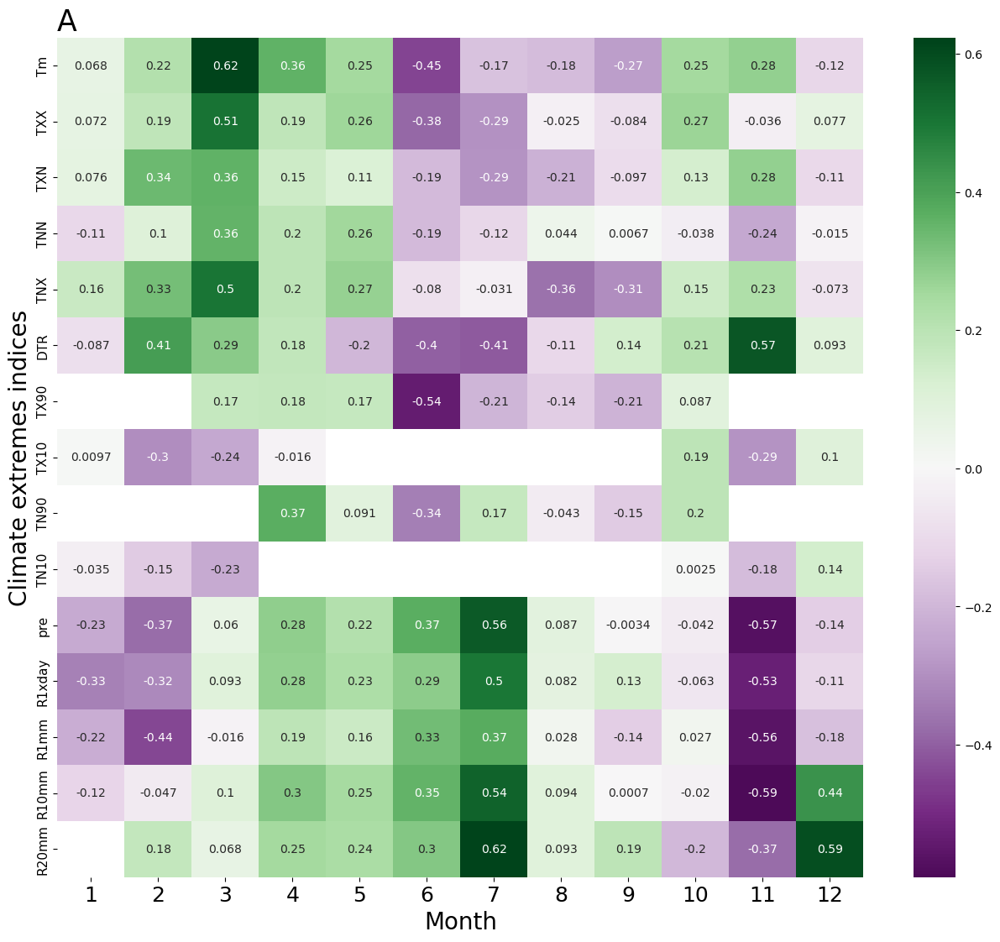

In [20]:
#去趋势后相关性指数

detrend = np.load('/mnt/f/cn05/cn05_huabei/output/month_detrend.npz')
indices_month_detrend = detrend['indices_month_detrend']
ndvi_month_detrend = detrend['ndvi_month_detrend']

#建造np.nan填充的数组
indices_month_r = np.full((15,12),fill_value=np.nan)
indices_month_p = np.full((15,12),fill_value=np.nan)

#进行相关性分析
for k in range(15):
    for i in range(12):
        indices_month_r[k,i],indices_month_p[k,i] = pearsonr(indices_month_detrend[k,:,i],ndvi_month_detrend[:,i])

fig=plt.figure(figsize=(12,10))
ax = fig.add_axes([0.0,0.0,1,1])
r = sns.heatmap(indices_month_r,cmap= 'PRGn',annot=True,center=0)
ax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5],(1,2,3,4,5,6,7,8,9,10,11,12),fontsize=18)
ax.set_yticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5],('Tm','TXX', 'TXN', 'TNX', 'TNN', 'DTR','TX90', 'TX10', 'TN90', 'TN10',  'pre','R1xday', 'R1mm', 'R10mm', 'R20mm'),fontsize=11)
ax.set_xlabel('Month',fontsize=20)
ax.set_ylabel('Climate extremes indices',fontsize=20)
ax.set_title('A ',fontsize=25,loc='left')


fig.savefig('/mnt/f/others/图片/output/month_r.eps',format='pdf',dpi=600,bbox_inches = 'tight')
fig.savefig('/mnt/f/others/图片/output/month_r.tiff',format='tiff',dpi=600,bbox_inches = 'tight')
fig.savefig('/mnt/f/others/图片/output/month_r.jpg',format='jpg',dpi=600,bbox_inches = 'tight')


## 每个月NDVI与年变化做相关：年内异质性

In [46]:
#导入文件
ndvi_month = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_month_mean.npz')
ndvi_month = np.array(ndvi_month['month_mean408'])
ndvi_year = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_mean.csv')
ndvi_year = ndvi_year['NDVI']

#建造np.nan填充的数组
ndvi_month_r = np.full((12),fill_value=np.nan)
ndvi_month_p = np.full((12),fill_value=np.nan)


#进行相关性分析
for i in range(12):
    ndvi_month_r[i],ndvi_month_p[i] = pearsonr(ndvi_month[:,i],ndvi_year)

In [49]:
#输出数组
np.savez('/mnt/f/cn05/cn05_huabei/output/month_correlation.npz',indices_month_r = indices_month_r,indices_month_p=indices_month_p,ndvi_month_r = ndvi_month_r,ndvi_month_p = ndvi_month_p)

## 去季节化

In [28]:
#减去每个月的均值
#载入数据
indices_mean  = np.load('/mnt/f/cn05/cn05_huabei/output/indices_month_mean.npz')
indices_month = indices_mean['month_mean408']
indices_month_mean = indices_mean['month_mean12']

ndvi_mean = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_month_mean.npz')
ndvi_month = ndvi_mean['month_mean408']
ndvi_month = ndvi_month/10000
ndvi_month_mean = ndvi_mean['month_mean12']
ndvi_month_mean = ndvi_month_mean/10000

indices_month_deseason = np.full((15,34,12),fill_value=np.nan)
ndvi_month_deseason = np.full((34,12),fill_value=np.nan)
#每年每个月的值 减去 该月多年的均值
for k in range(15):
    for i in range(12):
        indices_month_deseason[k,:,i] = indices_month[k,:,i] - indices_month_mean[k,i]

for i in range(12):
        ndvi_month_deseason[:,i] = ndvi_month[:,i] - ndvi_month_mean[i]

indices_month_deseason = indices_month_deseason.reshape(15,408)
ndvi_month_deseason = ndvi_month_deseason.reshape(408)

In [32]:
#输出去趋势后NDVI和极端气候指数
np.savez('/mnt/f/cn05/cn05_huabei/output/month_deseason.npz',indices_month_deseason = indices_month_deseason,ndvi_month_deseason = ndvi_month_deseason)

In [107]:
#减去每个月的均值
#载入数据
indices_mean  = np.load('/mnt/f/tudi_ndvi/month/output/3133_indices_month_mean.npz')
indices_month = indices_mean['month_mean408']
indices_month_mean = indices_mean['month_mean12']

ndvi_mean = np.load('/mnt/f/tudi_ndvi/month/output/3133_ndvi_month_mean.npz')
ndvi_month = ndvi_mean['month_mean408']
ndvi_month = ndvi_month/10000
ndvi_month_mean = ndvi_mean['month_mean12']
ndvi_month_mean = ndvi_month_mean/10000

indices_month_deseason = np.full((15,34,12),fill_value=np.nan)
ndvi_month_deseason = np.full((34,12),fill_value=np.nan)
#每年每个月的值 减去 该月多年的均值
for k in range(15):
    for i in range(12):
        indices_month_deseason[k,:,i] = indices_month[k,:,i] - indices_month_mean[k,i]

for i in range(12):
        ndvi_month_deseason[:,i] = ndvi_month[:,i] - ndvi_month_mean[i]

indices_month_deseason = indices_month_deseason.reshape(15,408)
ndvi_month_deseason = ndvi_month_deseason.reshape(408)

#输出去趋势后NDVI和极端气候指数
np.savez('/mnt/f/tudi_ndvi/month/output/3133_month_deseason.npz',indices_month_deseason = indices_month_deseason,ndvi_month_deseason = ndvi_month_deseason)

In [27]:
#每个格点去季节化
month = np.load('/mnt/f/cn05/cn05_huabei/output/indices_month.npz')
indices_month = np.array([month['TM'],month['TXX'],month['TXN'],month['TNX'],month['TNN'],month['DTR'],month['TX90'],month['TX10'],month['TN90'],month['TN10'],month['pre'],month['Rx1day'],month['R1mm'],month['R10mm'],month['R20mm']])
indices_month_408 = indices_month.reshape(15,34,12,101,141)
indices_month_12 = np.full((15,12,101,141),fill_value = np.nan)

for k in range(15):
    for i in range(12):
        indices_month_12[k,i,:,:]= np.nanmean(indices_month_408[k,:,i,:,:])


ndvi_year = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_bic.npz')
ndvi_month = ndvi_year['NDVI_month_bic']
ndvi_month_408 = ndvi_month.reshape(34,12,101,141)
ndvi_month_12 = np.full((12,101,141),fill_value = np.nan)

for i in range(12):
    ndvi_month_12[i,:,:]= np.nanmean(ndvi_month_408[:,i,:,:])

indices_deseason = np.full((15,34,12,101,141),fill_value=np.nan)
ndvi_deseason = np.full((34,12,101,141),fill_value=np.nan)

#每年每个月的值 减去 该月多年的均值

for k in range(15):
    for i in range(12):
        for m in range(101):
            for n in range(141):
                    indices_deseason[k,:,i,m,n] = indices_month_408[k,:,i,m,n] - indices_month_12[k,i,m,n]
        

for i in range(12):
    for m in range(101):
            for n in range(141):
                ndvi_deseason[:,i,m,n] = ndvi_month_408[:,i,m,n] - ndvi_month_12[i,m,n]
 

In [33]:
#输出去趋势后NDVI和极端气候指数
np.savez('/mnt/f/cn05/cn05_huabei/output/deseason.npz',indices_deseason = indices_deseason,ndvi_deseason = ndvi_deseason)

## 月度 indices/ndvi 变化趋势

In [65]:
#导入数据
#添加字符串
area_indices_month_mean = re_area+'_indices_month_mean.npz'
area_ndvi_month_mean = re_area+'_ndvi_month_mean.npz'

#载入数据
#os.path.join 用来连接文件夹路径
path = os.path.join('/mnt/f/tudi_ndvi/month/output/',area_indices_month_mean)
indices_month = np.load(path)
indices_month = np.array(indices_month['month_mean408'])

path = os.path.join('/mnt/f/tudi_ndvi/month/output/',area_ndvi_month_mean)
ndvi_month = np.load(path)
ndvi_month = np.array(ndvi_month['month_mean408'])
ndvi_month = ndvi_month/10000

indices_month_trend = np.full((15,12),fill_value=np.nan)
indices_month_trend_p = np.full((15,12),fill_value=np.nan)

ndvi_month_trend = np.full((12),fill_value=np.nan)
ndvi_month_trend_p = np.full((12),fill_value=np.nan)

year = np.arange(1982,2016,1)

#遍历数组每一列
for j in range(15): 
    for i in range(12):
        indices_month_trend[j,i],_,_,indices_month_trend_p[j,i],_ = linregress(year,indices_month[j,:,i])

for i in range(12):
    ndvi_month_trend[i],_,_,ndvi_month_trend_p[i],_ = linregress(year,ndvi_month[:,i])

In [66]:
#两个array合成一个
indices_slope = np.concatenate((indices_month_trend,indices_month_trend_p),axis=1)
ndvi_slope = np.concatenate((ndvi_month_trend,ndvi_month_trend_p))
ndvi_slope = ndvi_slope.reshape(1,24)
slope = np.concatenate((indices_slope,ndvi_slope),axis=0)
slope = slope.transpose(1,0)

#输出csv
column = ['Tm','TXX','TXN','TNN','TNX','TX90','TX10','TN90','TN10','DTR','pre','R1xday','R1mm','R10mm','R20mm','NDVI']
slope_p = pd.DataFrame(columns=column,data=slope)
slope_p.to_csv('/mnt/f/tudi_ndvi/month/output/3133_month_slope.csv')

## 时滞性分析

In [68]:
#去季节化

#读取npz文件
indices_month =  np.load('/mnt/f/cn05/cn05_huabei/output/indices_month.npz')

#其中有一些华北地区内的格点的值是0，此处不能够直接将所有0值变成np.nan，所以找了一个没有0值的进行规范范围。
TXX_month = np.array(indices_month['TXX'])
area = TXX_month.copy()
area[np.isnan(area)]=0

deseason = np.load('/mnt/f/cn05/cn05_huabei/output/deseason.npz')
indices_deseason = deseason['indices_deseason']
ndvi_deseason = deseason['ndvi_deseason']

indices_408 = indices_deseason.reshape(15,408,101,141)
ndvi_408 = ndvi_deseason.reshape(408,101,141)

#把数据中范围外为np.nan的值都替换成0
indices_4080 = np.full((15,408,101,141),fill_value=np.nan)

for i in range(15):
    a = indices_408[i,:,:,:]
    a[area==0]=0
    indices_4080[i,:,:,:] = a

ndvi_408[np.isnan(ndvi_408)]=0

ndvi_408_1 = np.full((407,101,141),fill_value=np.nan)
ndvi_408_2 = np.full((406,101,141),fill_value=np.nan)
ndvi_408_3 = np.full((405,101,141),fill_value=np.nan)
ndvi_408_4 = np.full((404,101,141),fill_value=np.nan)

#分别去除开头和结尾
for m in range(101):
    for n in range(141):
        ndvi_408_1[:,m,n] = np.delete(ndvi_408[:,m,n],[407])
        ndvi_408_2[:,m,n] = np.delete(ndvi_408[:,m,n],[406,407])
        ndvi_408_3[:,m,n] = np.delete(ndvi_408[:,m,n],[405,406,407])
        ndvi_408_4[:,m,n] = np.delete(ndvi_408[:,m,n],[404,405,406,407])

indices_408_1 = np.full((15,407,101,141),fill_value=np.nan)
indices_408_2 = np.full((15,406,101,141),fill_value=np.nan)
indices_408_3 = np.full((15,405,101,141),fill_value=np.nan)
indices_408_4 = np.full((15,404,101,141),fill_value=np.nan)

for i in range(15):
    for m in range(101):
        for n in range(141):
            indices_408_1[i,:,m,n] = np.delete(indices_4080[i,:,m,n],[0])
            indices_408_2[i,:,m,n] = np.delete(indices_4080[i,:,m,n],[0,1])
            indices_408_3[i,:,m,n] = np.delete(indices_4080[i,:,m,n],[0,1,2])
            indices_408_4[i,:,m,n] = np.delete(indices_4080[i,:,m,n],[0,1,2,3])


#建造np.nan填充的数组
mean_r0 = np.full((15,101,141),fill_value=np.nan)
mean_p0 = np.full((15,101,141),fill_value=np.nan)
mean_r1 = np.full((15,101,141),fill_value=np.nan)
mean_p1 = np.full((15,101,141),fill_value=np.nan)
mean_r2 = np.full((15,101,141),fill_value=np.nan)
mean_p2 = np.full((15,101,141),fill_value=np.nan)
mean_r3 = np.full((15,101,141),fill_value=np.nan)
mean_p3 = np.full((15,101,141),fill_value=np.nan)
mean_r4 = np.full((15,101,141),fill_value=np.nan)
mean_p4 = np.full((15,101,141),fill_value=np.nan)
 
#滞后一个月

for i in range(15): 
    for m in range(101):
        for n in range(141):
            mean_r0[i,m,n],mean_p0[i,m,n]=pearsonr(ndvi_408[:,m,n],indices_408[i,:,m,n])
            mean_r1[i,m,n],mean_p1[i,m,n]=pearsonr(ndvi_408_1[:,m,n],indices_408_1[i,:,m,n])
            mean_r2[i,m,n],mean_p2[i,m,n]=pearsonr(ndvi_408_2[:,m,n],indices_408_2[i,:,m,n])
            mean_r3[i,m,n],mean_p3[i,m,n]=pearsonr(ndvi_408_3[:,m,n],indices_408_3[i,:,m,n])
            mean_r4[i,m,n],mean_p4[i,m,n]=pearsonr(ndvi_408_4[:,m,n],indices_408_4[i,:,m,n])

In [69]:
#多维数组合成一个npz数据
np.savez('/mnt/f/cn05/cn05_huabei/output/time_correlation.npz',r0 = mean_r0,p0 = mean_p0 , r1 = mean_r1,p1 = mean_p1,r2 = mean_r2,p2 = mean_p2,r3 = mean_r3,p3 = mean_p3,r4 = mean_r4,p4 = mean_p4)

### 区域平均

In [4]:
# 先来个区域平均
#  导入数据
deseason = np.load('/mnt/f/cn05/cn05_huabei/output/month_deseason.npz')
indices_deseason = deseason['indices_month_deseason']
ndvi_deseason = deseason['ndvi_month_deseason']

#变个形选择5-10月的数据
indices_408 = indices_deseason.reshape(15,34,12)
ndvi_408 = ndvi_deseason.reshape(34,12)

#选择5-10月的数据
indices_408_510 = indices_408[:,:,4:10]
indices_408_49 = indices_408[:,:,3:9]
indices_408_38 = indices_408[:,:,2:8]
indices_408_27 = indices_408[:,:,1:7]
indices_408_16 = indices_408[:,:,0:6]
ndvi_408_510 = ndvi_408[:,4:10]
#再变个形
indices_408_510 = indices_408_510.reshape(15,204)
indices_408_49 = indices_408_49.reshape(15,204)
indices_408_38 = indices_408_38.reshape(15,204)
indices_408_27 = indices_408_27.reshape(15,204)
indices_408_16 = indices_408_16.reshape(15,204)
ndvi_408_510 = ndvi_408_510.reshape(204)
 

#建造np.nan填充的数组
mean_r0 = np.full(15,fill_value=np.nan)
mean_p0 = np.full(15,fill_value=np.nan)
mean_r1 = np.full(15,fill_value=np.nan)
mean_p1 = np.full(15,fill_value=np.nan)
mean_r2 = np.full(15,fill_value=np.nan)
mean_p2 = np.full(15,fill_value=np.nan)
mean_r3 = np.full(15,fill_value=np.nan)
mean_p3 = np.full(15,fill_value=np.nan)
mean_r4 = np.full(15,fill_value=np.nan)
mean_p4 = np.full(15,fill_value=np.nan)

#滞后一个月
i = 0
for j in range(15): 
    r0,p0=pearsonr(ndvi_408_510,indices_408_510[i,:])
    r1,p1=pearsonr(ndvi_408_510,indices_408_49[i,:])
    r2,p2=pearsonr(ndvi_408_510,indices_408_38[i,:])
    r3,p3=pearsonr(ndvi_408_510,indices_408_27[i,:])
    r4,p4=pearsonr(ndvi_408_510,indices_408_16[i,:])
    mean_r0[j] = r0
    mean_p0[j] = p0
    mean_r1[j] = r1
    mean_p1[j] = p1
    mean_r2[j] = r2
    mean_p2[j] = p2
    mean_r3[j] = r3
    mean_p3[j] = p3
    mean_r4[j] = r4
    mean_p4[j] = p4
    i = i + 1

huabei = np.array([mean_r0,mean_r1,mean_r2,mean_r3,mean_r4,mean_p0,mean_p1,mean_p2,mean_p3,mean_p4])

In [5]:
# 先来个区域平均
#  导入数据
deseason = np.load('/mnt/f/tudi_ndvi/month/output/1112_month_deseason.npz')
indices_deseason = deseason['indices_month_deseason']
ndvi_deseason = deseason['ndvi_month_deseason']

#变个形选择5-10月的数据
indices_408 = indices_deseason.reshape(15,34,12)
ndvi_408 = ndvi_deseason.reshape(34,12)

#选择5-10月的数据
indices_408_510 = indices_408[:,:,4:10]
indices_408_49 = indices_408[:,:,3:9]
indices_408_38 = indices_408[:,:,2:8]
indices_408_27 = indices_408[:,:,1:7]
indices_408_16 = indices_408[:,:,0:6]
ndvi_408_510 = ndvi_408[:,4:10]
#再变个形
indices_408_510 = indices_408_510.reshape(15,204)
indices_408_49 = indices_408_49.reshape(15,204)
indices_408_38 = indices_408_38.reshape(15,204)
indices_408_27 = indices_408_27.reshape(15,204)
indices_408_16 = indices_408_16.reshape(15,204)
ndvi_408_510 = ndvi_408_510.reshape(204)
 

#建造np.nan填充的数组
mean_r0 = np.full(15,fill_value=np.nan)
mean_p0 = np.full(15,fill_value=np.nan)
mean_r1 = np.full(15,fill_value=np.nan)
mean_p1 = np.full(15,fill_value=np.nan)
mean_r2 = np.full(15,fill_value=np.nan)
mean_p2 = np.full(15,fill_value=np.nan)
mean_r3 = np.full(15,fill_value=np.nan)
mean_p3 = np.full(15,fill_value=np.nan)
mean_r4 = np.full(15,fill_value=np.nan)
mean_p4 = np.full(15,fill_value=np.nan)

#滞后一个月
i = 0
for j in range(15): 
    r0,p0=pearsonr(ndvi_408_510,indices_408_510[i,:])
    r1,p1=pearsonr(ndvi_408_510,indices_408_49[i,:])
    r2,p2=pearsonr(ndvi_408_510,indices_408_38[i,:])
    r3,p3=pearsonr(ndvi_408_510,indices_408_27[i,:])
    r4,p4=pearsonr(ndvi_408_510,indices_408_16[i,:])
    mean_r0[j] = r0
    mean_p0[j] = p0
    mean_r1[j] = r1
    mean_p1[j] = p1
    mean_r2[j] = r2
    mean_p2[j] = p2
    mean_r3[j] = r3
    mean_p3[j] = p3
    mean_r4[j] = r4
    mean_p4[j] = p4
    i = i + 1

nongtian = np.array([mean_r0,mean_r1,mean_r2,mean_r3,mean_r4,mean_p0,mean_p1,mean_p2,mean_p3,mean_p4])


In [6]:
# 先来个区域平均
#  导入数据
deseason = np.load('/mnt/f/tudi_ndvi/month/output/2124_month_deseason.npz')
indices_deseason = deseason['indices_month_deseason']
ndvi_deseason = deseason['ndvi_month_deseason']

#变个形选择5-10月的数据
indices_408 = indices_deseason.reshape(15,34,12)
ndvi_408 = ndvi_deseason.reshape(34,12)

#选择5-10月的数据
indices_408_510 = indices_408[:,:,4:10]
indices_408_49 = indices_408[:,:,3:9]
indices_408_38 = indices_408[:,:,2:8]
indices_408_27 = indices_408[:,:,1:7]
indices_408_16 = indices_408[:,:,0:6]
ndvi_408_510 = ndvi_408[:,4:10]
#再变个形
indices_408_510 = indices_408_510.reshape(15,204)
indices_408_49 = indices_408_49.reshape(15,204)
indices_408_38 = indices_408_38.reshape(15,204)
indices_408_27 = indices_408_27.reshape(15,204)
indices_408_16 = indices_408_16.reshape(15,204)
ndvi_408_510 = ndvi_408_510.reshape(204)
 

#建造np.nan填充的数组
mean_r0 = np.full(15,fill_value=np.nan)
mean_p0 = np.full(15,fill_value=np.nan)
mean_r1 = np.full(15,fill_value=np.nan)
mean_p1 = np.full(15,fill_value=np.nan)
mean_r2 = np.full(15,fill_value=np.nan)
mean_p2 = np.full(15,fill_value=np.nan)
mean_r3 = np.full(15,fill_value=np.nan)
mean_p3 = np.full(15,fill_value=np.nan)
mean_r4 = np.full(15,fill_value=np.nan)
mean_p4 = np.full(15,fill_value=np.nan)

#滞后一个月
i = 0
for j in range(15): 
    r0,p0=pearsonr(ndvi_408_510,indices_408_510[i,:])
    r1,p1=pearsonr(ndvi_408_510,indices_408_49[i,:])
    r2,p2=pearsonr(ndvi_408_510,indices_408_38[i,:])
    r3,p3=pearsonr(ndvi_408_510,indices_408_27[i,:])
    r4,p4=pearsonr(ndvi_408_510,indices_408_16[i,:])
    mean_r0[j] = r0
    mean_p0[j] = p0
    mean_r1[j] = r1
    mean_p1[j] = p1
    mean_r2[j] = r2
    mean_p2[j] = p2
    mean_r3[j] = r3
    mean_p3[j] = p3
    mean_r4[j] = r4
    mean_p4[j] = p4
    i = i + 1

senlin = np.array([mean_r0,mean_r1,mean_r2,mean_r3,mean_r4,mean_p0,mean_p1,mean_p2,mean_p3,mean_p4])


In [7]:
# 先来个区域平均
#  导入数据
deseason = np.load('/mnt/f/tudi_ndvi/month/output/3133_month_deseason.npz')
indices_deseason = deseason['indices_month_deseason']
ndvi_deseason = deseason['ndvi_month_deseason']

#变个形选择5-10月的数据
indices_408 = indices_deseason.reshape(15,34,12)
ndvi_408 = ndvi_deseason.reshape(34,12)

#选择5-10月的数据
indices_408_510 = indices_408[:,:,4:10]
indices_408_49 = indices_408[:,:,3:9]
indices_408_38 = indices_408[:,:,2:8]
indices_408_27 = indices_408[:,:,1:7]
indices_408_16 = indices_408[:,:,0:6]
ndvi_408_510 = ndvi_408[:,4:10]
#再变个形
indices_408_510 = indices_408_510.reshape(15,204)
indices_408_49 = indices_408_49.reshape(15,204)
indices_408_38 = indices_408_38.reshape(15,204)
indices_408_27 = indices_408_27.reshape(15,204)
indices_408_16 = indices_408_16.reshape(15,204)
ndvi_408_510 = ndvi_408_510.reshape(204)
 

#建造np.nan填充的数组
mean_r0 = np.full(15,fill_value=np.nan)
mean_p0 = np.full(15,fill_value=np.nan)
mean_r1 = np.full(15,fill_value=np.nan)
mean_p1 = np.full(15,fill_value=np.nan)
mean_r2 = np.full(15,fill_value=np.nan)
mean_p2 = np.full(15,fill_value=np.nan)
mean_r3 = np.full(15,fill_value=np.nan)
mean_p3 = np.full(15,fill_value=np.nan)
mean_r4 = np.full(15,fill_value=np.nan)
mean_p4 = np.full(15,fill_value=np.nan)

#滞后一个月
i = 0
for j in range(15): 
    r0,p0=pearsonr(ndvi_408_510,indices_408_510[i,:])
    r1,p1=pearsonr(ndvi_408_510,indices_408_49[i,:])
    r2,p2=pearsonr(ndvi_408_510,indices_408_38[i,:])
    r3,p3=pearsonr(ndvi_408_510,indices_408_27[i,:])
    r4,p4=pearsonr(ndvi_408_510,indices_408_16[i,:])
    mean_r0[j] = r0
    mean_p0[j] = p0
    mean_r1[j] = r1
    mean_p1[j] = p1
    mean_r2[j] = r2
    mean_p2[j] = p2
    mean_r3[j] = r3
    mean_p3[j] = p3
    mean_r4[j] = r4
    mean_p4[j] = p4
    i = i + 1

caodi = np.array([mean_r0,mean_r1,mean_r2,mean_r3,mean_r4,mean_p0,mean_p1,mean_p2,mean_p3,mean_p4])

In [8]:
time_correlation = np.append(huabei,nongtian,axis = 1)
time_correlation = np.append(time_correlation,senlin,axis = 1)
time_correlation = np.append(time_correlation,caodi,axis = 1)
time_correlation = time_correlation.transpose(1,0)
#输出csv
column = ['r0','r1','r2','r3','r4','p0','p1','p2','p3','p4']
time_correlation = pd.DataFrame(columns=column,data=time_correlation)
time_correlation.to_csv('/mnt/f/tudi_ndvi/month/output/time_correlation.csv')

In [35]:
time_correlation = pd.read_csv('/mnt/f/tudi_ndvi/month/output/time_correlation.csv')

r0 = time_correlation['r0']
r1 = time_correlation['r1']
r2 = time_correlation['r2']
r3 = time_correlation['r3']
p0 = time_correlation['p0']
p1 = time_correlation['p1']
p2 = time_correlation['p2']
p3 = time_correlation['p3']

time = np.full((60),fill_value = np.nan)
for k in range(60):
    if abs(r0[k]) > abs(r1[k]) and abs(r0[k]) > abs(r2[k]) and abs(r0[k]) > abs(r3[k]):
        time[k] = 0
    elif abs(r1[k]) > abs(r0[k]) and abs(r1[k]) > abs(r2[k]) and abs(r1[k]) > abs(r3[k]):
        time[k] = 1
    elif abs(r2[k]) > abs(r0[k]) and abs(r2[k]) > abs(r1[k]) and abs(r2[k]) > abs(r3[k]):
        time[k] = 2
    elif abs(r3[k]) > abs(r0[k]) and abs(r3[k]) > abs(r1[k]) and abs(r3[k]) > abs(r2[k]):
        time[k] = 3

correlation = np.full((60),fill_value = np.nan)
p_value = np.full((60),fill_value = np.nan)

for k in range(60):
    for m in range(101):
        for n in range(141):
            if abs(r0[k]) > abs(r1[k]) and abs(r0[k]) > abs(r2[k]) and abs(r0[k]) > abs(r3[k]):
                correlation[k] = r0[k]
                p_value[k] = p0[k]
            elif abs(r1[k]) > abs(r0[k]) and abs(r1[k]) > abs(r2[k]) and abs(r1[k]) > abs(r3[k]):
                correlation[k] = r1[k]
                p_value[k] = p0[k]
            elif abs(r2[k]) > abs(r0[k]) and abs(r2[k]) > abs(r1[k]) and abs(r2[k]) > abs(r3[k]):
                correlation[k] = r2[k]
                p_value[k] = p0[k]
            elif abs(r3[k]) > abs(r0[k]) and abs(r3[k]) > abs(r1[k]) and abs(r3[k]) > abs(r2[k]):
                correlation[k] = r3[k]
                p_value[k] = p0[k]

### 空间分布

In [10]:
#去季节化

#读取npz文件
indices_month =  np.load('/mnt/f/cn05/cn05_huabei/output/indices_month.npz')

#其中有一些华北地区内的格点的值是0，此处不能够直接将所有0值变成np.nan，所以找了一个没有0值的进行规范范围。
TXX_month = np.array(indices_month['TXX'])
area = TXX_month.copy()
area[np.isnan(area)]=0

deseason = np.load('/mnt/f/cn05/cn05_huabei/output/deseason.npz')
indices_deseason = deseason['indices_deseason']
ndvi_deseason = deseason['ndvi_deseason']

indices_408 = indices_deseason.reshape(15,408,101,141)
ndvi_408 = ndvi_deseason.reshape(408,101,141)

#把数据中范围外为np.nan的值都替换成0
indices_4080 = np.full((15,408,101,141),fill_value=np.nan)

for i in range(15):
    a = indices_408[i,:,:,:]
    a[area==0]=0
    indices_4080[i,:,:,:] = a

ndvi_408[np.isnan(ndvi_408)]=0

indices_408 = indices_deseason.reshape(15,34,12,101,141)
ndvi_408 = ndvi_deseason.reshape(34,12,101,141)

#选择5-10月的数据
indices_408_510 = indices_408[:,:,4:10,:,:]
indices_408_49 = indices_408[:,:,3:9,:,:]
indices_408_38 = indices_408[:,:,2:8,:,:]
indices_408_27 = indices_408[:,:,1:7,:,:]
indices_408_16 = indices_408[:,:,0:6,:,:]
ndvi_408_510 = ndvi_408[:,4:10,:,:]

#再变个形
indices_408_510 = indices_408_510.reshape(15,204,101,141)
indices_408_49 = indices_408_49.reshape(15,204,101,141)
indices_408_38 = indices_408_38.reshape(15,204,101,141)
indices_408_27 = indices_408_27.reshape(15,204,101,141)
indices_408_16 = indices_408_16.reshape(15,204,101,141)
ndvi_408_510 = ndvi_408_510.reshape(204,101,141)

#建造np.nan填充的数组
mean_r0 = np.full((15,101,141),fill_value=np.nan)
mean_p0 = np.full((15,101,141),fill_value=np.nan)
mean_r1 = np.full((15,101,141),fill_value=np.nan)
mean_p1 = np.full((15,101,141),fill_value=np.nan)
mean_r2 = np.full((15,101,141),fill_value=np.nan)
mean_p2 = np.full((15,101,141),fill_value=np.nan)
mean_r3 = np.full((15,101,141),fill_value=np.nan)
mean_p3 = np.full((15,101,141),fill_value=np.nan)
mean_r4 = np.full((15,101,141),fill_value=np.nan)
mean_p4 = np.full((15,101,141),fill_value=np.nan)
 
#滞后一个月

for i in range(15): 
    for m in range(101):
        for n in range(141):
            mean_r0[i,m,n],mean_p0[i,m,n]=pearsonr(ndvi_408_510[:,m,n],indices_408_510[i,:,m,n])
            mean_r1[i,m,n],mean_p1[i,m,n]=pearsonr(ndvi_408_510[:,m,n],indices_408_49[i,:,m,n])
            mean_r2[i,m,n],mean_p2[i,m,n]=pearsonr(ndvi_408_510[:,m,n],indices_408_38[i,:,m,n])
            mean_r3[i,m,n],mean_p3[i,m,n]=pearsonr(ndvi_408_510[:,m,n],indices_408_27[i,:,m,n])
            mean_r4[i,m,n],mean_p4[i,m,n]=pearsonr(ndvi_408_510[:,m,n],indices_408_16[i,:,m,n])

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


In [11]:
#多维数组合成一个npz数据
np.savez('/mnt/f/cn05/cn05_huabei/output/time_correlation_510.npz',r0 = mean_r0,p0 = mean_p0 , r1 = mean_r1,p1 = mean_p1,r2 = mean_r2,p2 = mean_p2,r3 = mean_r3,p3 = mean_p3,r4 = mean_r4,p4 = mean_p4)

# 画图

## 图0 NDVI月平均及tm与pre月平均

In [35]:
ndvi_month_mean/10000

array([0.15922162, 0.15489392, 0.16968021, 0.20195925, 0.3531247 ,
       0.40860921, 0.45906108, 0.47762959, 0.43358245, 0.25361715,
       0.18416079, 0.1667982 ])

In [4]:
#导入数据
ndvi_month_mean = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_month_mean.npz')
indices_month_mean = np.load('/mnt/f/cn05/cn05_huabei/output/indices_month_mean.npz')
ndvi_month_mean = ndvi_month_mean['month_mean12']
indices_month_mean = indices_month_mean['month_mean12']
tm_month_mean = indices_month_mean[0,:]
pre_month_mean = indices_month_mean[10,:]

month = np.arange(1,13,1)

fig=plt.figure(figsize=(10,10))
ax = HostAxes(fig, [0.1,0.1,0.5,0.4]) 
ax1 = ParasiteAxes(ax, sharex=ax)
ax2 = ParasiteAxes(ax, sharex=ax)
ax.parasites.append(ax1)
ax.parasites.append(ax2)
fig.add_axes(ax)
ax.bar(month,ndvi_month_mean/10000,color = '#2E8B57',edgecolor = 'black',label='NDVI')

ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
ax.axis['right'].set_visible(False)

ax1.axis['right'].set_visible(True)
ax1.axis['right'].major_ticklabels.set_visible(True)
ax1.axis['right'].label.set_visible(True)

ax2.axis['right2'] = ax2.get_grid_helper().new_fixed_axis(loc='right', axes=ax2, offset=(60,0))

ax1.axis['right'].major_ticks.set_color('#FF6347')
ax1.axis['right'].major_ticklabels.set_color('#FF6347')
ax1.axis['right'].line.set_color('#FF6347')

ax2.axis['right2'].major_ticks.set_color('k')
ax2.axis['right2'].major_ticklabels.set_color('k')
ax2.axis['right2'].line.set_color('k')

ax.set_ylabel('NDVI')
ax.set_xlabel('month')
ax1.set_ylabel('tm')
ax2.set_ylabel('pre')

ax1.plot(month,tm_month_mean,ls='-',lw=1.5,c='#FF6347',label='tm',zorder=1)
ax2.plot(month,pre_month_mean,ls='--',lw=1.5,c='k',label='pre',zorder=1)
ax.legend()

NameError: name 'HostAxes' is not defined

<Figure size 1000x1000 with 0 Axes>

In [2]:
#读取文件
indices_mean =  pd.read_csv('/mnt/f/cn05/cn05_huabei/output/indices_mean.csv')
indices_mean = indices_mean[['TXX', 'TXN', 'TNN', 'TNX', 'TX90', 'TX10', 'TN90', 'TN10', 'DTR', 'R1xday', 'R1mm', 'R10mm', 'R20mm']]
indices_mean = np.array(indices_mean)

ndvi_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_mean.csv')
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

ndvi_mean_1112 = pd.read_csv('/mnt/f/tudi_ndvi/output/1112_ndvi_mean.csv')
ndvi_mean_2124 = pd.read_csv('/mnt/f/tudi_ndvi/output/2124_ndvi_mean.csv')
ndvi_mean_3133 = pd.read_csv('/mnt/f/tudi_ndvi/output/3133_ndvi_mean.csv')

ndvi_mean_1112 = ndvi_mean_1112['NDVI']
ndvi_mean_2124 = ndvi_mean_2124['NDVI']
ndvi_mean_3133 = ndvi_mean_3133['NDVI']

#npz.files查看npz有什么内容
ndvi_year = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_year.npz')
ndvi_area_mean = ndvi_year['NDVI_mean']
ndvi_year_mean = ndvi_year['NDVI_year_mean']

ndvi_month = np.load('/mnt/f/cn05/cn05_huabei/output/month_correlation.npz')
ndvi_month_r = ndvi_month['ndvi_month_r']

indices = np.array(['Tm','TXX', 'TXN', 'TNN', 'TNX', 'TX90', 'TX10', 'TN90', 'TN10', 'DTR', 'pre','R1xday', 'R1mm', 'R10mm', 'R20mm'])
month = np.arange(1,13,1)
#x轴年份
year = np.arange(1982,2016,1)

## 图1 NDVI多年平均&多年区域平均变化趋势&月度相关性

In [4]:
np.nanmean(ndvi_mean)

0.28518108692319477

/tmp/ipykernel_436/482934814.py:30: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax2.plot(year,s2*year+d2,'k--',lw=0.7,color='#8B814C')
/tmp/ipykernel_436/482934814.py:31: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax2.plot(year,s3*year+d3,'k--',lw=0.7,color='#228B22')
/tmp/ipykernel_436/482934814.py:32: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax2.plot(year,s4*year+d4,'k--',lw=0.7,color='#20B2AA')


<BarContainer object of 12 artists>

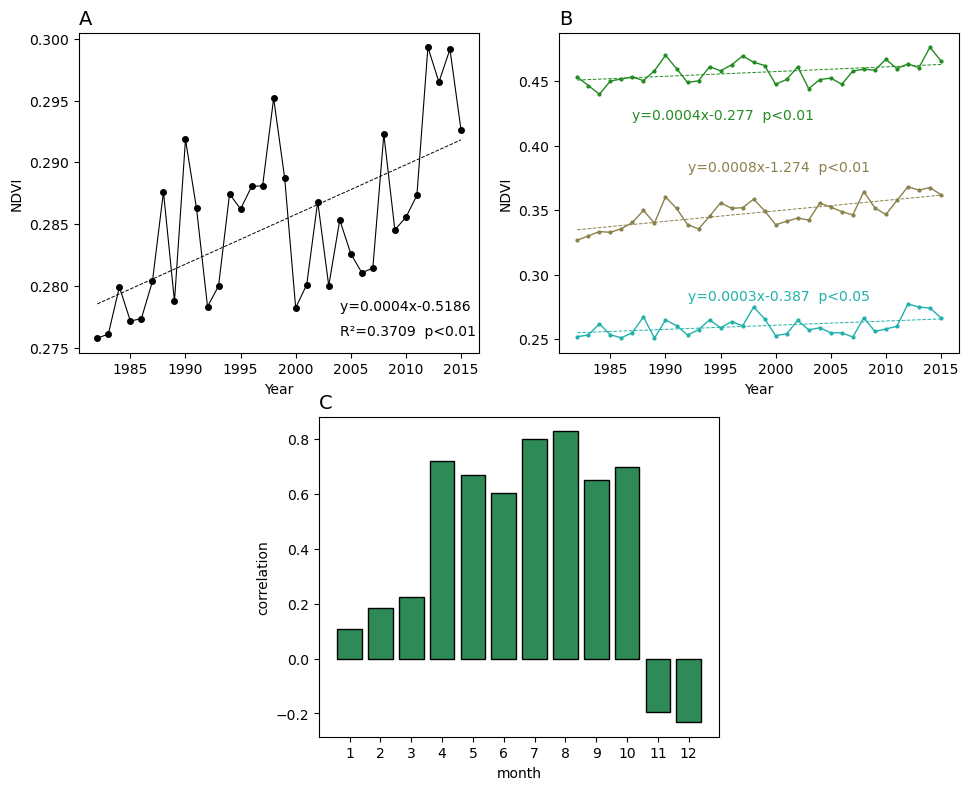

In [9]:
#求线性趋势
s1,d1,r1,p1,_ = linregress(year,ndvi_mean)
s2,d2,r2,p2,_ = linregress(year,ndvi_mean_1112)
s3,d3,r3,p3,_ = linregress(year,ndvi_mean_2124)
s4,d4,r4,p4,_ = linregress(year,ndvi_mean_3133)

#设置图纸大小
fig1=plt.figure(figsize=(8,8))
#第一个图的位置
ax1 = fig1.add_axes([0.0,0.0,0.5,0.4])
#折线图
ax1.plot(year,ndvi_mean,lw=0.8,marker='o',color='k',ms='4')
#设置标题
ax1.set_title('A',fontsize=14,loc='left')
#加入线性趋势
ax1.plot(year,s1*year+d1,'k--',lw=0.7)
#加入xy轴标签
ax1.set_xlabel('Year')
ax1.set_ylabel('NDVI')
#加入标注
ax1.text(2004,0.278,'y=0.0004x-0.5186 ')
ax1.text(2004,0.276,'R²=0.3709  p<0.01')

#第二个图位置
ax2 = fig1.add_axes([0.6,0.0,0.5,0.4])
#折线图
ax2.plot(year,ndvi_mean_1112,lw=1,marker = '.',color='#8B814C',ms='4',label = 'Farmland')
ax2.plot(year,ndvi_mean_2124,lw=1,marker = '.',color='#228B22',ms='4',label = 'Forest')
ax2.plot(year,ndvi_mean_3133,lw=1,marker = '.',color='#20B2AA',ms='4',label = 'Grassland')
ax2.plot(year,s2*year+d2,'k--',lw=0.7,color='#8B814C')
ax2.plot(year,s3*year+d3,'k--',lw=0.7,color='#228B22')
ax2.plot(year,s4*year+d4,'k--',lw=0.7,color='#20B2AA')
#设置标题
ax2.set_title('B',fontsize=14,loc='left')
#加入xy轴标签
ax2.set_xlabel('Year')
ax2.set_ylabel('NDVI')
#加入标注
ax2.text(1992,0.38,'y=0.0008x-1.274  p<0.01',color='#8B814C')
ax2.text(1987,0.42,'y=0.0004x-0.277  p<0.01',color='#228B22')
ax2.text(1992,0.28,'y=0.0003x-0.387  p<0.05',color='#20B2AA')
#第三个图位置
ax3 = fig1.add_axes([0.3,-0.48,0.5,0.4])
#设置标题C
ax3.set_title('C ',fontsize=14,loc='left')
ax3.set_xlabel('month')
ax3.set_ylabel('correlation')
ax3.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
ax3.bar(month,ndvi_month_r,color = '#2E8B57',edgecolor = 'black')

/tmp/ipykernel_436/3119465690.py:55: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax4.plot(year,s2*year+d2,'k--',lw=0.7,color='#8B814C')
/tmp/ipykernel_436/3119465690.py:56: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax4.plot(year,s3*year+d3,'k--',lw=0.7,color='#228B22')
/tmp/ipykernel_436/3119465690.py:57: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax4.plot(year,s4*year+d4,'k--',lw=0.7,color='#20B2AA')


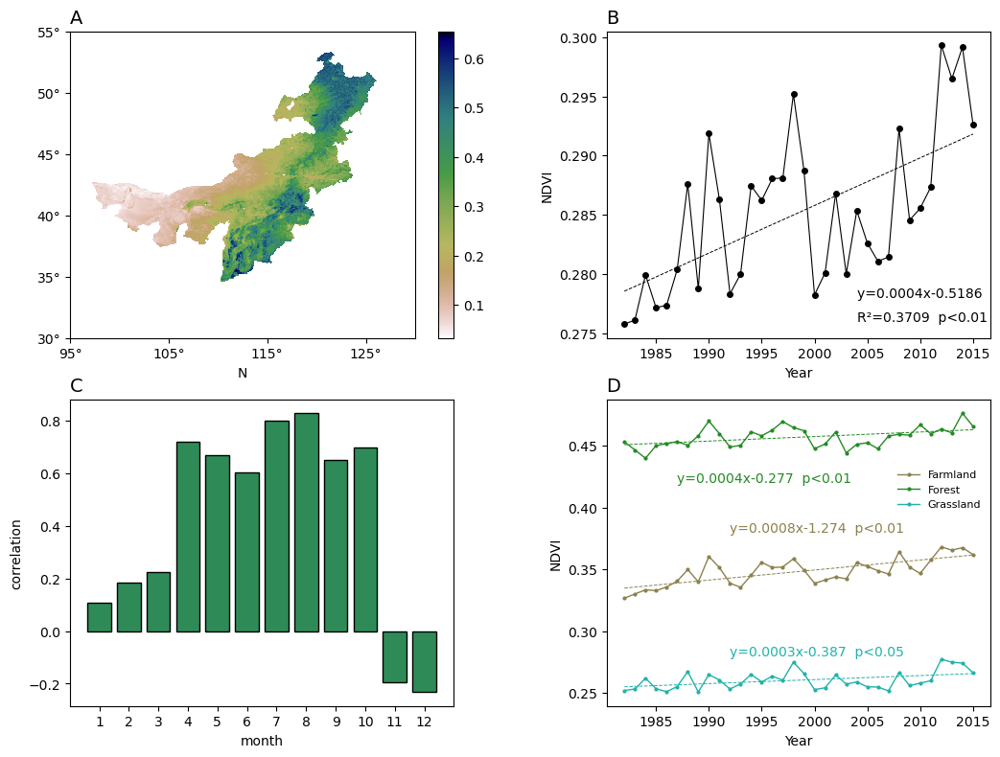

In [4]:
#求线性趋势
s1,d1,r1,p1,_ = linregress(year,ndvi_mean)
s2,d2,r2,p2,_ = linregress(year,ndvi_mean_1112)
s3,d3,r3,p3,_ = linregress(year,ndvi_mean_2124)
s4,d4,r4,p4,_ = linregress(year,ndvi_mean_3133)
#设置图纸大小
fig1=plt.figure(figsize=(8,8))
#第一个图的位置
ax1 = fig1.add_axes([0.7,0.0,0.5,0.4])
#折线图
ax1.plot(year,ndvi_mean,lw=0.8,marker='o',color='k',ms='4')
#设置标题B
ax1.set_title('B ',fontsize=14,loc='left')
#加入线性趋势
ax1.plot(year,s1*year+d1,'k--',lw=0.7)
#加入xy轴标签
ax1.set_xlabel('Year')
ax1.set_ylabel('NDVI')
#加入标注
ax1.text(2004,0.278,'y=0.0004x-0.5186 ')
ax1.text(2004,0.276,'R²=0.3709  p<0.01')
#第二个图位置
ax2 = fig1.add_axes([0.0,0.0,0.45,0.4])
#伪彩色图
cf = ax2.pcolormesh(ndvi_area_mean/10000,cmap = 'gist_earth_r')
#设置xy轴经纬度标签
ax2.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax2.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
ax2.set_xlabel('E')
ax2.set_xlabel('N')
#设置标题A
ax2.set_title('A ',fontsize=14,loc='left')
#设置colorbar的位置
cax = fig1.add_axes([ax2.get_position().x1+0.03,ax2.get_position().y0,0.02,ax2.get_position().height])
#添加colorbar
fig1.colorbar(cf,cax=cax)
#第三个图位置
ax3 = fig1.add_axes([0.0,-0.48,0.5,0.4])
#设置标题C
ax3.set_title('C ',fontsize=14,loc='left')
ax3.set_xlabel('month')
ax3.set_ylabel('correlation')
ax3.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
ax3.bar(month,ndvi_month_r,color = '#2E8B57',edgecolor = 'black')
#第四个图位置
ax4 = fig1.add_axes([0.7,-0.48,0.5,0.4])
ax4.set_title('D ',fontsize=14,loc='left')
#加入xy轴标签
ax4.set_xlabel('Year')
ax4.set_ylabel('NDVI')
#折线图
ax4.plot(year,ndvi_mean_1112,lw=1,marker = '.',color='#8B814C',ms='4',label = 'Farmland')
ax4.plot(year,ndvi_mean_2124,lw=1,marker = '.',color='#228B22',ms='4',label = 'Forest')
ax4.plot(year,ndvi_mean_3133,lw=1,marker = '.',color='#20B2AA',ms='4',label = 'Grassland')
ax4.plot(year,s2*year+d2,'k--',lw=0.7,color='#8B814C')
ax4.plot(year,s3*year+d3,'k--',lw=0.7,color='#228B22')
ax4.plot(year,s4*year+d4,'k--',lw=0.7,color='#20B2AA')

#加入标注
ax4.text(1992,0.38,'y=0.0008x-1.274  p<0.01',color='#8B814C')
ax4.text(1987,0.42,'y=0.0004x-0.277  p<0.01',color='#228B22')
ax4.text(1992,0.28,'y=0.0003x-0.387  p<0.05',color='#20B2AA')

ax4.legend(prop = {'size':8},frameon=False,bbox_to_anchor=(1,0.8))

/tmp/ipykernel_204/4007867679.py:73: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax4.plot(year,s2*year+d2,'k--',lw=0.7,color='#8B814C')
/tmp/ipykernel_204/4007867679.py:74: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax4.plot(year,s3*year+d3,'k--',lw=0.7,color='#228B22')
/tmp/ipykernel_204/4007867679.py:75: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax4.plot(year,s4*year+d4,'k--',lw=0.7,color='#D8BFD8')


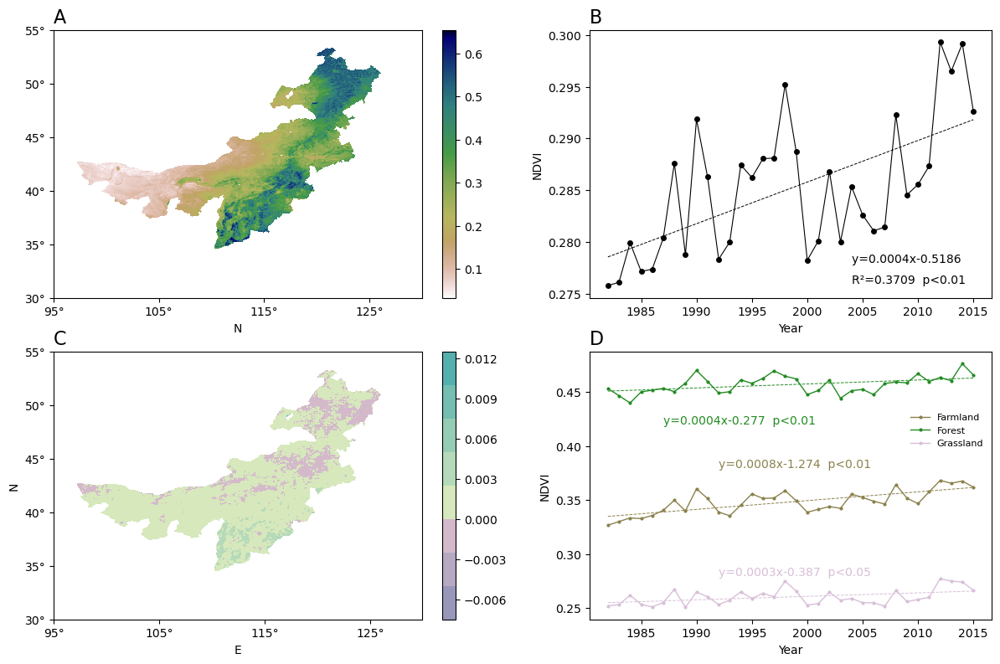

In [12]:
#求线性趋势
s1,d1,r1,p1,_ = linregress(year,ndvi_mean)
s2,d2,r2,p2,_ = linregress(year,ndvi_mean_1112)
s3,d3,r3,p3,_ = linregress(year,ndvi_mean_2124)
s4,d4,r4,p4,_ = linregress(year,ndvi_mean_3133)
#设置图纸大小
fig1=plt.figure(figsize=(8,8))
#第一个图的位置
ax1 = fig1.add_axes([0.8,0.0,0.6,0.4])
#折线图
ax1.plot(year,ndvi_mean,lw=0.8,marker='o',color='k',ms='4')
#设置标题B
ax1.set_title('B ',fontsize=16,loc='left')
#加入线性趋势
ax1.plot(year,s1*year+d1,'k--',lw=0.7)
#加入xy轴标签
ax1.set_xlabel('Year')
ax1.set_ylabel('NDVI')
#加入标注
ax1.text(2004,0.278,'y=0.0004x-0.5186 ')
ax1.text(2004,0.276,'R²=0.3709  p<0.01')
#第二个图位置
ax2 = fig1.add_axes([0.0,0.0,0.55,0.4])
#伪彩色图
cf = ax2.pcolormesh(ndvi_area_mean/10000,cmap = 'gist_earth_r')
#设置xy轴经纬度标签
ax2.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax2.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
ax2.set_xlabel('E')
ax2.set_xlabel('N')
#设置标题A
ax2.set_title('A ',fontsize=16,loc='left')
#设置colorbar的位置
cax = fig1.add_axes([ax2.get_position().x1+0.03,ax2.get_position().y0,0.02,ax2.get_position().height])
#添加colorbar
fig1.colorbar(cf,cax=cax)

#第三个图位置
ax3 = fig1.add_axes([0.0,-0.48,0.55,0.4])
#设置标题C
ax3.set_title('C ',fontsize=16,loc='left')
#设置colorbar中零刻度为色条中心处（白色）
norm = TwoSlopeNorm(vcenter=0)

Colors=('#9798b9','#b6a9c2','#d4b9cb','#d6e8bc','#b5dab9','#95ccb6','#74beb2','#53b0af')
#填色图
slope = ax3.contourf(slope_NDVI/10000,norm = norm,colors=Colors)
#设置xy轴经纬度标签
ax3.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax3.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
ax3.set_xlabel('E')
ax3.set_ylabel('N')

#设置colorbar位置
cax = fig1.add_axes([ax3.get_position().x1+0.03,ax3.get_position().y0,0.02,ax3.get_position().height])
#添加colorbar
cb1 = fig1.colorbar(slope,cax = cax)
#设置colorbar显示刻度个数
tick_locator = ticker.MaxNLocator(nbins=7) 
cb1.locator = tick_locator
cb1.update_ticks()

#第四个图位置
ax4 = fig1.add_axes([0.8,-0.48,0.6,0.4])
ax4.set_title('D ',fontsize=16,loc='left')
#加入xy轴标签
ax4.set_xlabel('Year')
ax4.set_ylabel('NDVI')
#折线图
ax4.plot(year,ndvi_mean_1112,lw=1,marker = '.',color='#8B814C',ms='4',label = 'Farmland')
ax4.plot(year,ndvi_mean_2124,lw=1,marker = '.',color='#228B22',ms='4',label = 'Forest')
ax4.plot(year,ndvi_mean_3133,lw=1,marker = '.',color='#D8BFD8',ms='4',label = 'Grassland')
ax4.plot(year,s2*year+d2,'k--',lw=0.7,color='#8B814C')
ax4.plot(year,s3*year+d3,'k--',lw=0.7,color='#228B22')
ax4.plot(year,s4*year+d4,'k--',lw=0.7,color='#D8BFD8')

#加入标注
ax4.text(1992,0.38,'y=0.0008x-1.274  p<0.01',color='#8B814C')
ax4.text(1987,0.42,'y=0.0004x-0.277  p<0.01',color='#228B22')
ax4.text(1992,0.28,'y=0.0003x-0.387  p<0.05',color='#D8BFD8')

ax4.legend(prop = {'size':8},frameon=False,bbox_to_anchor=(1,0.8))


fig1.savefig('/mnt/f/others/图片/output/ndvi4.eps',format='pdf',dpi=600,bbox_inches = 'tight')
fig1.savefig('/mnt/f/others/图片/output/ndvi4.tiff',format='tiff',dpi=600,bbox_inches = 'tight')
fig1.savefig('/mnt/f/others/图片/output/ndvi4.jpg',format='jpg',dpi=600,bbox_inches = 'tight')

## 1982&2015年NDVI

In [2]:
#导入数据
ndvi_year = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_year.npz')
ndvi_year = ndvi_year['NDVI_year_mean']
ndvi_1982 = ndvi_year[0,:,:]/10000
ndvi_2015 = ndvi_year[33,:,:]/10000

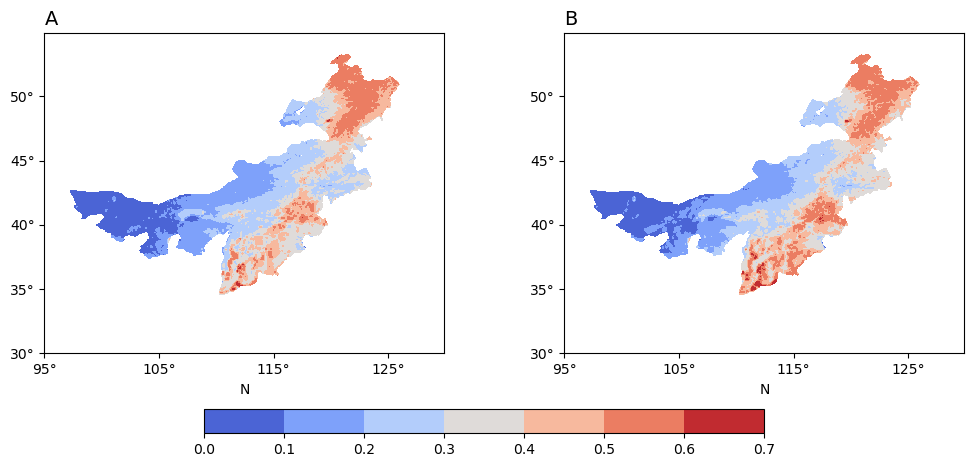

In [41]:
#设置图纸大小
fig1=plt.figure(figsize=(8,8))

ax1 = fig1.add_axes([0.0,0.0,0.5,0.4])
ax2 = fig1.add_axes([0.65,0.0,0.5,0.4])

vmin = min(np.nanmin(ndvi_1982), np.nanmin(ndvi_2015))
vmax = max(np.nanmax(ndvi_1982), np.nanmax(ndvi_2015))
norm = colors.Normalize(vmin=vmin, vmax=vmax)

#设置xy轴经纬度标签
ax1.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax1.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
ax1.set_xlabel('E')
ax1.set_xlabel('N')
ax2.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax2.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
ax2.set_xlabel('E')
ax2.set_xlabel('N')
#设置标题
ax1.set_title('A',fontsize=14,loc='left')
ax2.set_title('B',fontsize=14,loc='left')

#伪彩色图
a = ax1.contourf(ndvi_1982,norm=norm,cmap = 'coolwarm')
b = ax2.contourf(ndvi_2015,norm=norm,cmap = 'coolwarm')

position=fig1.add_axes([0.2, -0.1, 0.7, 0.03])
fig1.colorbar(a, ax=[ax1, ax2],cax = position, orientation='horizontal')


In [3]:
#复制一份原数据防止搞坏
s_year_NDVI = ndvi_year_mean.copy()
#把数据中为np.nan的值都替换成0
s_year_NDVI[np.isnan(s_year_NDVI)]=0

#创建slope和pvalue的空数组
slope_NDVI =np.full((300,420),fill_value=np.nan)
NDVI_p =np.full((300,420),fill_value=np.nan)

#自变量年份
year = np.arange(1982,2016,1)

#对每个格点进行循环
for i in range(300):
    for j in range(420):
        slope_NDVI[i,j], _,_,NDVI_p[i,j],_ =linregress(year,s_year_NDVI[:,i,j])

#把slope中为0的格点设置为np.nan,因为此处趋势无意义
slope_NDVI[slope_NDVI==0]=np.nan
#把pvalue中为0和1的格点设置为np.nan,因为此处显著性无意义
NDVI_p[NDVI_p==0]=np.nan
NDVI_p[NDVI_p==1]=np.nan

In [75]:
#这个目前没啥用，打算在相关性分析的时候使用，就是把相关性分析中不显著的地方抠出来
xianzhu=np.where(NDVI_p<0.05,0.05,np.nan)
#slope_xianzhu = slope_NDVI[xianzhu == 0.05]
#xianzhu_bool=[xianzhu==0.05]通过比较运算得到布尔索引(其类型为list)
#slope_xianzhu=slope_NDVI[tuple(xianzhu_bool)]#将list转化为tuple进行布尔索引
#xianzhu_bool = xianzhu_bool[0]
slope_xianzhu = np.full((300,420),fill_value=np.nan)

for j in range(300):
    for i in range(420):
        if xianzhu[j,i] == 0.05:
            slope_xianzhu[j,i] = slope_NDVI[j,i]
        else:
            slope_xianzhu[j,i] = np.nan
    
   

In [25]:
#可能是个笨方法，但我还是用了
#此处我想把pvalue分成三个档，分别是：不显著、比较显著（p<0.05）、非常显著（p<0.01）
#于是把原数组拆成了三个，分别对应三个档次
p_001 = np.full((300,420),fill_value=np.nan)
p_005 = np.full((300,420),fill_value=np.nan)
p_no = np.full((300,420),fill_value=np.nan)

#利用循环拆分三个数组

for j in range(300):
    for i in range(420):
        if NDVI_p[j,i] >0 and NDVI_p[j,i] <0.01: 
            p_001[j,i] = NDVI_p[j,i]
            p_005[j,i] = np.nan
            p_no[j,i] = np.nan
        elif NDVI_p[j,i] >=0.01 and NDVI_p[j,i] <0.05:
            p_005[j,i] = NDVI_p[j,i]
            p_001[j,i] = np.nan
            p_no[j,i] = np.nan
        elif NDVI_p[j,i] >=0.05 and NDVI_p[j,i] <1:
            p_no[j,i] = NDVI_p[j,i]
            p_001[j,i] = np.nan
            p_005[j,i] = np.nan

In [19]:
p_005 = np.full((300,420),fill_value=np.nan)
#利用循环拆分三个数组

for j in range(300):
    for i in range(420):
        if NDVI_p[j,i] >0 and NDVI_p[j,i] <0.05: 
            p_005[j,i] = NDVI_p[j,i]
        elif NDVI_p[j,i] >=0.05 and NDVI_p[j,i] <1:
            p_005[j,i] = np.nan

## 图2 多年变化趋势空间图 和 显著性

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'projection'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


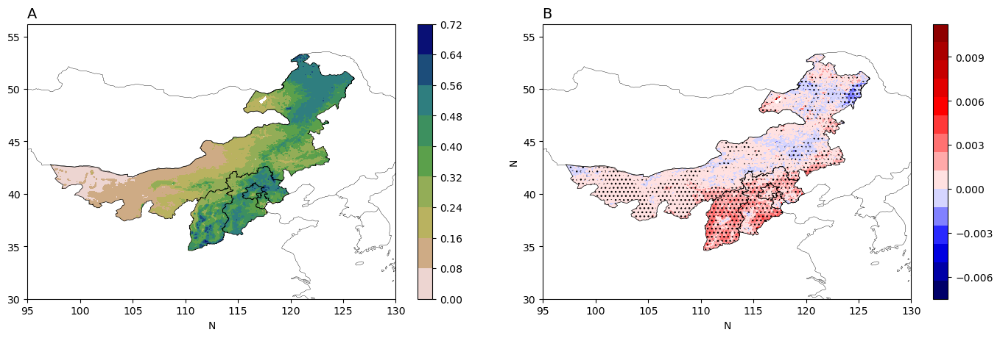

In [25]:
lon_ndvi = np.arange(95.041667,130.040267,0.08333)
lat_ndvi = np.arange(30.041667,55.040267,0.08333)
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

#设置图纸大小
fig=plt.figure(figsize=(10,10))
#第二个图位置
ax1 = fig.add_axes([0.0,0.0,0.5,0.5],projection = ccrs.PlateCarree())
#设置xy轴经纬度标签
ax1.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax1.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
#伪彩色图
cf = ax1.contourf(lon_ndvi,lat_ndvi,ndvi_area_mean/10000,cmap = 'gist_earth_r',projection =ccrs.PlateCarree(central_longitude=112.5))
ax1.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
ax1.add_feature(cfeature.COASTLINE,lw = 0.3)
ax1.add_feature(cfeature.BORDERS,lw = 0.3)
ax1.set_extent([95, 130, 30, 55])
ax1.set_xlabel('E')
ax1.set_xlabel('N')
#设置标题A
ax1.set_title('A ',fontsize=14,loc='left')
#设置colorbar的位置
cax = fig.add_axes([ax1.get_position().x1+0.03,ax1.get_position().y0,0.02,ax1.get_position().height])
#添加colorbar
fig.colorbar(cf,cax=cax)

ax2 = fig.add_axes([0.7,0.0,0.5,0.5],projection = ccrs.PlateCarree())
#设置xy轴经纬度标签
ax2.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax2.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
ax2.set_xlabel('E')
ax2.set_ylabel('N')
ax2.set_title('B ',fontsize=14,loc='left')
#设置colorbar中零刻度为色条中心处（白色）
norm = TwoSlopeNorm(vcenter=0)
#填色图
slope = ax2.contourf(lon_ndvi,lat_ndvi,slope_NDVI/10000,norm = norm,cmap = 'seismic',levels = np.arange(-0.0075,0.0125,0.00125),projection =ccrs.PlateCarree(central_longitude=112.5))
slope_p = ax2.contourf(lon_ndvi,lat_ndvi,NDVI_p,levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
ax2.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
ax2.add_feature(cfeature.COASTLINE,lw = 0.3)
ax2.add_feature(cfeature.BORDERS,lw = 0.3)
ax2.set_extent([95, 130, 30, 55])
ax2.set_xlabel('E')
ax2.set_xlabel('N')
#设置colorbar位置
cax = fig.add_axes([ax2.get_position().x1+0.03,ax2.get_position().y0,0.02,ax2.get_position().height])
#添加colorbar
cb1 = fig.colorbar(slope,cax = cax)
#设置colorbar显示刻度个数
tick_locator = ticker.MaxNLocator(nbins=7) 
cb1.locator = tick_locator
cb1.update_ticks()

([<matplotlib.patches.Wedge at 0x7fcec817c8b0>,
 [Text(0.08911435742124905, 1.0963843446991561, 'significant increase'),
  Text(-0.9395825387535267, -0.5720005706898184, 'non-significant decrease'),
  Text(0.05820462696900824, -1.0984590212654266, 'significant decrease'),
  Text(0.923102306305801, -0.5982325067170048, 'non-significant decrease')],
 [Text(0.0486078313206813, 0.5980278243813578, '47.4%'),
  Text(-0.5124995665928327, -0.31200031128535544, '22.6%'),
  Text(0.031747978346731764, -0.599159466144778, '11.7%'),
  Text(0.5035103488940732, -0.32630864002745713, '18.3%')])

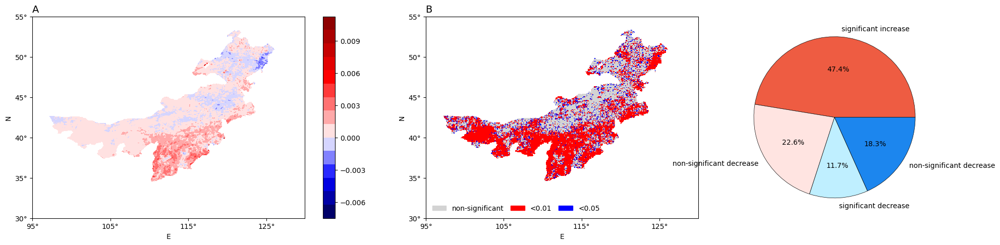

In [34]:
#设置图纸大小
fig2=plt.figure(figsize=(12,10))
#设置子图位置
ax1 = fig2.add_axes([0.0,0.0,0.45,0.4])
ax2 = fig2.add_axes([0.65,0.0,0.45,0.4])
ax3 = fig2.add_axes([1.10,0.0,0.45,0.4])
#设置colorbar中零刻度为色条中心处（白色）
norm = TwoSlopeNorm(vcenter=0)
#填色图
slope = ax1.contourf(slope_NDVI/10000,norm = norm,cmap = 'seismic',levels = np.arange(-0.0075,0.0125,0.00125))
#设置xy轴经纬度标签
ax1.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax1.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
ax1.set_xlabel('E')
ax1.set_ylabel('N')
ax2.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax2.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
ax2.set_xlabel('E')
ax2.set_ylabel('N')
#设置标题
ax1.set_title('A ',fontsize=14,loc='left')
ax2.set_title('B ',fontsize=14,loc='left')
#设置colorbar位置
cax = fig2.add_axes([ax1.get_position().x1+0.03,ax1.get_position().y0,0.02,ax1.get_position().height])
#添加colorbar
cb1 = fig2.colorbar(slope,cax = cax)
#设置colorbar显示刻度个数
tick_locator = ticker.MaxNLocator(nbins=7) 
cb1.locator = tick_locator
cb1.update_ticks()

#拆分的三个显著性图分别对应3个颜色
mapcolor1 = mpl.colors.ListedColormap(['lightgrey'])
mapcolor2 = mpl.colors.ListedColormap(['red'])
mapcolor3 = mpl.colors.ListedColormap(['blue'])
ax2.pcolormesh(p_no,cmap=mapcolor1)
ax2.pcolormesh(p_001,cmap=mapcolor2)
ax2.pcolormesh(p_005,cmap=mapcolor3)
#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='lightgrey', label='non-significant'),mpatches.Patch(color='red', label='<0.01'),mpatches.Patch(color='blue', label='<0.05')]
#添加图例
ax2.legend(handles=patchs,loc=3,ncol=3,frameon=False,columnspacing = 1)


#显著增加，不显著增加，显著减少，不显著减少
#进行循环，分为四种情况，画饼图

proportion = np.full((4),fill_value=0)
for i in range(300):
    for j in range(420):
        if slope_NDVI[i,j] > 0 and NDVI_p[i,j] < 0.05:
            proportion[0] = proportion[0] + 1
        elif slope_NDVI[i,j] > 0 and NDVI_p[i,j] > 0.05:
            proportion[1] = proportion[1] + 1
        elif slope_NDVI[i,j] < 0 and NDVI_p[i,j] < 0.05:
            proportion[2] = proportion[2] + 1
        elif slope_NDVI[i,j] < 0 and NDVI_p[i,j] > 0.05:
                proportion[3] = proportion[3] + 1
colors = ['#EE5C42','#FFE4E1','#BFEFFF','#1C86EE']
elements= ["significant increase", "non-significant decrease", "significant decrease", "non-significant decrease",]
ax3.pie(proportion,autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'},labels=elements)
#ax3.legend(loc=3,ncol=2)

In [20]:
#读取文件
indices_year =  np.load('/mnt/f/cn05/cn05_huabei/output/indices_year.npz')
mean_year = np.load('/mnt/f/cn05/cn05_huabei/output/mean_year.npz')

indices_year_tm = np.array([mean_year['tm'],indices_year['TXX'],indices_year['TXN'], indices_year['TNN'], indices_year['TNX'], indices_year['TX90'], indices_year['TX10'], indices_year['TN90'], indices_year['TN10'], indices_year['DTR']])
indices_year_pre = np.array([mean_year['pre'],indices_year['Rx1day'], indices_year['R1mm'], indices_year['R10mm'], indices_year['r20mm']])

indices_tm_slope = np.full((10,101,141),fill_value=np.nan)
indices_tm_p = np.full((10,101,141),fill_value=np.nan)
indices_pre_slope = np.full((5,101,141),fill_value=np.nan)
indices_pre_p = np.full((5,101,141),fill_value=np.nan)
year = np.arange(1982,2016,1)


for k in range(10):
    for i in range(101):
        for j in range(141):
            indices = indices_year_tm[k,:,:,:]
            indices_tm_slope[k,i,j], _,_,indices_tm_p[k,i,j],_ =linregress(year,indices[:,i,j])


for k in range(5):
    for i in range(101):
        for j in range(141):
            indices = indices_year_pre[k,:,:,:]
            indices_pre_slope[k,i,j], _,_,indices_pre_p[k,i,j],_ =linregress(year,indices[:,i,j])
        

indices_slope = np.concatenate((indices_tm_slope,indices_pre_slope),axis=0)
indices_slope_p = np.concatenate((indices_tm_p,indices_pre_p),axis=0)

In [23]:
#输出多维数组
np.savez('/mnt/f/cn05/cn05_huabei/output/indices_slope.npz',indices_slope = indices_slope,indices_slope_p=indices_slope_p)

## 图3 极端气候指数变化趋势空间图

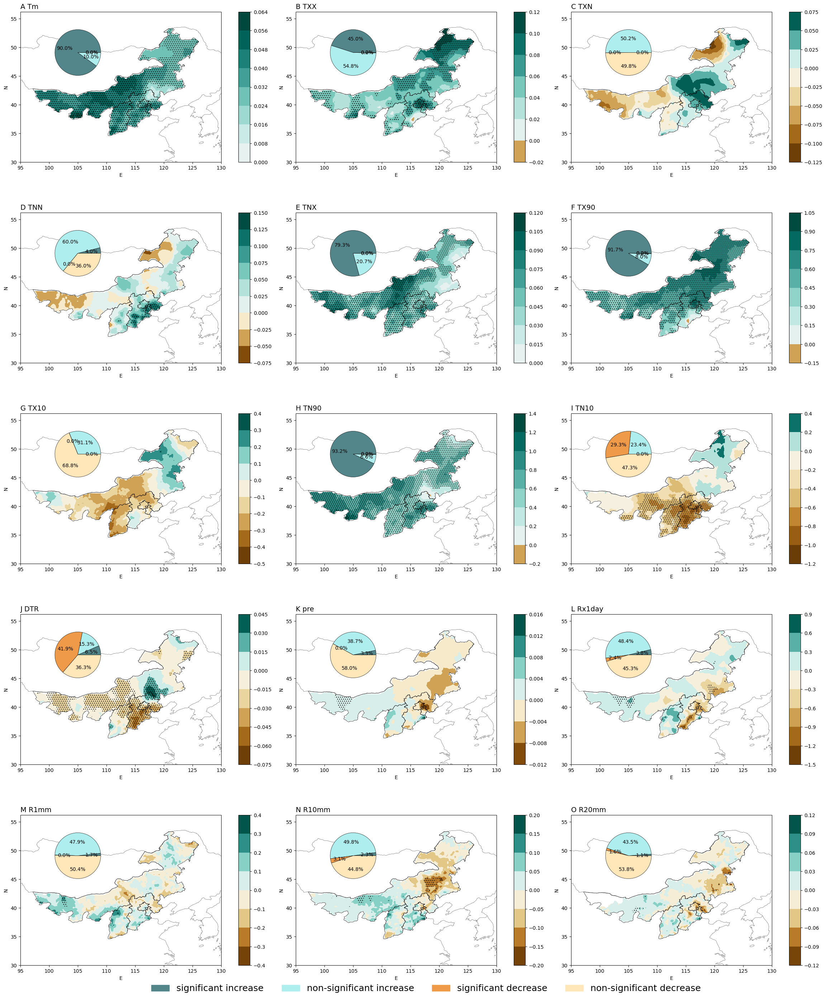

In [20]:
title = np.array(['A Tm','B TXX','C TXN','D TNN','E TNX','F TX90','G TX10','H TN90','I TN10','J DTR','K pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((5,3))
#读取文件
slope =  np.load('/mnt/f/cn05/cn05_huabei/output/indices_slope.npz')
indices_slope = np.array(slope['indices_slope'])
indices_slope_p = np.array(slope['indices_slope_p'])
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

#显著增加，不显著增加，显著减少，不显著减少
#进行循环，分为四种情况，画饼图
lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)
proportion = np.full((15,4),fill_value=0)
for k in range(15):
    for i in range(101):
        for j in range(141):
            if indices_slope[k,i,j] > 0 and indices_slope_p[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif indices_slope[k,i,j] > 0 and indices_slope_p[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif indices_slope[k,i,j] < 0 and indices_slope_p[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif indices_slope[k,i,j] < 0 and indices_slope_p[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

indices_slope = indices_slope.reshape(5,3,101,141)
indices_slope_p = indices_slope_p.reshape(5,3,101,141)
proportion = proportion.reshape(5,3,4)


fig=plt.figure(figsize=(16,16))
for i in range(5):
    for j in range(3):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=14)
        norm = TwoSlopeNorm(vcenter=0)
        slope = indices_slope[i,j,:]
        slope[slope==0]=np.nan
        s = ax.contourf(lon,lat,indices_slope[i,j,:],norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
        slope_p = ax.contourf(lon,lat,indices_slope_p[i,j,:],levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        fig.colorbar(s,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.48, 1.66-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        colors = ['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#53868B', label='significant increase'),mpatches.Patch(color='#AFEEEE', label='non-significant increase'),mpatches.Patch(color='#EE9A49', label='significant decrease'),mpatches.Patch(color='#FFE7BA', label='non-significant decrease')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(1.3,0.1),ncol = 4)

## 图4 相关性分析图（去趋势前）

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'projection'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


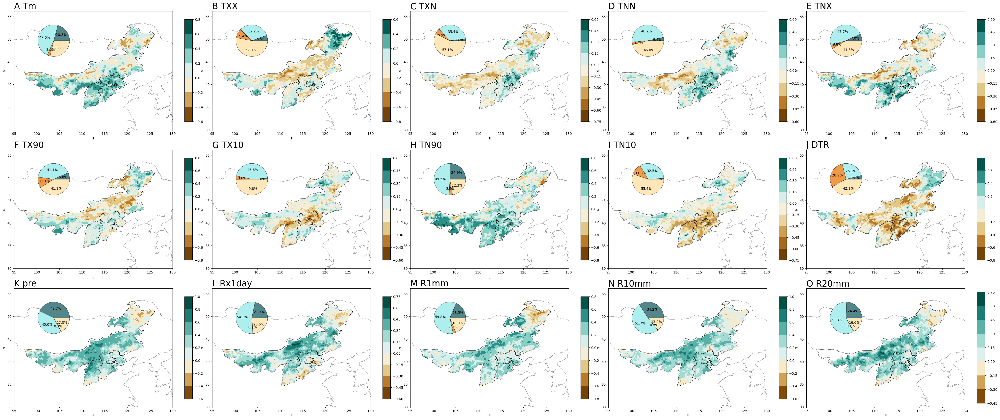

In [19]:
title = np.array(['A Tm','B TXX','C TXN','D TNN','E TNX','F TX90','G TX10','H TN90','I TN10','J DTR','K pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((3,5))
#读取文件
correlation =  np.load('/mnt/f/cn05/cn05_huabei/output/correlation.npz')
indices_r = np.array(correlation['inidices_year_r'])
indices_p = np.array(correlation['indices_year_p'])
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

#显著正相关，不显著正相关，显著负相关，不显著负相关
#进行循环，分为四种情况，画饼图
proportion = np.full((15,4),fill_value=0)
for k in range(15):
    for i in range(101):
        for j in range(141):
            if indices_r[k,i,j] > 0 and indices_p[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif indices_r[k,i,j] > 0 and indices_p[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif indices_r[k,i,j] < 0 and indices_p[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif indices_r[k,i,j] < 0 and indices_p[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

#把所有准备画图的数据进行变形，对应5行3列
indices_r = indices_r.reshape(3,5,101,141)
indices_p = indices_p.reshape(3,5,101,141)
proportion = proportion.reshape(3,5,4)

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

fig=plt.figure(figsize=(16,16))
for i in range(3):
    for j in range(5):
        ax = fig.add_axes([0.1+j*0.5, 1.5-i*0.35, 0.4, 0.35],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=25)
        norm = TwoSlopeNorm(vcenter=0)
        r = ax.contourf(lon,lat,indices_r[i,j,:],norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        ax.set_extent([95, 130, 30, 55])
        fig.colorbar(r,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.5, 1.7-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        #colors = ['183,034,048','#EEB4B4','#00BFFF','#1874CD']
        #colors = ['#EE5C42','#FFE4E1','#BFEFFF','#1C86EE']
        colors =['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

fig.savefig('/mnt/f/others/图片/output/correlation_15.eps',format='pdf',dpi=600,bbox_inches = 'tight')
fig.savefig('/mnt/f/others/图片/output/correlation_15.tiff',format='tiff',dpi=600,bbox_inches = 'tight')
fig.savefig('/mnt/f/others/图片/output/correlation_15.jpg',format='jpg',dpi=600,bbox_inches = 'tight')

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'projection'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


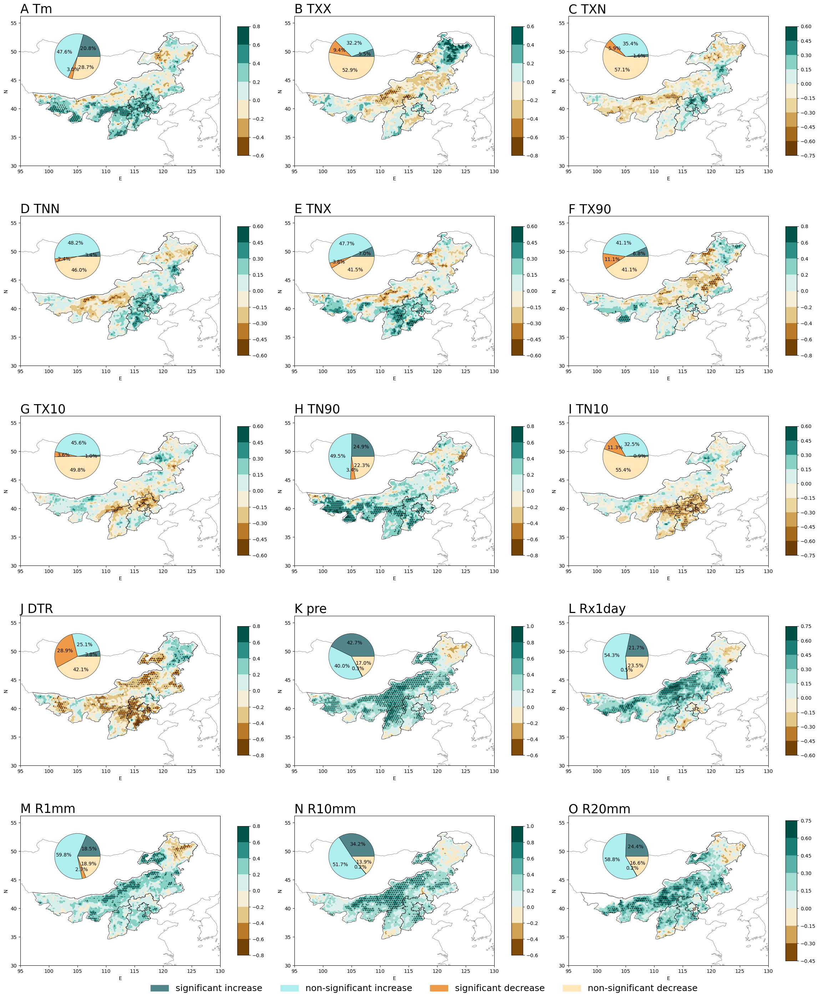

In [27]:
title = np.array(['A Tm','B TXX','C TXN','D TNN','E TNX','F TX90','G TX10','H TN90','I TN10','J DTR','K pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((5,3))
#读取文件
correlation =  np.load('/mnt/f/cn05/cn05_huabei/output/correlation.npz')
indices_r = np.array(correlation['inidices_year_r'])
indices_p = np.array(correlation['indices_year_p'])
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

#显著正相关，不显著正相关，显著负相关，不显著负相关
#进行循环，分为四种情况，画饼图
proportion = np.full((15,4),fill_value=0)
for k in range(15):
    for i in range(101):
        for j in range(141):
            if indices_r[k,i,j] > 0 and indices_p[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif indices_r[k,i,j] > 0 and indices_p[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif indices_r[k,i,j] < 0 and indices_p[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif indices_r[k,i,j] < 0 and indices_p[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

#把所有准备画图的数据进行变形，对应5行3列
indices_r = indices_r.reshape(5,3,101,141)
indices_p = indices_p.reshape(5,3,101,141)
proportion = proportion.reshape(5,3,4)

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

fig=plt.figure(figsize=(16,16))
for i in range(5):
    for j in range(3):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=25)
        norm = TwoSlopeNorm(vcenter=0)
        r = ax.contourf(lon,lat,indices_r[i,j,:],norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
        slope_p = ax.contourf(lon,lat,indices_p[i,j,:],levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        ax.set_extent([95, 130, 30, 55])
        fig.colorbar(r,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.48, 1.66-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        #colors = ['183,034,048','#EEB4B4','#00BFFF','#1874CD']
        #colors = ['#EE5C42','#FFE4E1','#BFEFFF','#1C86EE']
        colors =['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#53868B', label='significant increase'),mpatches.Patch(color='#AFEEEE', label='non-significant increase'),mpatches.Patch(color='#EE9A49', label='significant decrease'),mpatches.Patch(color='#FFE7BA', label='non-significant decrease')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(1.3,0.1),ncol = 4)

## 图5 相关性分析图（去趋势后）

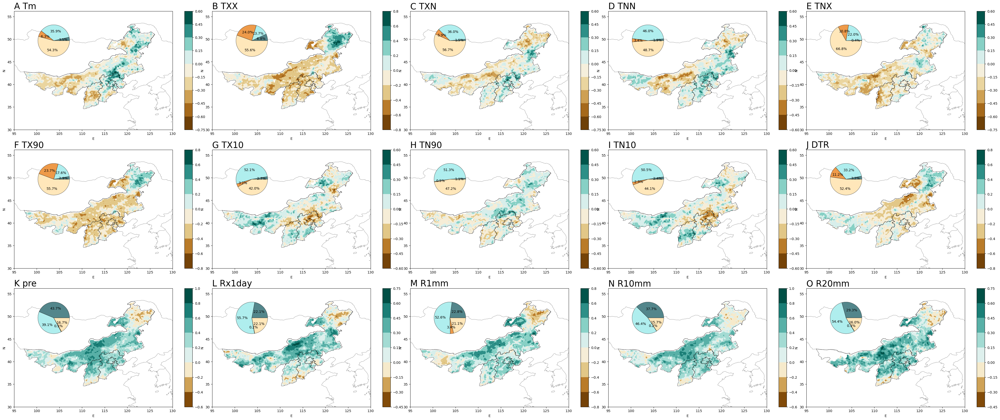

In [18]:
title = np.array(['A Tm','B TXX','C TXN','D TNN','E TNX','F TX90','G TX10','H TN90','I TN10','J DTR','K pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((3,5))
#读取文件
correlation =  np.load('/mnt/f/cn05/cn05_huabei/output/correlation.npz')
indices_r = np.array(correlation['indices_year_de_r'])
indices_p = np.array(correlation['indices_year_de_p'])
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

#显著正相关，不显著正相关，显著负相关，不显著负相关
#进行循环，分为四种情况，画饼图

proportion = np.full((15,4),fill_value=0)
for k in range(15):
    for i in range(101):
        for j in range(141):
            if indices_r[k,i,j] > 0 and indices_p[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif indices_r[k,i,j] > 0 and indices_p[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif indices_r[k,i,j] < 0 and indices_p[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif indices_r[k,i,j] < 0 and indices_p[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

indices_r = indices_r.reshape(3,5,101,141)
proportion = proportion.reshape(3,5,4)

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

fig=plt.figure(figsize=(16,16))
for i in range(3):
    for j in range(5):
        ax = fig.add_axes([0.1+j*0.5, 1.5-i*0.35, 0.4, 0.35],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=25)
        norm = TwoSlopeNorm(vcenter=0)
        r = ax.contourf(lon,lat,indices_r[i,j,:],norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        fig.colorbar(r,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.5, 1.7-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        #colors = ['#EE799F','#FFE4E1','#4D8048','#A8BF91']
        colors =['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})


fig.savefig('/mnt/f/others/图片/output/correlation_15_d.eps',format='pdf',dpi=600,bbox_inches = 'tight')
fig.savefig('/mnt/f/others/图片/output/correlation_15_d.tiff',format='tiff',dpi=600,bbox_inches = 'tight')
fig.savefig('/mnt/f/others/图片/output/correlation_15_d.jpg',format='jpg',dpi=600,bbox_inches = 'tight')

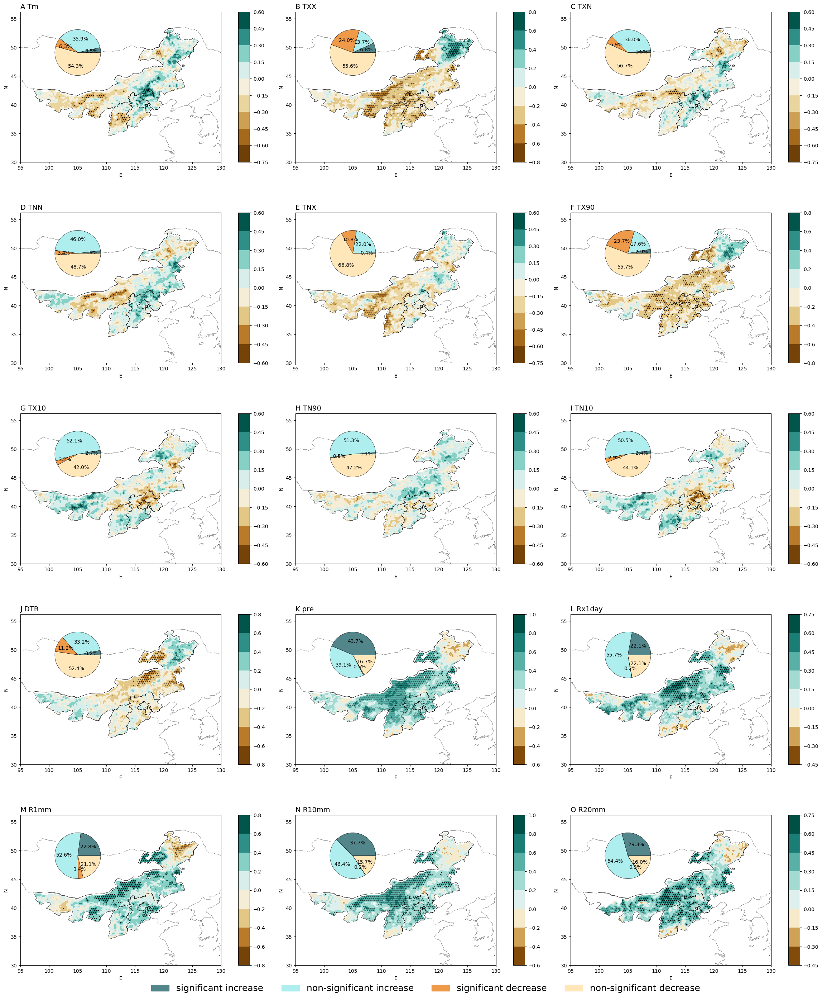

In [25]:
title = np.array(['A Tm','B TXX','C TXN','D TNN','E TNX','F TX90','G TX10','H TN90','I TN10','J DTR','K pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((5,3))
#读取文件
correlation =  np.load('/mnt/f/cn05/cn05_huabei/output/correlation.npz')
indices_r = np.array(correlation['indices_year_de_r'])
indices_p = np.array(correlation['indices_year_de_p'])
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

#显著正相关，不显著正相关，显著负相关，不显著负相关
#进行循环，分为四种情况，画饼图

proportion = np.full((15,4),fill_value=0)
for k in range(15):
    for i in range(101):
        for j in range(141):
            if indices_r[k,i,j] > 0 and indices_p[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif indices_r[k,i,j] > 0 and indices_p[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif indices_r[k,i,j] < 0 and indices_p[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif indices_r[k,i,j] < 0 and indices_p[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

indices_r = indices_r.reshape(5,3,101,141)
proportion = proportion.reshape(5,3,4)
indices_p = indices_p.reshape(5,3,101,141)

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

fig=plt.figure(figsize=(16,16))
for i in range(5):
    for j in range(3):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=14)
        norm = TwoSlopeNorm(vcenter=0)
        r = ax.contourf(lon,lat,indices_r[i,j,:],norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
        slope_p = ax.contourf(lon,lat,indices_p[i,j,:],levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        fig.colorbar(r,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.48, 1.66-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        #colors = ['#EE799F','#FFE4E1','#4D8048','#A8BF91']
        colors =['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#53868B', label='significant increase'),mpatches.Patch(color='#AFEEEE', label='non-significant increase'),mpatches.Patch(color='#EE9A49', label='significant decrease'),mpatches.Patch(color='#FFE7BA', label='non-significant decrease')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(1.3,0.1),ncol = 4)

## 图6 月尺度相关性热力图

In [ ]:
indices_month = np.array([month['TM'],month['TXX'],month['TXN'],month['TNX'],month['TNN'],month['DTR'],month['TX90'],month['TX10'],month['TN90'],month['TN10'],month['pre'],month['Rx1day'],month['R1mm'],month['R10mm'],month['R20mm']])

Text(0.0, 1.0, 'A')

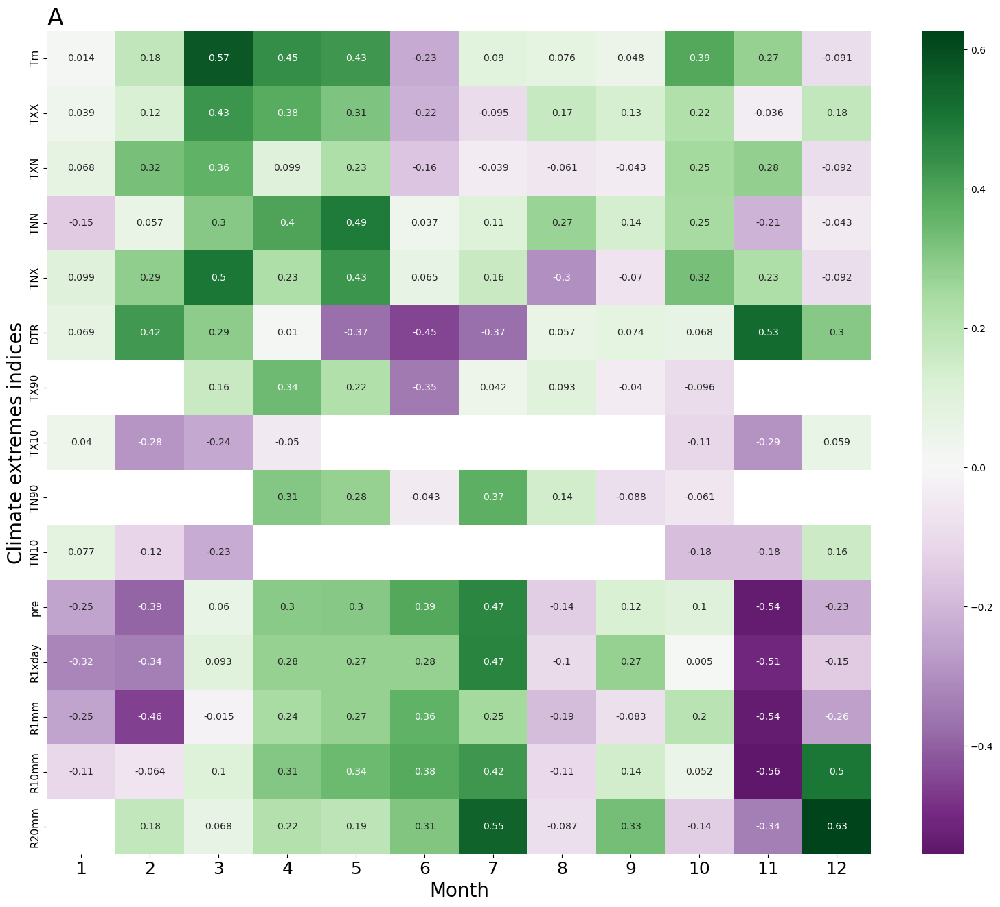

In [8]:
#去趋势前
correlation = np.load('/mnt/f/cn05/cn05_huabei/output/month_correlation.npz')
indices_month_r = correlation['indices_month_r']
indices_month_p = correlation['indices_month_p']


fig=plt.figure(figsize=(15,12))
ax = fig.add_axes([0.0,0.0,1,1])
r = sns.heatmap(indices_month_r,cmap= 'PRGn',annot=True,center=0)
plt.xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5],(1,2,3,4,5,6,7,8,9,10,11,12),fontsize=18)
plt.yticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5],('Tm','TXX', 'TXN', 'TNN', 'TNX', 'DTR','TX90', 'TX10', 'TN90', 'TN10',  'pre','R1xday', 'R1mm', 'R10mm', 'R20mm'),fontsize=11)
ax.set_xlabel('Month',fontsize=20)
ax.set_ylabel('Climate extremes indices',fontsize=20)
ax.set_title('A',fontsize=25,loc='left')

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Text(0.0, 1.0, 'B')

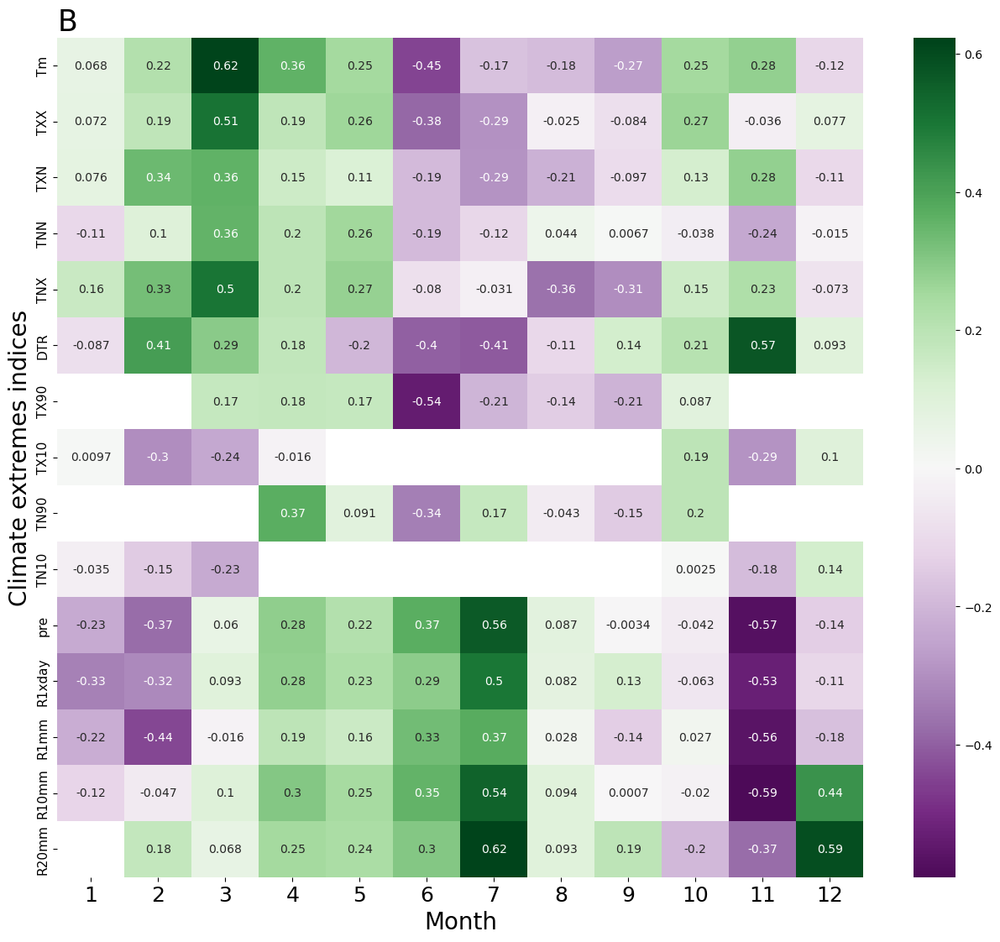

In [9]:
#去趋势后相关性指数

detrend = np.load('/mnt/f/cn05/cn05_huabei/output/month_detrend.npz')
indices_month_detrend = detrend['indices_month_detrend']
ndvi_month_detrend = detrend['ndvi_month_detrend']

#建造np.nan填充的数组
indices_month_r = np.full((15,12),fill_value=np.nan)
indices_month_p = np.full((15,12),fill_value=np.nan)

#进行相关性分析
for k in range(15):
    for i in range(12):
        indices_month_r[k,i],indices_month_p[k,i] = pearsonr(indices_month_detrend[k,:,i],ndvi_month_detrend[:,i])

fig=plt.figure(figsize=(12,10))
ax = fig.add_axes([0.0,0.0,1,1])
r = sns.heatmap(indices_month_r,cmap= 'PRGn',annot=True,center=0)
ax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5],(1,2,3,4,5,6,7,8,9,10,11,12),fontsize=18)
ax.set_yticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5],('Tm','TXX', 'TXN', 'TNN', 'TNX', 'DTR','TX90', 'TX10', 'TN90', 'TN10',  'pre','R1xday', 'R1mm', 'R10mm', 'R20mm'),fontsize=11)
ax.set_xlabel('Month',fontsize=20)
ax.set_ylabel('Climate extremes indices',fontsize=20)
ax.set_title('B',fontsize=25,loc='left')


#fig.savefig('/mnt/f/others/图片/output/month_r.eps',format='pdf',dpi=600,bbox_inches = 'tight')
#fig.savefig('/mnt/f/others/图片/output/month_r.tiff',format='tiff',dpi=600,bbox_inches = 'tight')
#fig.savefig('/mnt/f/others/图片/output/month_r.jpg',format='jpg',dpi=600,bbox_inches = 'tight')

In [ ]:
correlation = np.load('/mnt/f/cn05/cn05_huabei/output/month_correlation.npz')
indices_month_r = correlation['indices_month_r']
indices_month_p = correlation['indices_month_p']


fig=plt.figure(figsize=(15,12))
r = sns.heatmap(indices_month_r,cmap= 'PRGn',annot=True,center=0)
plt.xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5],(1,2,3,4,5,6,7,8,9,10,11,12))
plt.yticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5],('Tm','TXX', 'TXN', 'TNN', 'TNX', 'DTR','TX90', 'TX10', 'TN90', 'TN10',  'pre','R1xday', 'R1mm', 'R10mm', 'R20mm'))
plt.xlabel('month')
plt.ylabel('climate extremes indices')

## 去季节后月度相关性

## 补 tm&pre 趋势图 相关性

In [4]:
#输入数据
mean_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/mean_mean.csv')
tm_mean = np.array(mean_mean['tm'])
pre_mean = np.array(mean_mean['pre'])

ndvi_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_mean.csv')
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

mean_detread = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/mean_detread.csv')
ndvi_detrend = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_detrend.csv')

tm_detread = np.array(mean_detread['tm'])
pre_detread = np.array(mean_detread['pre'])
ndvi_detread = np.array(ndvi_detrend['NDVI'])

year = np.arange(1982,2016,1)
s1,d1,r1,p1,_ = linregress(year, tm_mean)
s2,d2,r2,p2,_ = linregress(year, pre_mean)
print(s1,d1,r1,p1)
print(s2,d2,r2,p2)

0.03641301148533364 -67.82869425992912 0.591065689586091 0.0002325419901187585
-0.0007383197113427591 2.4755786293330635 -0.0630295312161141 0.723243193270606


Text(0.0, 1.0, 'B ')

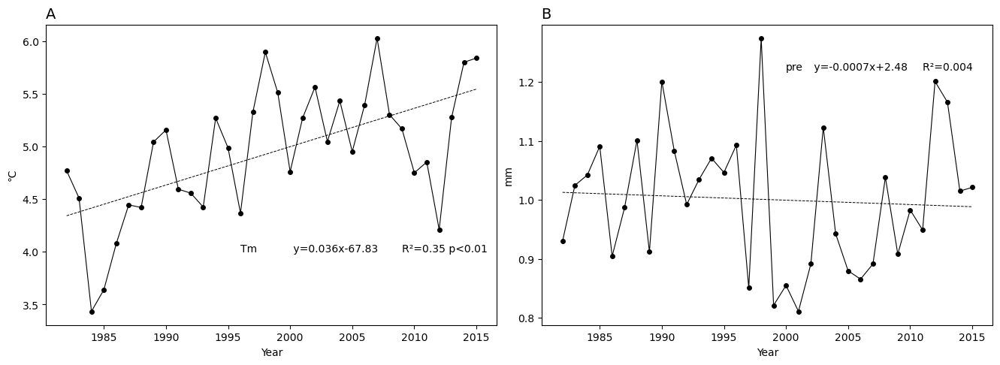

In [62]:
fig=plt.figure(figsize=(12,10))
ax = fig.add_axes([0.0,0.0,0.5,0.4])
ax.plot(year,tm_mean,lw=0.8,marker='o',color='k',ms='4')
ax.plot(year,s1*year+d1,'k--',lw=0.7)
ax.set_xlabel('Year')
ax.set_ylabel('℃')
ax.text(2000,4.0,' y=0.036x-67.83 ')
ax.text(2009,4.0,'R²=0.35 p<0.01 ')
ax.text(1996,4.0,'Tm')
ax.set_title('A ',fontsize=14,loc='left')

ax2 = fig.add_axes([0.55,0.0,0.5,0.4])
ax2.plot(year,pre_mean,lw=0.8,marker='o',color='k',ms='4')
plt.plot(year,-0.000738*year+2.475578,'k--',lw=0.7)
ax2.set_xlabel('Year')
ax2.set_ylabel('mm')
ax2.text(2002,1.22,' y=-0.0007x+2.48 ')
ax2.text(2011,1.22,'R²=0.004 ')
ax2.text(2000,1.22,'pre')
ax2.set_title('B ',fontsize=14,loc='left')


In [7]:
#相关性分析
#去趋势前
r1,p1=pearsonr(ndvi_mean,tm_mean)
r2,p2=pearsonr(ndvi_mean,pre_mean)
#去趋势后
r3,p3=pearsonr(ndvi_detread,tm_detread)
r4,p4=pearsonr(ndvi_detread,pre_detread)
print(r1,r2,r3,r4,p1,p2,p3,p4)

0.4343232367102598 0.48478647180115136 0.09350063519123353 0.6663274767265016 0.010270384169322334 0.003664534453282432 0.5989162965774862 1.6934582024557646e-05


## 广义线性模型

In [11]:
from sklearn import linear_model
from sklearn.linear_model import Ridge,RidgeCV
from sklearn.linear_model import Lasso,LassoCV
from sklearn import model_selection
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
import seaborn as sns
from sklearn import metrics#年尺度
#去趋势后
indices_detrend  = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/indices_detrend.csv')
ndvi_detrend = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_detrend.csv')

indices_detrend = np.array(indices_detrend[['TXX','TXN','TNN','TNX','TX90','TX10','TN90','TN10','DTR','R1xday','R1mm','R10mm','R20mm']])
ndvi_detrend = np.array(ndvi_detrend['NDVI'])


indices_stan = np.full((34,13),fill_value=np.nan)

#标准化(按列)
for i in range(13):
    indices_stan[:,i] = preprocessing.scale(indices_detrend[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_detrend)

las= LassoCV(eps=0.1,n_alphas=10000,fit_intercept=True,cv=10).fit(indices_stan,ndvi_stan)
print(las.alpha_ )
print(las.coef_)
print(las.intercept_)
ndvi_predict = las.predict(indices_stan)
r,p=pearsonr(ndvi_stan,ndvi_predict)
print(r,p)

0.1796829871495123
[ 0.          0.          0.          0.          0.          0.
 -0.          0.         -0.          0.01885697  0.          0.34560255
  0.15176284]
-1.4536716729682534e-17
0.6842934133308604 8.099159638433787e-06


Text(0.9, -0.1, 'R²=0.5 ')

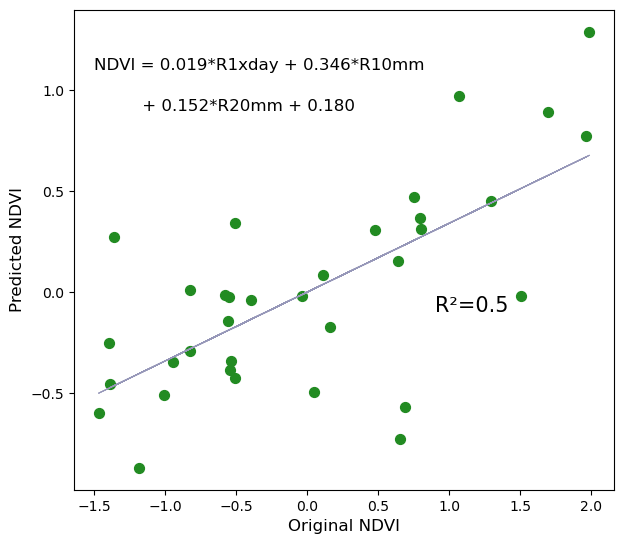

In [12]:
s,d,r,p,_ = linregress(ndvi_stan,ndvi_predict)
fig=plt.figure(figsize=(12,12))
ax = fig.add_axes([0.0,0.0,0.45,0.4])
ax.scatter(ndvi_stan,ndvi_predict,c='#228B22',s=50)
ax.plot(ndvi_stan,ndvi_stan*s+d,lw=0.8,c='#9798b9')
ax.set_xlabel('Original NDVI',fontsize=12)
ax.set_ylabel('Predicted NDVI',fontsize=12)
ax.text(-1.5,1.1,'NDVI = 0.019*R1xday + 0.346*R10mm ',fontsize=12)
ax.text(-1.2,0.9,' + 0.152*R20mm + 0.180',fontsize=12)
ax.text(0.9,-0.1,'R²=0.5 ',fontsize=15)

#fig.savefig('/mnt/f/others/图片/output/model.eps',format='pdf',dpi=600,bbox_inches = 'tight')
#fig.savefig('/mnt/f/others/图片/output/model.tiff',format='tiff',dpi=600,bbox_inches = 'tight')
#fig.savefig('/mnt/f/others/图片/output/model.jpg',format='jpg',dpi=600,bbox_inches = 'tight')

## 图 极端气候指数多年变化趋势图

In [35]:
mean_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/mean_mean.csv')
tm_mean = np.array(mean_mean['tm'])
pre_mean = np.array(mean_mean['pre'])

indices_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/indices_mean.csv')
txx_mean = np.array(indices_mean['TXX'])
tnx_mean = np.array(indices_mean['TNX'])
txn_mean = np.array(indices_mean['TXN'])
tnn_mean = np.array(indices_mean['TNN'])
tx90_mean = np.array(indices_mean['TX90'])
tn90_mean = np.array(indices_mean['TN90'])
tx10_mean = np.array(indices_mean['TX10'])
tn10_mean = np.array(indices_mean['TN10'])
dtr_mean = np.array(indices_mean['DTR'])
r1xday_mean = np.array(indices_mean['R1xday'])
r1mm_mean = np.array(indices_mean['R1mm'])
r10mm_mean = np.array(indices_mean['R10mm'])
r20mm_mean = np.array(indices_mean['R20mm'])

ndvi_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_mean.csv')
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

slope_mean = np.array([tm_mean,txx_mean,tnx_mean,txn_mean,tnn_mean,tx90_mean,tn90_mean,tx10_mean,tn10_mean,dtr_mean,pre_mean,r1xday_mean,r1mm_mean,r10mm_mean,r20mm_mean])

s = np.full((15),fill_value=np.nan)
d = np.full((15),fill_value=np.nan)
p = np.full((15),fill_value=np.nan)
r = np.full((15),fill_value=np.nan)

for i in range(15):
    s[i],d[i],r[i],p[i],_ = linregress(year,slope_mean[i])

Text(1995, 4.2, 'R20mm  y=-0.0061x+14.596  R²=0.008 ')

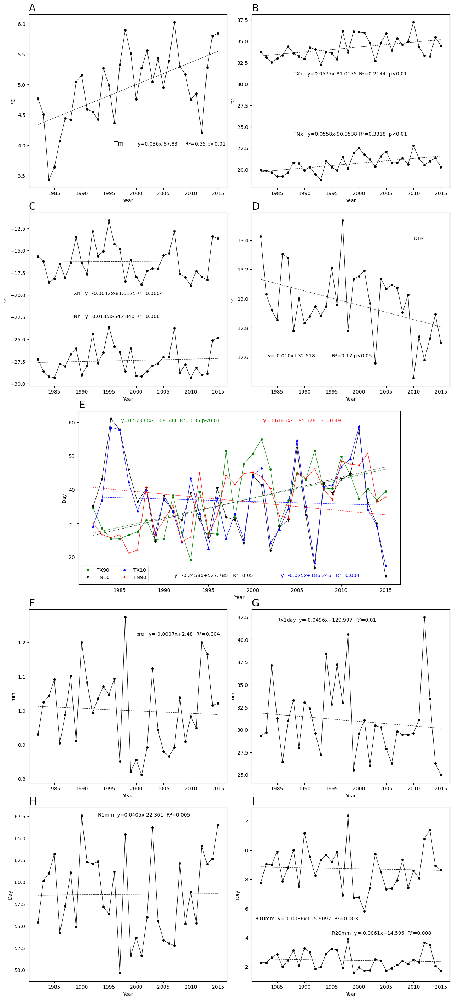

In [49]:
fig=plt.figure(figsize=(14,14))
year = np.arange(1982,2016,1)

ax1 = fig.add_axes([0, 0, 0.4, 0.35])
ax1.set_xlabel('Year')
ax1.set_ylabel('℃')
ax1.set_title('A',loc='left',fontsize=20)
ax1.plot(year,tm_mean,lw=0.8,marker='o',color='k',ms='4')
ax1.plot(year,s[0]*year+d[0],'k--',lw=0.7)
ax1.text(2000,4.0,' y=0.036x-67.83 ')
ax1.text(2009,4.0,'R²=0.35 p<0.01 ')
ax1.text(1996,4.0,'Tm',fontsize=12)

ax2 = fig.add_axes([0.45, 0, 0.4, 0.35])
ax2.set_xlabel('Year')
ax2.set_ylabel('℃')
ax2.set_title('B',loc='left',fontsize=20)
ax2.plot(year,txx_mean,lw=0.8,marker='o',color='k',ms='4')
ax2.plot(year,s[1]*year+d[1],'k--',lw=0.7)
ax2.plot(year,tnx_mean,lw=0.8,marker='o',color='k',ms='4')
ax2.plot(year,s[2]*year+d[2],'k--',lw=0.7)
ax2.text(1988,31,'TXx   y=0.0577x-81.0175 ')
ax2.text(2000,31,'R²=0.2144  p<0.01')
ax2.text(1988,24,'TNx   y=0.0558x-90.9538 ')
ax2.text(2000,24,'R²=0.3318  p<0.01')

ax3 = fig.add_axes([0, -0.4, 0.4, 0.35])
ax3.set_xlabel('Year')
ax3.set_ylabel('℃')
ax3.set_title('C',loc='left',fontsize=20)
ax3.plot(year,txn_mean,lw=0.8,marker='o',color='k',ms='4')
ax3.plot(year,s[3]*year+d[3],'k--',lw=0.7)
ax3.plot(year,tnn_mean,lw=0.8,marker='o',color='k',ms='4')
ax3.plot(year,s[4]*year+d[4],'k--',lw=0.7)
ax3.text(1988,-20,'TXn   y=-0.0042x-81.0175 ')
ax3.text(2000,-20,'R²=0.0004 ')
ax3.text(1988,-22.6,'TNn   y=0.0135x-54.4340 ')
ax3.text(2000,-22.6,'R²=0.006 ')

ax4 = fig.add_axes([0.45, -0.4, 0.4, 0.35])
ax4.set_xlabel('Year')
ax4.set_ylabel('℃')
ax4.set_title('D',loc='left',fontsize=20)
ax4.plot(year,dtr_mean,lw=0.8,marker='o',color='k',ms='4')
ax4.plot(year,s[9]*year+d[9],'k--',lw=0.7)
ax4.text(1983,12.6,' y=-0.010x+32.518 ')
ax4.text(1995,12.6,'R²=0.17 p<0.05 ')
ax4.text(2010,13.4,'DTR')

ax5 = fig.add_axes([0.1, -0.8, 0.65, 0.35])
ax5.set_xlabel('Year')
ax5.set_ylabel('Day')
ax5.set_title('E',loc='left',fontsize=20)
ax5.plot(year,tx90_mean,lw=0.8,marker='o',color='g',ms='4',label='TX90')
ax5.plot(year,s[5]*year+d[5],'g--',lw=0.7)
ax5.plot(year,tn10_mean,lw=0.8,marker='v',color='k',ms='4',label='TN10')
ax5.plot(year,s[6]*year+d[6],'k--',lw=0.7)
ax5.plot(year,tx10_mean,lw=0.8,marker='^',color='b',ms='4',label='TX10')
ax5.plot(year,s[7]*year+d[7],'b--',lw=0.7)
ax5.plot(year,tn90_mean,lw=0.8,marker='+',color='r',ms='4',label='TN90')
ax5.plot(year,s[8]*year+d[8],'r--',lw=0.7)
ax5.legend(loc=3,ncol=2)
ax5.text(1985,60,' y=0.57330x-1108.644  R²=0.35 p<0.01 ',c='g')
ax5.text(2001,60,' y=0.6166x-1195.678   R²=0.49 ',c='r')
ax5.text(1991,14,' y=-0.2458x+527.785   R²=0.05 ',c='k')
ax5.text(2003,14,' y=-0.075x+186.246   R²=0.004 ',c='b')

ax6 = fig.add_axes([0.0, -1.2, 0.4, 0.35])
ax6.set_xlabel('Year')
ax6.set_ylabel('mm')
ax6.set_title('F',loc='left',fontsize=20)
ax6.plot(year,pre_mean,lw=0.8,marker='o',color='k',ms='4')
ax6.plot(year,s[10]*year+d[10],'k--',lw=0.7)
ax6.text(2002,1.22,' y=-0.0007x+2.48 ')
ax6.text(2011,1.22,'R²=0.004 ')
ax6.text(2000,1.22,'pre')

ax7 = fig.add_axes([0.45, -1.2, 0.4, 0.35])
ax7.set_xlabel('Year')
ax7.set_ylabel('mm')
ax7.set_title('G',loc='left',fontsize=20)
ax7.plot(year,r1xday_mean,lw=0.8,marker='o',color='k',ms='4')
ax7.plot(year,s[11]*year+d[11],'k--',lw=0.7)
ax7.text(1985,42,'Rx1day  y=-0.0496x+129.997  R²=0.01 ')

ax8 = fig.add_axes([0.0, -1.6, 0.4, 0.35])
ax8.set_xlabel('Year')
ax8.set_ylabel('Day')
ax8.set_title('H',loc='left',fontsize=20)
ax8.plot(year,r1mm_mean,lw=0.8,marker='o',color='k',ms='4')
ax8.plot(year,s[12]*year+d[12],'k--',lw=0.7)
ax8.text(1993,67.5,'R1mm  y=0.0405x-22.361  R²=0.005 ')

ax9 = fig.add_axes([0.45, -1.6, 0.4, 0.35])
ax9.set_xlabel('Year')
ax9.set_ylabel('Day')
ax9.set_title('I',loc='left',fontsize=20)
ax9.plot(year,r10mm_mean,lw=0.8,marker='o',color='k',ms='4')
ax9.plot(year,s[13]*year+d[13],'k--',lw=0.7)
ax9.plot(year,r20mm_mean,lw=0.8,marker='o',color='k',ms='4')
ax9.plot(year,s[14]*year+d[14],'k--',lw=0.7)
ax9.text(1981,5.2,'R10mm  y=-0.0086x+25.9097  R²=0.003 ')
ax9.text(1995,4.2,'R20mm  y=-0.0061x+14.596  R²=0.008 ')

## 时滞性分析

### 原始数据

In [52]:
#导入数据
time_correlation = np.load('/mnt/f/cn05/cn05_huabei/output/time_correlation_primaray.npz')
r0 = time_correlation['r0']
p0 = time_correlation['p0']
r1 = time_correlation['r1']
p1 = time_correlation['p1']
r2 = time_correlation['r2']
p2 = time_correlation['p2']
r3 = time_correlation['r3']
p3 = time_correlation['p3']

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'projection'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


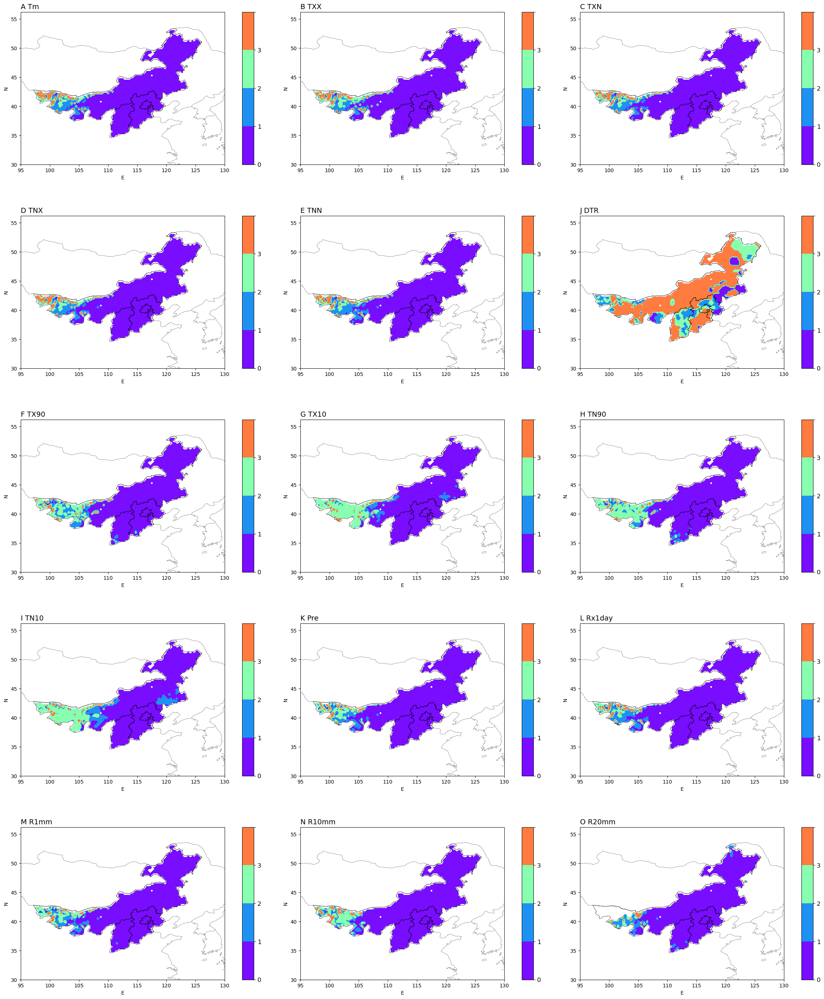

In [53]:
time = np.full((15,101,141),fill_value = np.nan)

for k in range(15):
    for m in range(101):
        for n in range(141):
            if abs(r0[k,m,n]) > abs(r1[k,m,n]) and abs(r0[k,m,n]) > abs(r2[k,m,n]) and abs(r0[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 0
            elif abs(r1[k,m,n]) > abs(r0[k,m,n]) and abs(r1[k,m,n]) > abs(r2[k,m,n]) and abs(r1[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 1
            elif abs(r2[k,m,n]) > abs(r0[k,m,n]) and abs(r2[k,m,n]) > abs(r1[k,m,n]) and abs(r2[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 2
            elif abs(r3[k,m,n]) > abs(r0[k,m,n]) and abs(r3[k,m,n]) > abs(r1[k,m,n]) and abs(r3[k,m,n]) > abs(r2[k,m,n]):
                time[k,m,n] = 3

title = np.array(['A Tm','B TXX','C TXN','D TNX','E TNN','J DTR','F TX90','G TX10','H TN90','I TN10','K Pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((5,3))
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')
time = time.reshape(5,3,101,141)

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

fig=plt.figure(figsize=(16,16))
for i in range(5):
    for j in range(3):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=14)
        r = ax.contourf(lon,lat,time[i,j,:],cmap = 'rainbow',projection =ccrs.PlateCarree(central_longitude=112.5),levels = [0,0.1,1.1,2.1,3.1])
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        cb = fig.colorbar(r,cax = cax)
        #tick_locator = ticker.MaxNLocator(nbins=0) 
        cb.set_ticklabels(ticklabels = ('0','1','2','3',' '))
        #cb.locator = tick_locator
        #cb.update_ticks()
        cb.ax.tick_params(labelsize=12)

### 去季节

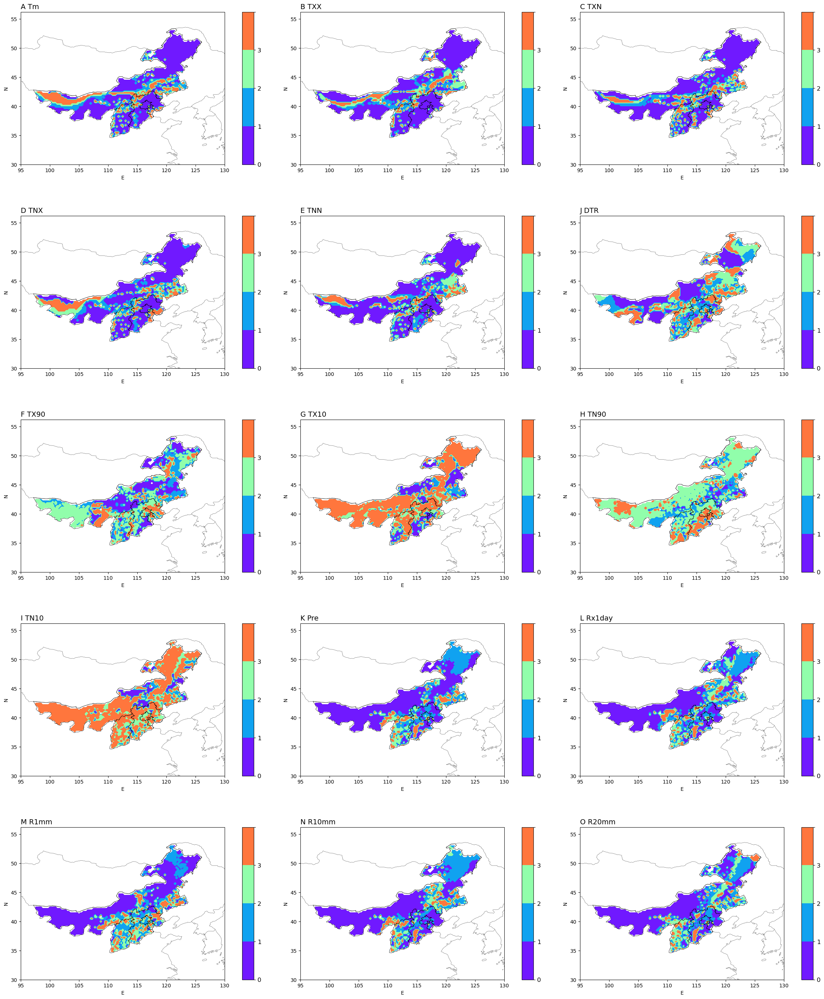

In [60]:
#导入数据
time_correlation = np.load('/mnt/f/cn05/cn05_huabei/output/time_correlation.npz')
r0 = time_correlation['r0']
p0 = time_correlation['p0']
r1 = time_correlation['r1']
p1 = time_correlation['p1']
r2 = time_correlation['r2']
p2 = time_correlation['p2']
r3 = time_correlation['r3']
p3 = time_correlation['p3']
time = np.full((15,101,141),fill_value = np.nan)

for k in range(15):
    for m in range(101):
        for n in range(141):
            if abs(r0[k,m,n]) > abs(r1[k,m,n]) and abs(r0[k,m,n]) > abs(r2[k,m,n]) and abs(r0[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 0
            elif abs(r1[k,m,n]) > abs(r0[k,m,n]) and abs(r1[k,m,n]) > abs(r2[k,m,n]) and abs(r1[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 1
            elif abs(r2[k,m,n]) > abs(r0[k,m,n]) and abs(r2[k,m,n]) > abs(r1[k,m,n]) and abs(r2[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 2
            elif abs(r3[k,m,n]) > abs(r0[k,m,n]) and abs(r3[k,m,n]) > abs(r1[k,m,n]) and abs(r3[k,m,n]) > abs(r2[k,m,n]):
                time[k,m,n] = 3

title = np.array(['A Tm','B TXX','C TXN','D TNX','E TNN','J DTR','F TX90','G TX10','H TN90','I TN10','K Pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((5,3))
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')
time = time.reshape(5,3,101,141)

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

fig=plt.figure(figsize=(16,16))
for i in range(5):
    for j in range(3):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=14)
        r = ax.contourf(lon,lat,time[i,j,:],cmap = 'rainbow',projection =ccrs.PlateCarree(central_longitude=112.5),levels = [-0.1,0.1,1.1,2.1,3.1])
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        cb = fig.colorbar(r,cax = cax)
        #tick_locator = ticker.MaxNLocator(nbins=0) 
        cb.set_ticklabels(ticklabels = ('0','1','2','3',' '))
        #cb.locator = tick_locator
        #cb.update_ticks()
        cb.ax.tick_params(labelsize=12)

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'projection'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


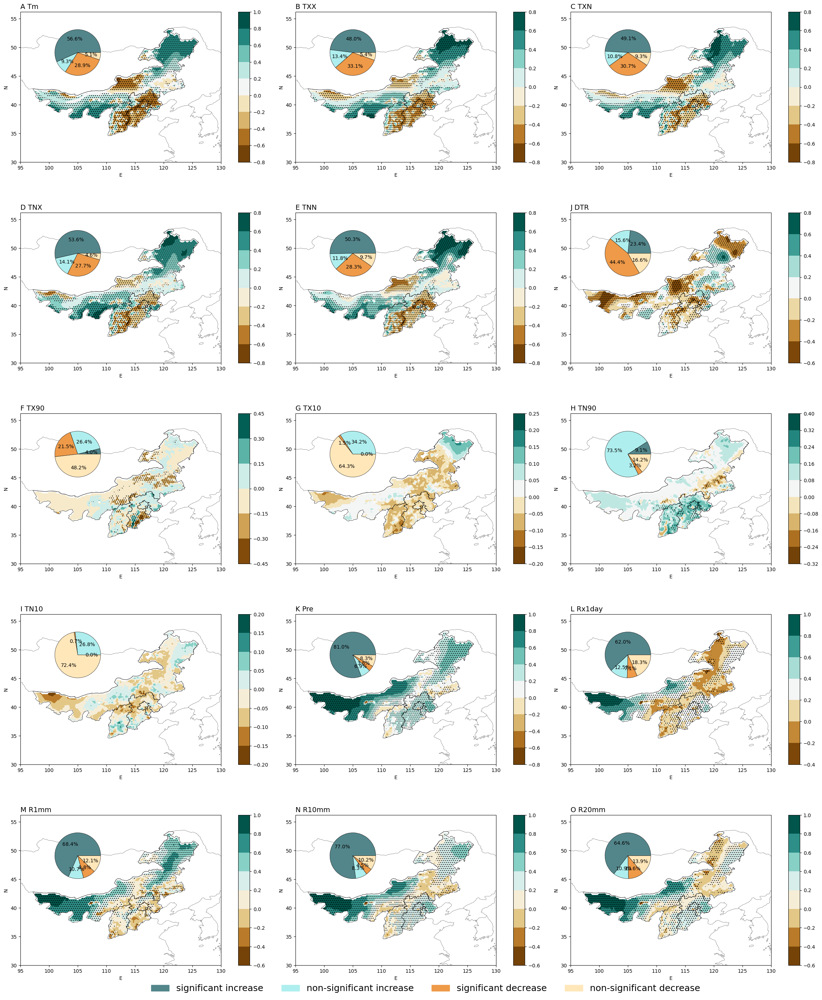

In [62]:
#导入数据
time_correlation = np.load('/mnt/f/cn05/cn05_huabei/output/time_correlation.npz')
r0 = time_correlation['r0']
p0 = time_correlation['p0']
r1 = time_correlation['r1']
p1 = time_correlation['p1']
r2 = time_correlation['r2']
p2 = time_correlation['p2']
r3 = time_correlation['r3']
p3 = time_correlation['p3']

correlation = np.full((15,101,141),fill_value = np.nan)
p_value = np.full((15,101,141),fill_value = np.nan)

for k in range(15):
    for m in range(101):
        for n in range(141):
            if abs(r0[k,m,n]) > abs(r1[k,m,n]) and abs(r0[k,m,n]) > abs(r2[k,m,n]) and abs(r0[k,m,n]) > abs(r3[k,m,n]):
                correlation[k,m,n] = r0[k,m,n]
                p_value[k,m,n] = p0[k,m,n]
            elif abs(r1[k,m,n]) > abs(r0[k,m,n]) and abs(r1[k,m,n]) > abs(r2[k,m,n]) and abs(r1[k,m,n]) > abs(r3[k,m,n]):
                correlation[k,m,n] = r1[k,m,n]
                p_value[k,m,n] = p0[k,m,n]
            elif abs(r2[k,m,n]) > abs(r0[k,m,n]) and abs(r2[k,m,n]) > abs(r1[k,m,n]) and abs(r2[k,m,n]) > abs(r3[k,m,n]):
                correlation[k,m,n] = r2[k,m,n]
                p_value[k,m,n] = p0[k,m,n]
            elif abs(r3[k,m,n]) > abs(r0[k,m,n]) and abs(r3[k,m,n]) > abs(r1[k,m,n]) and abs(r3[k,m,n]) > abs(r2[k,m,n]):
                correlation[k,m,n] = r3[k,m,n]
                p_value[k,m,n] = p0[k,m,n]


#显著正相关，不显著正相关，显著负相关，不显著负相关
#进行循环，分为四种情况，画饼图

proportion = np.full((15,4),fill_value=0)
for k in range(15):
    for i in range(101):
        for j in range(141):
            if correlation[k,i,j] > 0 and p_value[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif correlation[k,i,j] > 0 and p_value[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif correlation[k,i,j] < 0 and p_value[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif correlation[k,i,j] < 0 and p_value[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

title = np.array(['A Tm','B TXX','C TXN','D TNX','E TNN','J DTR','F TX90','G TX10','H TN90','I TN10','K Pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((5,3))
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

correlation = correlation.reshape(5,3,101,141)
proportion = proportion.reshape(5,3,4)
p_value = p_value.reshape(5,3,101,141)

fig=plt.figure(figsize=(16,16))
for i in range(5):
    for j in range(3):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=14)
        norm = TwoSlopeNorm(vcenter=0)
        r = ax.contourf(lon,lat,correlation[i,j,:],cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
        slope_p = ax.contourf(lon,lat,p_value[i,j,:],levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        cb = fig.colorbar(r,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.48, 1.66-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        #colors = ['#EE799F','#FFE4E1','#4D8048','#A8BF91']
        colors =['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#53868B', label='significant increase'),mpatches.Patch(color='#AFEEEE', label='non-significant increase'),mpatches.Patch(color='#EE9A49', label='significant decrease'),mpatches.Patch(color='#FFE7BA', label='non-significant decrease')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(1.3,0.1),ncol = 4)

    

### 5-10月

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'projection'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


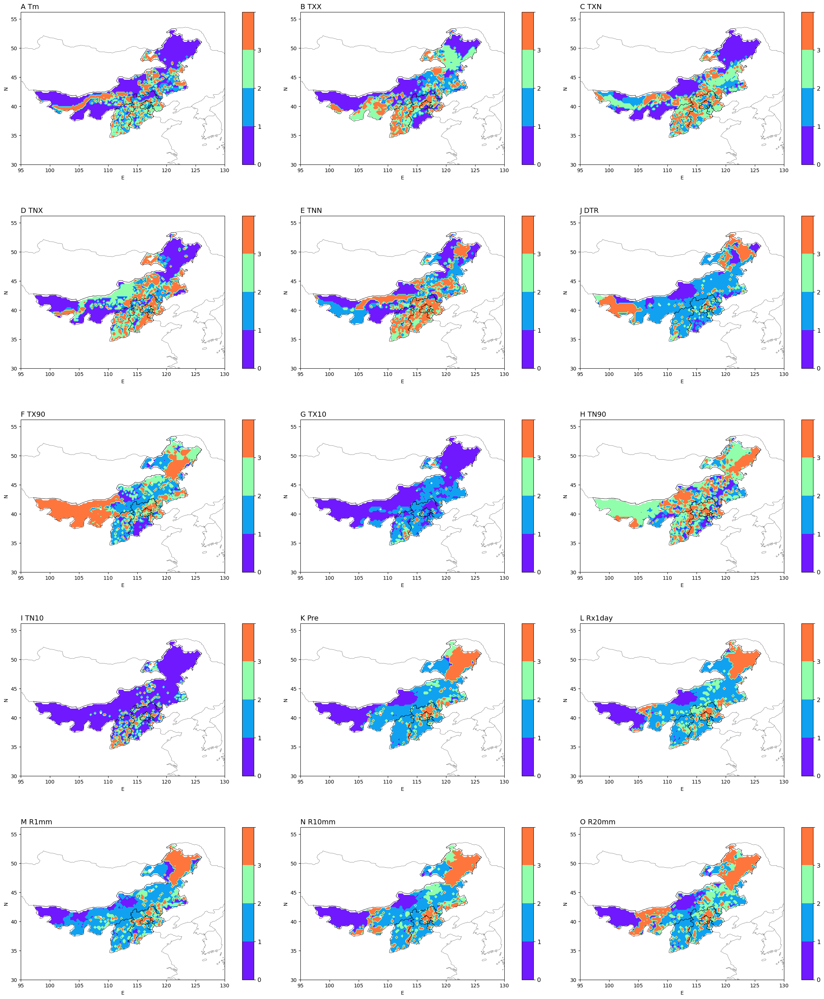

In [29]:
#导入数据
time_correlation = np.load('/mnt/f/cn05/cn05_huabei/output/time_correlation_510.npz')
r0 = time_correlation['r0']
p0 = time_correlation['p0']
r1 = time_correlation['r1']
p1 = time_correlation['p1']
r2 = time_correlation['r2']
p2 = time_correlation['p2']
r3 = time_correlation['r3']
p3 = time_correlation['p3']
time = np.full((15,101,141),fill_value = np.nan)

r1[9,:,:]=0
p1[9,:,:]=0


for k in range(15):
    for m in range(101):
        for n in range(141):
            if abs(r0[k,m,n]) > abs(r1[k,m,n]) and abs(r0[k,m,n]) > abs(r2[k,m,n]) and abs(r0[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 0
            elif abs(r1[k,m,n]) > abs(r0[k,m,n]) and abs(r1[k,m,n]) > abs(r2[k,m,n]) and abs(r1[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 1
            elif abs(r2[k,m,n]) > abs(r0[k,m,n]) and abs(r2[k,m,n]) > abs(r1[k,m,n]) and abs(r2[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 2
            elif abs(r3[k,m,n]) > abs(r0[k,m,n]) and abs(r3[k,m,n]) > abs(r1[k,m,n]) and abs(r3[k,m,n]) > abs(r2[k,m,n]):
                time[k,m,n] = 3

title = np.array(['A Tm','B TXX','C TXN','D TNX','E TNN','J DTR','F TX90','G TX10','H TN90','I TN10','K Pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((5,3))
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')
time = time.reshape(5,3,101,141)

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

fig=plt.figure(figsize=(16,16))
for i in range(5):
    for j in range(3):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=14)
        r = ax.contourf(lon,lat,time[i,j,:],cmap = 'rainbow',projection =ccrs.PlateCarree(central_longitude=112.5),levels = [-0.1,0.1,1.1,2.1,3.1])
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        cb = fig.colorbar(r,cax = cax)
        #tick_locator = ticker.MaxNLocator(nbins=0) 
        cb.set_ticklabels(ticklabels = ('0','1','2','3',' '))
        #cb.locator = tick_locator
        #cb.update_ticks()
        cb.ax.tick_params(labelsize=12)


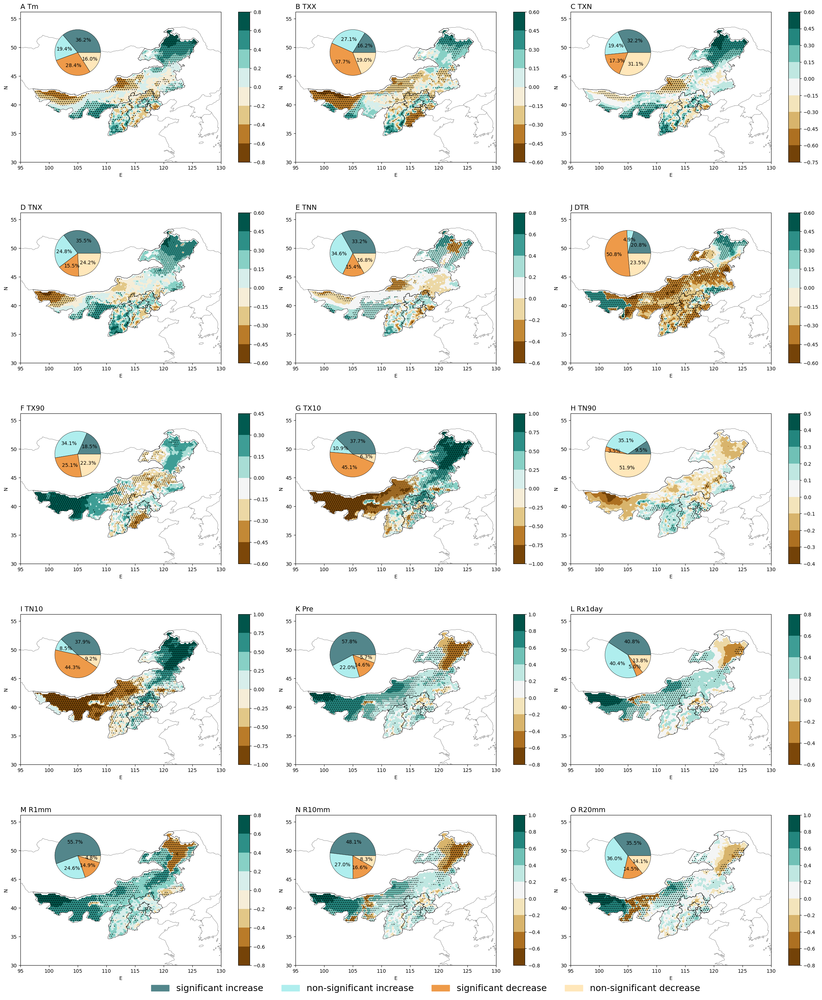

In [31]:
#导入数据
time_correlation = np.load('/mnt/f/cn05/cn05_huabei/output/time_correlation_510.npz')
r0 = time_correlation['r0']
p0 = time_correlation['p0']
r1 = time_correlation['r1']
p1 = time_correlation['p1']
r2 = time_correlation['r2']
p2 = time_correlation['p2']
r3 = time_correlation['r3']
p3 = time_correlation['p3']
time = np.full((15,101,141),fill_value = np.nan)
r1[9,:,:]=0
p1[9,:,:]=0
correlation = np.full((15,101,141),fill_value = np.nan)
p_value = np.full((15,101,141),fill_value = np.nan)

for k in range(15):
    for m in range(101):
        for n in range(141):
            if abs(r0[k,m,n]) > abs(r1[k,m,n]) and abs(r0[k,m,n]) > abs(r2[k,m,n]) and abs(r0[k,m,n]) > abs(r3[k,m,n]):
                correlation[k,m,n] = r0[k,m,n]
                p_value[k,m,n] = p0[k,m,n]
            elif abs(r1[k,m,n]) > abs(r0[k,m,n]) and abs(r1[k,m,n]) > abs(r2[k,m,n]) and abs(r1[k,m,n]) > abs(r3[k,m,n]):
                correlation[k,m,n] = r1[k,m,n]
                p_value[k,m,n] = p0[k,m,n]
            elif abs(r2[k,m,n]) > abs(r0[k,m,n]) and abs(r2[k,m,n]) > abs(r1[k,m,n]) and abs(r2[k,m,n]) > abs(r3[k,m,n]):
                correlation[k,m,n] = r2[k,m,n]
                p_value[k,m,n] = p0[k,m,n]
            elif abs(r3[k,m,n]) > abs(r0[k,m,n]) and abs(r3[k,m,n]) > abs(r1[k,m,n]) and abs(r3[k,m,n]) > abs(r2[k,m,n]):
                correlation[k,m,n] = r3[k,m,n]
                p_value[k,m,n] = p0[k,m,n]


#显著正相关，不显著正相关，显著负相关，不显著负相关
#进行循环，分为四种情况，画饼图

proportion = np.full((15,4),fill_value=0)
for k in range(15):
    for i in range(101):
        for j in range(141):
            if correlation[k,i,j] > 0 and p_value[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif correlation[k,i,j] > 0 and p_value[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif correlation[k,i,j] < 0 and p_value[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif correlation[k,i,j] < 0 and p_value[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

title = np.array(['A Tm','B TXX','C TXN','D TNX','E TNN','J DTR','F TX90','G TX10','H TN90','I TN10','K Pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((5,3))
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

correlation = correlation.reshape(5,3,101,141)
proportion = proportion.reshape(5,3,4)
p_value = p_value.reshape(5,3,101,141)

fig=plt.figure(figsize=(16,16))
for i in range(5):
    for j in range(3):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=14)
        norm = TwoSlopeNorm(vcenter=0)
        r = ax.contourf(lon,lat,correlation[i,j,:],cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
        slope_p = ax.contourf(lon,lat,p_value[i,j,:],levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        cb = fig.colorbar(r,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.48, 1.66-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        #colors = ['#EE799F','#FFE4E1','#4D8048','#A8BF91']
        colors =['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#53868B', label='significant increase'),mpatches.Patch(color='#AFEEEE', label='non-significant increase'),mpatches.Patch(color='#EE9A49', label='significant decrease'),mpatches.Patch(color='#FFE7BA', label='non-significant decrease')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(1.3,0.1),ncol = 4)

### 不同植被类型

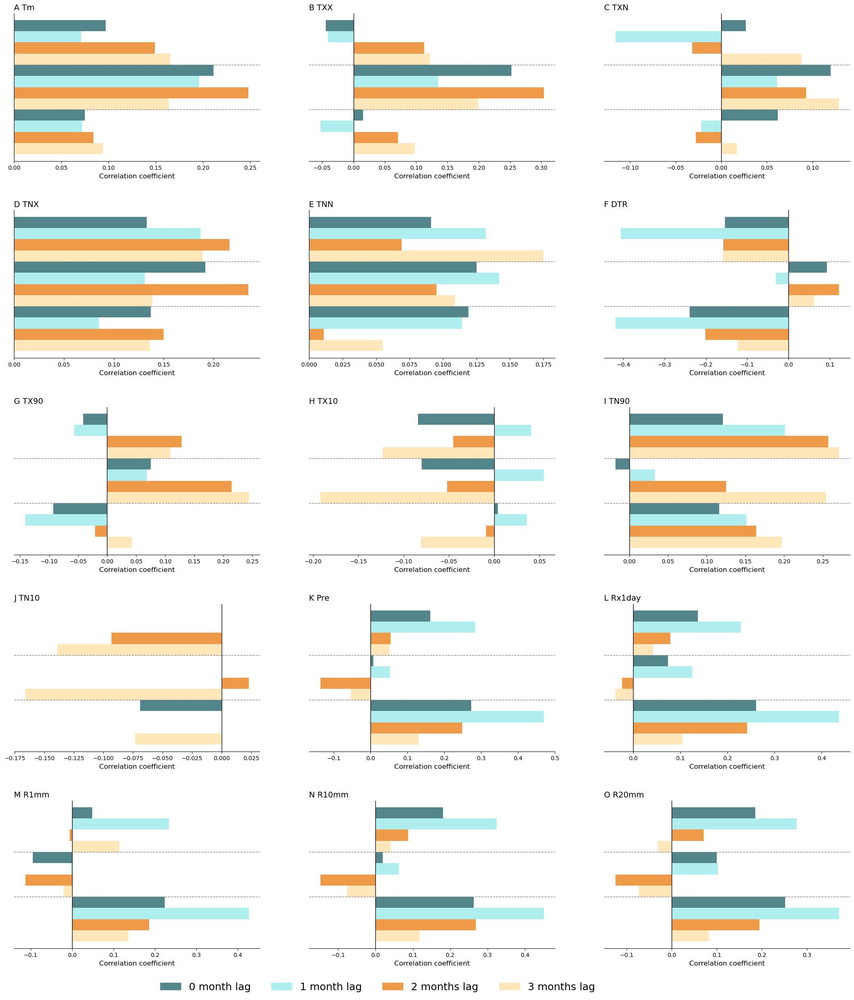

In [13]:
time_correlation = pd.read_csv('/mnt/f/tudi_ndvi/month/output/time_correlation.csv')

r0 = time_correlation['r0']
r1 = time_correlation['r1']
r2 = time_correlation['r2']
r3 = time_correlation['r3']
time_c = np.array([r0,r1,r2,r3])

farmland = time_c[:,15:30]
forest = time_c[:,30:45]
grassland = time_c[:,45:60]

farmland = farmland.reshape((4,5,3))
forest = forest.reshape((4,5,3))
grassland = grassland.reshape((4,5,3))

title = np.array(['A Tm','B TXX','C TXN','D TNX','E TNN','F DTR','G TX90','H TX10','I TN90','J TN10','K Pre','L Rx1day','M R1mm','N R10mm','O R20mm'])
title = title.reshape((5,3))
x1 = np.arange(0,1.2,0.4)
x2 = np.arange(0.1,1.3,0.4)
x3 = np.arange(0.2,1.4,0.4)
x4 = np.arange(0.3,1.5,0.4)

fig=plt.figure(figsize=(12,12))
for i in range(5):
    for j in range(3):
        ax = fig.add_axes([0.1+j*0.6, 1.5-i*0.4, 0.5, 0.3])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.axvline(x=0,c='k',lw=1.0)
        ax.set_yticks([])
        ax.tick_params(axis='y', width=0)
        ax.axhline(y=0.35,c='grey',lw=1.0, ls="--")
        ax.axhline(y=0.75,c='grey',lw=1.0, ls="--")
        ax.set_xlabel('Correlation coefficient',fontsize=12)
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=14)
        bar1 = ax.barh(x4,(grassland[0,i,j],forest[0,i,j],farmland[0,i,j]),color='#53868B',height=0.1,align='center')
        bar2 = ax.barh(x3,(grassland[1,i,j],forest[1,i,j],farmland[1,i,j]),color='#AFEEEE',height=0.1,align='center')
        bar3 = ax.barh(x2,(grassland[2,i,j],forest[2,i,j],farmland[2,i,j]),color='#EE9A49',height=0.1,align='center')
        bar4 = ax.barh(x1,(grassland[3,i,j],forest[3,i,j],farmland[3,i,j]),color='#FFE7BA',height=0.1,align='center')
        #ax.text(-0.6,0.15,'Grassland',fontsize=12)
        #ax.text(-0.6,0.55,'Forest',fontsize=12)
        #ax.text(-0.6,0.95,'Farmland',fontsize=12)

#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#53868B', label='0 month lag'),mpatches.Patch(color='#AFEEEE', label='1 month lag'),mpatches.Patch(color='#EE9A49', label='2 months lag'),mpatches.Patch(color='#FFE7BA', label='3 months lag')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(1.3,-0.15),ncol = 4)


## poster

/tmp/ipykernel_343/3914689240.py:30: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax2.plot(year,s2*year+d2,'k--',lw=0.7,color='#8B814C')
/tmp/ipykernel_343/3914689240.py:31: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax2.plot(year,s3*year+d3,'k--',lw=0.7,color='#228B22')
/tmp/ipykernel_343/3914689240.py:32: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax2.plot(year,s4*year+d4,'k--',lw=0.7,color='#20B2AA')


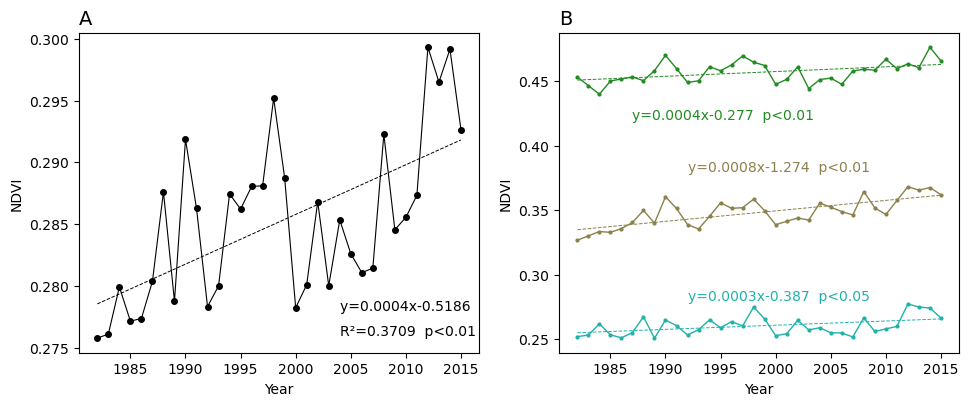

In [10]:
#求线性趋势
s1,d1,r1,p1,_ = linregress(year,ndvi_mean)
s2,d2,r2,p2,_ = linregress(year,ndvi_mean_1112)
s3,d3,r3,p3,_ = linregress(year,ndvi_mean_2124)
s4,d4,r4,p4,_ = linregress(year,ndvi_mean_3133)

#设置图纸大小
fig=plt.figure(figsize=(8,8))
#第一个图的位置
ax1 = fig.add_axes([0.0,0.0,0.5,0.4])
#折线图
ax1.plot(year,ndvi_mean,lw=0.8,marker='o',color='k',ms='4')
#设置标题
ax1.set_title('A',fontsize=14,loc='left')
#加入线性趋势
ax1.plot(year,s1*year+d1,'k--',lw=0.7)
#加入xy轴标签
ax1.set_xlabel('Year')
ax1.set_ylabel('NDVI')
#加入标注
ax1.text(2004,0.278,'y=0.0004x-0.5186 ')
ax1.text(2004,0.276,'R²=0.3709  p<0.01')

#第二个图位置
ax2 = fig.add_axes([0.6,0.0,0.5,0.4])
#折线图
ax2.plot(year,ndvi_mean_1112,lw=1,marker = '.',color='#8B814C',ms='4',label = 'Farmland')
ax2.plot(year,ndvi_mean_2124,lw=1,marker = '.',color='#228B22',ms='4',label = 'Forest')
ax2.plot(year,ndvi_mean_3133,lw=1,marker = '.',color='#20B2AA',ms='4',label = 'Grassland')
ax2.plot(year,s2*year+d2,'k--',lw=0.7,color='#8B814C')
ax2.plot(year,s3*year+d3,'k--',lw=0.7,color='#228B22')
ax2.plot(year,s4*year+d4,'k--',lw=0.7,color='#20B2AA')
#设置标题
ax2.set_title('B',fontsize=14,loc='left')
#加入xy轴标签
ax2.set_xlabel('Year')
ax2.set_ylabel('NDVI')
#加入标注
ax2.text(1992,0.38,'y=0.0008x-1.274  p<0.01',color='#8B814C')
ax2.text(1987,0.42,'y=0.0004x-0.277  p<0.01',color='#228B22')
ax2.text(1992,0.28,'y=0.0003x-0.387  p<0.05',color='#20B2AA')

lon_ndvi = np.arange(95.041667,130.040267,0.08333)
lat_ndvi = np.arange(30.041667,55.040267,0.08333)
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')


/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'projection'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


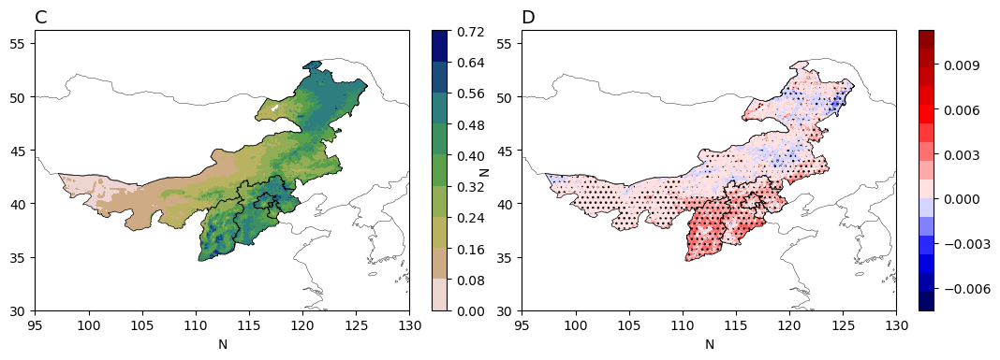

In [11]:
fig=plt.figure(figsize=(8,8))
#第三个图位置
ax3 = fig.add_axes([0.0,0.0,0.5,0.5],projection = ccrs.PlateCarree())
#设置xy轴经纬度标签
ax3.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax3.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
#伪彩色图
cf = ax3.contourf(lon_ndvi,lat_ndvi,ndvi_area_mean/10000,cmap = 'gist_earth_r',projection =ccrs.PlateCarree(central_longitude=112.5))
ax3.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
ax3.add_feature(cfeature.COASTLINE,lw = 0.3)
ax3.add_feature(cfeature.BORDERS,lw = 0.3)
ax3.set_extent([95, 130, 30, 55])
ax3.set_xlabel('E')
ax3.set_xlabel('N')
#设置标题C
ax3.set_title('C ',fontsize=14,loc='left')
#设置colorbar的位置
cax = fig.add_axes([ax3.get_position().x1+0.03,ax3.get_position().y0,0.02,ax3.get_position().height])
#添加colorbar
fig.colorbar(cf,cax=cax)

ax4 = fig.add_axes([0.65,0.0,0.5,0.5],projection = ccrs.PlateCarree())
#设置xy轴经纬度标签
ax4.set_xticks([0,120,240,360],('95°','105°','115°','125°'))
ax4.set_yticks([0,60,120,180,240,300],('30°','35°','40°','45°','50°','55°'))
ax4.set_xlabel('E')
ax4.set_ylabel('N')
ax4.set_title('D ',fontsize=14,loc='left')
#设置colorbar中零刻度为色条中心处（白色）
norm = TwoSlopeNorm(vcenter=0)
#填色图
slope = ax4.contourf(lon_ndvi,lat_ndvi,slope_NDVI/10000,norm = norm,cmap = 'seismic',levels = np.arange(-0.0075,0.0125,0.00125),projection =ccrs.PlateCarree(central_longitude=112.5))
slope_p = ax4.contourf(lon_ndvi,lat_ndvi,NDVI_p,levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
ax4.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
ax4.add_feature(cfeature.COASTLINE,lw = 0.3)
ax4.add_feature(cfeature.BORDERS,lw = 0.3)
ax4.set_extent([95, 130, 30, 55])
ax4.set_xlabel('E')
ax4.set_xlabel('N')
#设置colorbar位置
cax = fig.add_axes([ax4.get_position().x1+0.03,ax4.get_position().y0,0.02,ax4.get_position().height])
#添加colorbar
cb1 = fig.colorbar(slope,cax = cax)
#设置colorbar显示刻度个数
tick_locator = ticker.MaxNLocator(nbins=7) 
cb1.locator = tick_locator
cb1.update_ticks()

# 高温

## 平均温度和NDVI

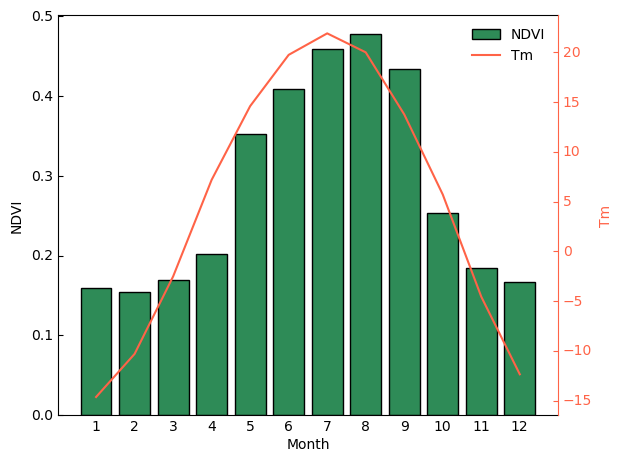

In [2]:
#导入数据
ndvi_month_mean = np.load('/mnt/f/cn05/cn05_huabei/output/ndvi_month_mean.npz')
indices_month_mean = np.load('/mnt/f/cn05/cn05_huabei/output/indices_month_mean.npz')
ndvi_month_mean = ndvi_month_mean['month_mean12']
indices_month_mean = indices_month_mean['month_mean12']
tm_month_mean = indices_month_mean[0,:]
pre_month_mean = indices_month_mean[10,:]

month = np.arange(1,13,1)

fig=plt.figure(figsize=(10,10))
ax = HostAxes(fig, [0.1,0.1,0.5,0.4]) 
ax1 = ParasiteAxes(ax, sharex=ax)
ax.parasites.append(ax1)
fig.add_axes(ax)
ax.bar(month,ndvi_month_mean/10000,color = '#2E8B57',edgecolor = 'black',label='NDVI')

ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
ax.axis['right'].set_visible(False)

ax1.axis['right'].set_visible(True)
ax1.axis['right'].major_ticklabels.set_visible(True)
ax1.axis['right'].label.set_visible(True)

ax1.axis['right'].major_ticks.set_color('#FF6347')
ax1.axis['right'].major_ticklabels.set_color('#FF6347')
ax1.axis['right'].line.set_color('#FF6347')

ax.set_ylabel('NDVI')
ax.set_xlabel('Month')
ax1.set_ylabel('Tm',c='#FF6347')
#让刻度线消失的神奇代码！！
ax.tick_params(axis='x', width=0)
ax1.plot(month,tm_month_mean,ls='-',lw=1.5,c='#FF6347',label='Tm',zorder=1)
ax.legend(frameon=False)

## 空间变化趋势

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'projection'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


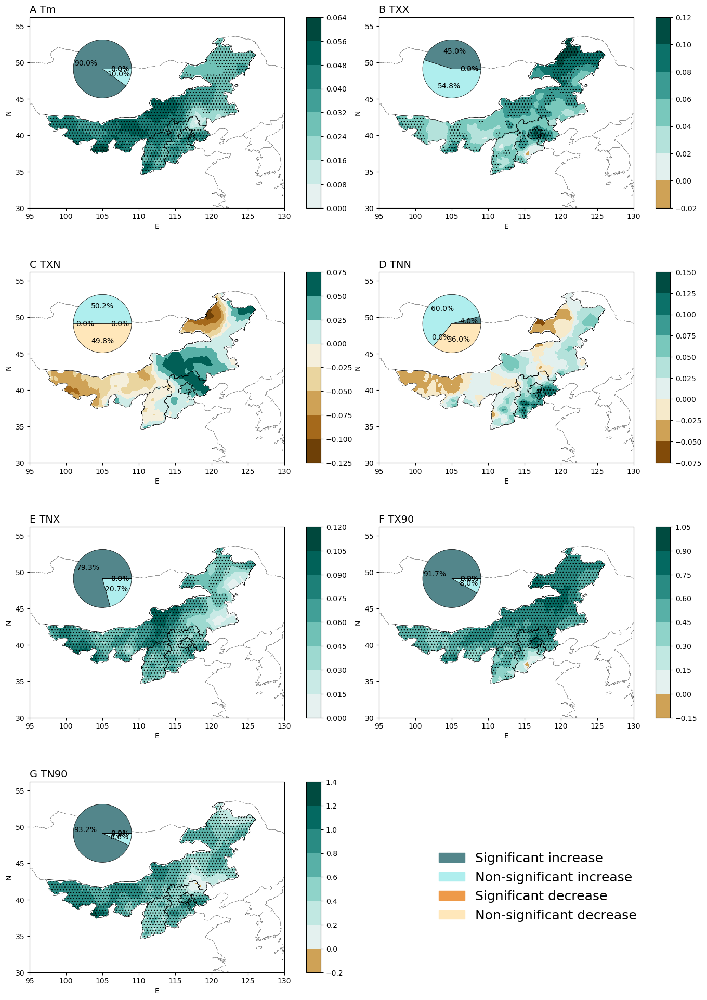

In [19]:
title = np.array(['A Tm','B TXX','C TXN','D TNN','E TNX','F TX90'])
title = title.reshape((3,2))
#读取文件
slope =  np.load('/mnt/f/cn05/cn05_huabei/output/indices_slope.npz')
indices_slope = np.array(slope['indices_slope'])
indices_slope_p = np.array(slope['indices_slope_p'])

tem_slope = np.delete(indices_slope, [6,8,9,10,11,12,13,14], axis=0)
tem_slope_p =np.delete(indices_slope_p, [6,8,9,10,11,12,13,14], axis=0)

huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

#显著增加，不显著增加，显著减少，不显著减少
#进行循环，分为四种情况，画饼图
lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)
proportion = np.full((7,4),fill_value=0)
for k in range(7):
    for i in range(101):
        for j in range(141):
            if tem_slope[k,i,j] > 0 and tem_slope_p[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif tem_slope[k,i,j] > 0 and tem_slope_p[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif tem_slope[k,i,j] < 0 and tem_slope_p[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif tem_slope[k,i,j] < 0 and tem_slope_p[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

tem_slope = indices_slope[0:6,:,:]
tem_slope_p = indices_slope_p[0:6,:,:]

tn90_slope = indices_slope[7,:,:]
tn90_slope_p = indices_slope_p[7,:,:]

tem_proportion = proportion[0:6,:]
tn90_proportion = proportion[6,:]

tem_slope = tem_slope.reshape(3,2,101,141)
tem_slope_p = tem_slope_p.reshape(3,2,101,141)
tem_proportion = tem_proportion.reshape(3,2,4)


fig=plt.figure(figsize=(14,14))
for i in range(3):
    for j in range(2):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E')
        ax.set_ylabel('N')
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=14)
        norm = TwoSlopeNorm(vcenter=0)
        slope = tem_slope[i,j,:]
        slope[slope==0]=np.nan
        s = ax.contourf(lon,lat,tem_slope[i,j,:],norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
        slope_p = ax.contourf(lon,lat,tem_slope_p[i,j,:],levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        fig.colorbar(s,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.48, 1.66-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        colors = ['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(tem_proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

ax3 = fig.add_axes([0.1, 0.45, 0.35, 0.3],projection = ccrs.PlateCarree())
ax3.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
ax3.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
ax3.set_xlabel('E')
ax3.set_ylabel('N')
ax3.set_title('G TN90',loc='left',fontsize=14)
norm = TwoSlopeNorm(vcenter=0)
slope = tn90_slope
slope[slope==0]=np.nan
s = ax3.contourf(lon,lat,tn90_slope,norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
slope_p = ax3.contourf(lon,lat,tn90_slope_p,levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
ax3.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
ax3.add_feature(cfeature.COASTLINE,lw = 0.3)
ax3.add_feature(cfeature.BORDERS,lw = 0.3)
ax3.set_extent([95, 130, 30, 55])
cax = fig.add_axes([ax3.get_position().x1+0.03,ax3.get_position().y0,0.02,ax3.get_position().height])
fig.colorbar(s,cax = cax)
ax4 = fig.add_axes([0.15, 0.61, 0.1, 0.1])
ax4.axis('off')
ax4.pie(tn90_proportion,autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#53868B', label='Significant increase'),mpatches.Patch(color='#AFEEEE', label='Non-significant increase'),mpatches.Patch(color='#EE9A49', label='Significant decrease'),mpatches.Patch(color='#FFE7BA', label='Non-significant decrease')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(0.95,0.65),ncol = 1)

## 相关性分析

### 去趋势前

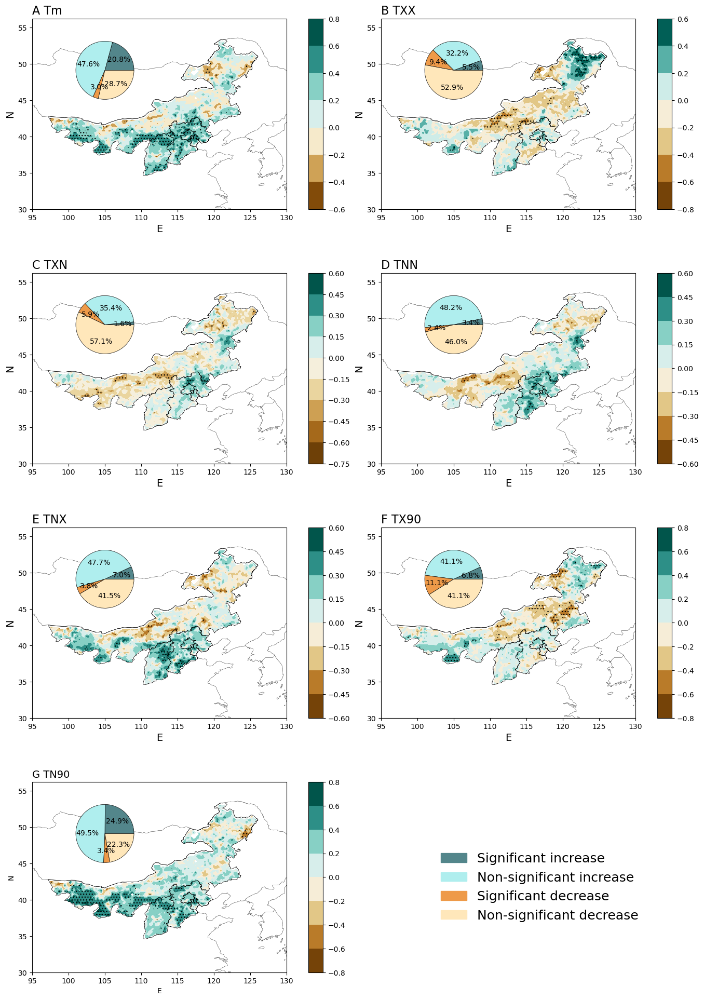

In [27]:
title = np.array(['A Tm','B TXX','C TXN','D TNN','E TNX','F TX90'])
title = title.reshape((3,2))
#读取文件
correlation =  np.load('/mnt/f/cn05/cn05_huabei/output/correlation.npz')
indices_r = np.array(correlation['inidices_year_r'])
indices_p = np.array(correlation['indices_year_p'])

tem_r = np.delete(indices_r, [6,8,9,10,11,12,13,14], axis=0)
tem_p =np.delete(indices_p, [6,8,9,10,11,12,13,14], axis=0)

huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

#显著正相关，不显著正相关，显著负相关，不显著负相关
#进行循环，分为四种情况，画饼图
proportion = np.full((7,4),fill_value=0)
for k in range(7):
    for i in range(101):
        for j in range(141):
            if tem_r[k,i,j] > 0 and tem_p[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif tem_r[k,i,j] > 0 and tem_p[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif tem_r[k,i,j] < 0 and tem_p[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif tem_r[k,i,j] < 0 and tem_p[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

#把所有准备画图的数据进行变形，对应3行2列
tem_r = indices_r[0:6,:,:]
tem_p = indices_p[0:6,:,:]

tn90_r = indices_r[7,:,:]
tn90_p = indices_p[7,:,:]

tem_proportion = proportion[0:6,:]
tn90_proportion = proportion[6,:]

tem_r = tem_r.reshape(3,2,101,141)
tem_p = tem_p.reshape(3,2,101,141)
tem_proportion = tem_proportion.reshape(3,2,4)

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

fig=plt.figure(figsize=(14,14))
for i in range(3):
    for j in range(2):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E',fontsize=14)
        ax.set_ylabel('N',fontsize=14)
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=16)
        norm = TwoSlopeNorm(vcenter=0)
        r = ax.contourf(lon,lat,tem_r[i,j,:],norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
        slope_p = ax.contourf(lon,lat,tem_p[i,j,:],levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        ax.set_extent([95, 130, 30, 55])
        fig.colorbar(r,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.48, 1.66-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        #colors = ['183,034,048','#EEB4B4','#00BFFF','#1874CD']
        #colors = ['#EE5C42','#FFE4E1','#BFEFFF','#1C86EE']
        colors =['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(tem_proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

ax3 = fig.add_axes([0.1, 0.45, 0.35, 0.3],projection = ccrs.PlateCarree())
ax3.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
ax3.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
ax3.set_xlabel('E')
ax3.set_ylabel('N')
ax3.set_title('G TN90',loc='left',fontsize=14)
norm = TwoSlopeNorm(vcenter=0)
s = ax3.contourf(lon,lat,tn90_r,norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
slope_p = ax3.contourf(lon,lat,tn90_p,levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
ax3.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
ax3.add_feature(cfeature.COASTLINE,lw = 0.3)
ax3.add_feature(cfeature.BORDERS,lw = 0.3)
ax3.set_extent([95, 130, 30, 55])
cax = fig.add_axes([ax3.get_position().x1+0.03,ax3.get_position().y0,0.02,ax3.get_position().height])
fig.colorbar(s,cax = cax)
ax4 = fig.add_axes([0.15, 0.61, 0.1, 0.1])
ax4.axis('off')
ax4.pie(tn90_proportion,autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#53868B', label='Significant increase'),mpatches.Patch(color='#AFEEEE', label='Non-significant increase'),mpatches.Patch(color='#EE9A49', label='Significant decrease'),mpatches.Patch(color='#FFE7BA', label='Non-significant decrease')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(0.95,0.65),ncol = 1)

### 去趋势后

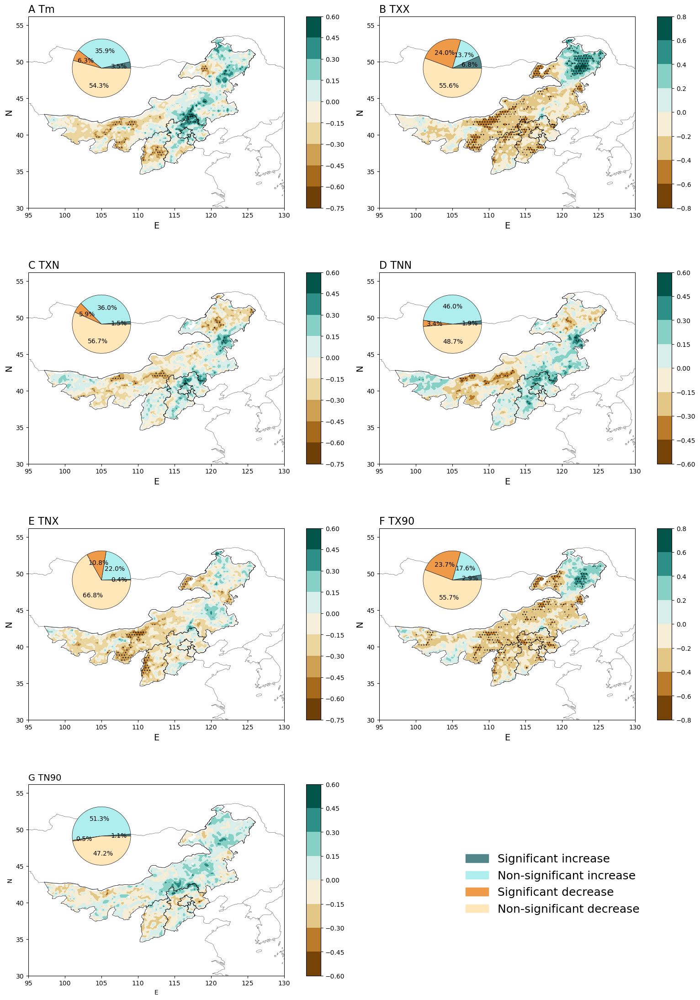

In [29]:
title = np.array(['A Tm','B TXX','C TXN','D TNN','E TNX','F TX90'])
title = title.reshape((3,2))
#读取文件
correlation =  np.load('/mnt/f/cn05/cn05_huabei/output/correlation.npz')
indices_r = np.array(correlation['indices_year_de_r'])
indices_p = np.array(correlation['indices_year_de_p'])

tem_r = np.delete(indices_r, [6,8,9,10,11,12,13,14], axis=0)
tem_p =np.delete(indices_p, [6,8,9,10,11,12,13,14], axis=0)
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

#显著正相关，不显著正相关，显著负相关，不显著负相关
#进行循环，分为四种情况，画饼图

proportion = np.full((7,4),fill_value=0)
for k in range(7):
    for i in range(101):
        for j in range(141):
            if tem_r[k,i,j] > 0 and tem_p[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif tem_r[k,i,j] > 0 and tem_p[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif tem_r[k,i,j] < 0 and tem_p[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif tem_r[k,i,j] < 0 and tem_p[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

#把所有准备画图的数据进行变形，对应3行2列
tem_r = indices_r[0:6,:,:]
tem_p = indices_p[0:6,:,:]

tn90_r = indices_r[7,:,:]
tn90_p = indices_p[7,:,:]

tem_proportion = proportion[0:6,:]
tn90_proportion = proportion[6,:]

tem_r = tem_r.reshape(3,2,101,141)
tem_p = tem_p.reshape(3,2,101,141)
tem_proportion = tem_proportion.reshape(3,2,4)

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

fig=plt.figure(figsize=(16,16))
for i in range(3):
    for j in range(2):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E',fontsize=14)
        ax.set_ylabel('N',fontsize=14)
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=16)
        norm = TwoSlopeNorm(vcenter=0)
        r = ax.contourf(lon,lat,tem_r[i,j,:],norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
        slope_p = ax.contourf(lon,lat,tem_p[i,j,:],levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        fig.colorbar(r,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.48, 1.66-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        #colors = ['#EE799F','#FFE4E1','#4D8048','#A8BF91']
        colors =['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(tem_proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

ax3 = fig.add_axes([0.1, 0.45, 0.35, 0.3],projection = ccrs.PlateCarree())
ax3.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
ax3.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
ax3.set_xlabel('E')
ax3.set_ylabel('N')
ax3.set_title('G TN90',loc='left',fontsize=14)
norm = TwoSlopeNorm(vcenter=0)
s = ax3.contourf(lon,lat,tn90_r,norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
slope_p = ax3.contourf(lon,lat,tn90_p,levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
ax3.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
ax3.add_feature(cfeature.COASTLINE,lw = 0.3)
ax3.add_feature(cfeature.BORDERS,lw = 0.3)
ax3.set_extent([95, 130, 30, 55])
cax = fig.add_axes([ax3.get_position().x1+0.03,ax3.get_position().y0,0.02,ax3.get_position().height])
fig.colorbar(s,cax = cax)
ax4 = fig.add_axes([0.15, 0.61, 0.1, 0.1])
ax4.axis('off')
ax4.pie(tn90_proportion,autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

#设置图例分别对应4个颜色
patchs = [mpatches.Patch(color='#53868B', label='Significant increase'),mpatches.Patch(color='#AFEEEE', label='Non-significant increase'),mpatches.Patch(color='#EE9A49', label='Significant decrease'),mpatches.Patch(color='#FFE7BA', label='Non-significant decrease')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(0.95,0.65),ncol = 1)

### 月尺度去趋势前

In [15]:
correlation = np.load('/mnt/f/cn05/cn05_huabei/output/month_correlation.npz')
indices_month_r = correlation['indices_month_r']
indices_month_r.shape

(15, 12)

Text(0.0, 1.0, 'A')

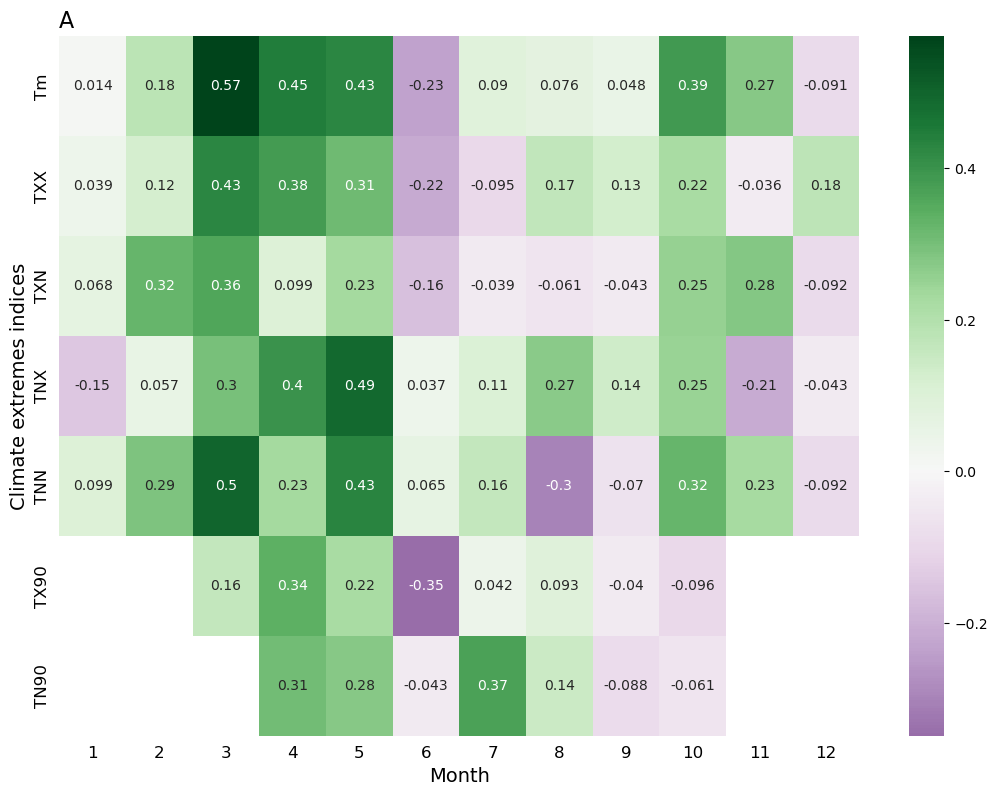

In [37]:
#去趋势前
correlation = np.load('/mnt/f/cn05/cn05_huabei/output/month_correlation.npz')
indices_month_r = correlation['indices_month_r']
tem_month_r = np.delete(indices_month_r, [5,7,9,10,11,12,13,14], axis=0)
indices_month_p = correlation['indices_month_p']
tem_month_p = np.delete(indices_month_p, [5,7,9,10,11,12,13,14], axis=0)

fig=plt.figure(figsize=(10,7))
ax = fig.add_axes([0.0,0.0,1,1])
r = sns.heatmap(tem_month_r,cmap= 'PRGn',annot=True,center=0)
plt.xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5],(1,2,3,4,5,6,7,8,9,10,11,12),fontsize=12)
plt.yticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5],('Tm','TXX', 'TXN', 'TNX', 'TNN','TX90', 'TN90'),fontsize=12)
ax.set_xlabel('Month',fontsize=14)
ax.set_ylabel('Climate extremes indices',fontsize=14)
ax.tick_params(axis='x', width=0)
ax.tick_params(axis='y', width=0)
ax.set_title('A',fontsize=16,loc='left')

### 月尺度去趋势后

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Text(0.0, 1.0, 'B')

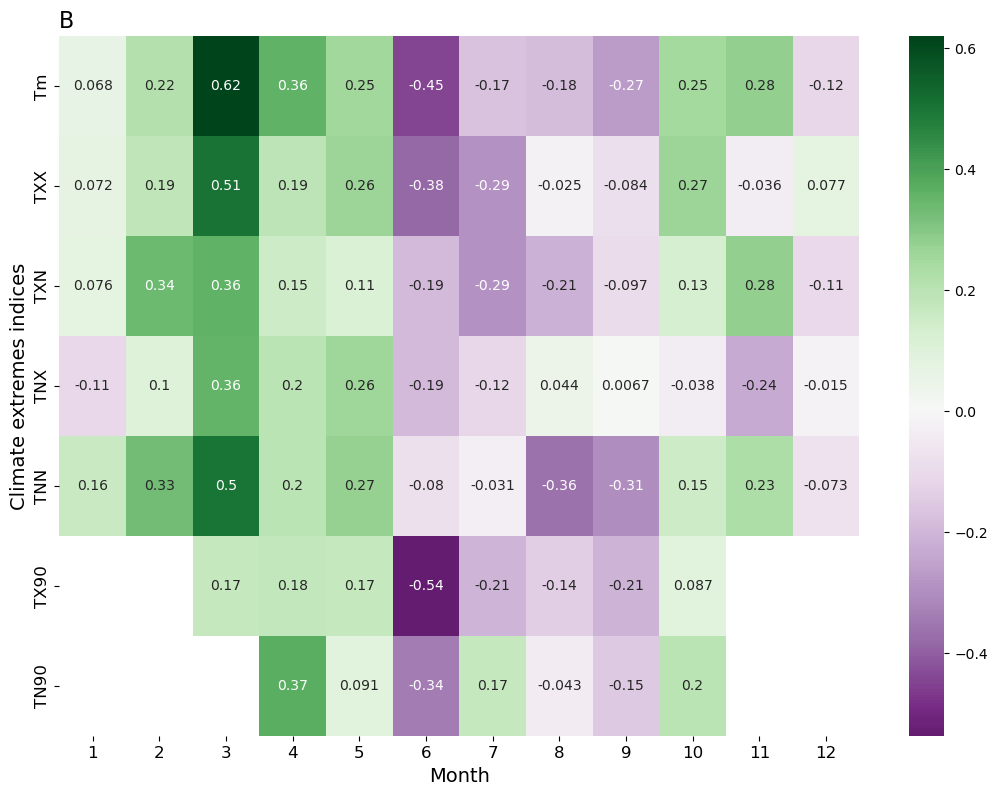

In [38]:
#去趋势后相关性指数

detrend = np.load('/mnt/f/cn05/cn05_huabei/output/month_detrend.npz')
indices_month_detrend = detrend['indices_month_detrend']
ndvi_month_detrend = detrend['ndvi_month_detrend']

#建造np.nan填充的数组
indices_month_r = np.full((15,12),fill_value=np.nan)
indices_month_p = np.full((15,12),fill_value=np.nan)

#进行相关性分析
for k in range(15):
    for i in range(12):
        indices_month_r[k,i],indices_month_p[k,i] = pearsonr(indices_month_detrend[k,:,i],ndvi_month_detrend[:,i])

tem_month_r = np.delete(indices_month_r, [5,7,9,10,11,12,13,14], axis=0)
tem_month_p = np.delete(indices_month_p, [5,7,9,10,11,12,13,14], axis=0)

fig=plt.figure(figsize=(10,7))
ax = fig.add_axes([0.0,0.0,1,1])
r = sns.heatmap(tem_month_r,cmap= 'PRGn',annot=True,center=0)
ax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5],(1,2,3,4,5,6,7,8,9,10,11,12),fontsize=12)
ax.set_yticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5],('Tm','TXX', 'TXN', 'TNX', 'TNN', 'TX90', 'TN90'),fontsize=12)
ax.set_xlabel('Month',fontsize=14)
ax.set_ylabel('Climate extremes indices',fontsize=14)
ax.set_title('B',fontsize=16,loc='left')

## 多年趋势变化

Text(1995, 23, 'TN90 y=0.617x-1195.68   R²=0.49 ')

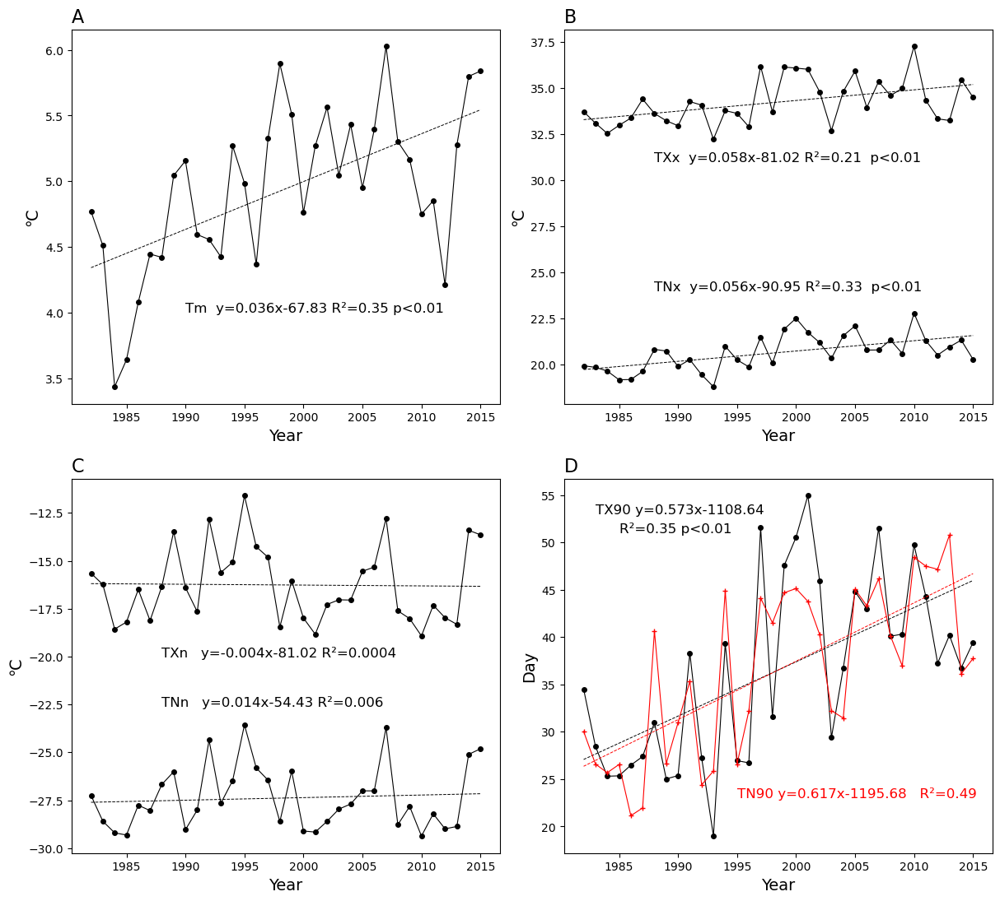

In [23]:
mean_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/mean_mean.csv')
tm_mean = np.array(mean_mean['tm'])
pre_mean = np.array(mean_mean['pre'])
year = np.arange(1982,2016,1)

indices_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/indices_mean.csv')
txx_mean = np.array(indices_mean['TXX'])
tnx_mean = np.array(indices_mean['TNX'])
txn_mean = np.array(indices_mean['TXN'])
tnn_mean = np.array(indices_mean['TNN'])
dtr_mean = np.array(indices_mean['DTR'])
tx90_mean = np.array(indices_mean['TX90'])
tn90_mean = np.array(indices_mean['TN90'])
tx10_mean = np.array(indices_mean['TX10'])
tn10_mean = np.array(indices_mean['TN10'])

ndvi_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_mean.csv')
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

slope_mean = np.array([tm_mean,txx_mean,tnx_mean,txn_mean,tnn_mean,dtr_mean,tx90_mean,tn90_mean,tx10_mean,tn10_mean])

s = np.full((10),fill_value=np.nan)
d = np.full((10),fill_value=np.nan)
p = np.full((10),fill_value=np.nan)
r = np.full((10),fill_value=np.nan)

for i in range(10):
    s[i],d[i],r[i],p[i],_ = linregress(year,slope_mean[i])

fig=plt.figure(figsize=(13,13))

ax1 = fig.add_axes([0, 0, 0.4, 0.35])
ax1.set_xlabel('Year',fontsize=14)
ax1.set_ylabel('℃',fontsize=14)
ax1.set_title('A',loc='left',fontsize=16)
ax1.plot(year,tm_mean,lw=0.8,marker='o',color='k',ms='4')
ax1.plot(year,s[0]*year+d[0],'k--',lw=0.7)
ax1.text(1990,4.0,'Tm  y=0.036x-67.83 R²=0.35 p<0.01',fontsize=12)

ax2 = fig.add_axes([0.46, 0, 0.4, 0.35])
ax2.set_xlabel('Year',fontsize=14)
ax2.set_ylabel('℃',fontsize=14)
ax2.set_title('B',loc='left',fontsize=16)
ax2.plot(year,txx_mean,lw=0.8,marker='o',color='k',ms='4')
ax2.plot(year,s[1]*year+d[1],'k--',lw=0.7)
ax2.plot(year,tnx_mean,lw=0.8,marker='o',color='k',ms='4')
ax2.plot(year,s[2]*year+d[2],'k--',lw=0.7)
ax2.text(1988,31,'TXx  y=0.058x-81.02 R²=0.21  p<0.01',fontsize=12)
ax2.text(1988,24,'TNx  y=0.056x-90.95 R²=0.33  p<0.01',fontsize=12)

ax3 = fig.add_axes([0, -0.42, 0.4, 0.35])
ax3.set_xlabel('Year',fontsize=14)
ax3.set_ylabel('℃',fontsize=14)
ax3.set_title('C',loc='left',fontsize=16)
ax3.plot(year,txn_mean,lw=0.8,marker='o',color='k',ms='4')
ax3.plot(year,s[3]*year+d[3],'k--',lw=0.7)
ax3.plot(year,tnn_mean,lw=0.8,marker='o',color='k',ms='4')
ax3.plot(year,s[4]*year+d[4],'k--',lw=0.7)
ax3.text(1988,-20,'TXn   y=-0.004x-81.02 R²=0.0004',fontsize=12)
ax3.text(1988,-22.6,'TNn   y=0.014x-54.43 R²=0.006',fontsize=12)

ax4 = fig.add_axes([0.46, -0.42, 0.4, 0.35])
ax4.set_xlabel('Year',fontsize=14)
ax4.set_ylabel('Day',fontsize=14)
ax4.set_title('D',loc='left',fontsize=16)
ax4.plot(year,tx90_mean,lw=0.8,marker='o',color='k',ms='4',label='TX90')
ax4.plot(year,s[6]*year+d[6],'k--',lw=0.7)
ax4.plot(year,tn90_mean,lw=0.8,marker='+',color='r',ms='4',label='TN90')
ax4.plot(year,s[7]*year+d[7],'r--',lw=0.7)
ax4.text(1983,53,'TX90 y=0.573x-1108.64',c='k',fontsize=12)
ax4.text(1985,51,'R²=0.35 p<0.01 ',c='k',fontsize=12)
ax4.text(1995,23,'TN90 y=0.617x-1195.68   R²=0.49 ',c='r',fontsize=12)



## 时滞性分析

/home/yqr/miniconda3/envs/area/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'projection'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


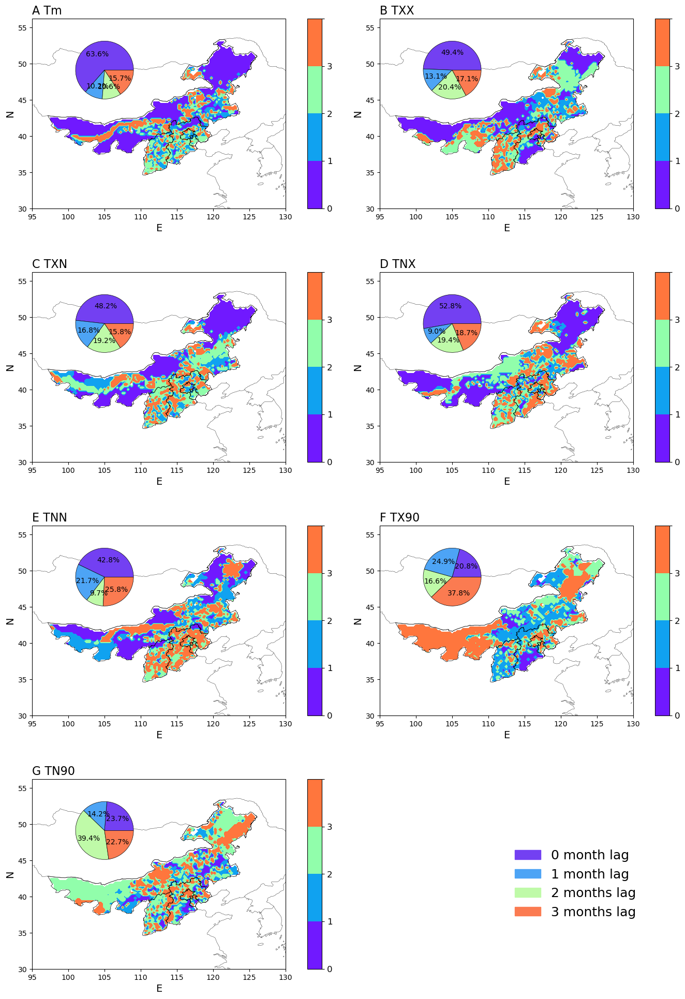

In [37]:
#导入数据 5-10月的
time_correlation = np.load('/mnt/f/cn05/cn05_huabei/output/time_correlation_510.npz')
r0 = time_correlation['r0']
p0 = time_correlation['p0']
r1 = time_correlation['r1']
p1 = time_correlation['p1']
r2 = time_correlation['r2']
p2 = time_correlation['p2']
r3 = time_correlation['r3']
p3 = time_correlation['p3']

r0 = np.delete(r0, [5,7,9,10,11,12,13,14], axis=0)
r1 = np.delete(r1, [5,7,9,10,11,12,13,14], axis=0)
r2 = np.delete(r2, [5,7,9,10,11,12,13,14], axis=0)
r3 = np.delete(r3, [5,7,9,10,11,12,13,14], axis=0)
p0 = np.delete(p0, [5,7,9,10,11,12,13,14], axis=0)
p1 = np.delete(p1, [5,7,9,10,11,12,13,14], axis=0)
p2 = np.delete(p2, [5,7,9,10,11,12,13,14], axis=0)
p3 = np.delete(p3, [5,7,9,10,11,12,13,14], axis=0)

time = np.full((7,101,141),fill_value = np.nan)

for k in range(7):
    for m in range(101):
        for n in range(141):
            if abs(r0[k,m,n]) > abs(r1[k,m,n]) and abs(r0[k,m,n]) > abs(r2[k,m,n]) and abs(r0[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 0
            elif abs(r1[k,m,n]) > abs(r0[k,m,n]) and abs(r1[k,m,n]) > abs(r2[k,m,n]) and abs(r1[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 1
            elif abs(r2[k,m,n]) > abs(r0[k,m,n]) and abs(r2[k,m,n]) > abs(r1[k,m,n]) and abs(r2[k,m,n]) > abs(r3[k,m,n]):
                time[k,m,n] = 2
            elif abs(r3[k,m,n]) > abs(r0[k,m,n]) and abs(r3[k,m,n]) > abs(r1[k,m,n]) and abs(r3[k,m,n]) > abs(r2[k,m,n]):
                time[k,m,n] = 3

#显著正相关，不显著正相关，显著负相关，不显著负相关
#进行循环，分为四种情况，画饼图

proportion = np.full((7,4),fill_value=0)
for k in range(7):
    for i in range(101):
        for j in range(141):
            if time[k,i,j] == 0 :
                proportion[k,0] = proportion[k,0] + 1
            elif time[k,i,j] == 1:
                proportion[k,1] = proportion[k,1] + 1
            elif time[k,i,j] == 2 :
                proportion[k,2] = proportion[k,2] + 1
            elif time[k,i,j] ==3 :
                proportion[k,3] = proportion[k,3] + 1

title = np.array(['A Tm','B TXX','C TXN','D TNX','E TNN','F TX90'])
title = title.reshape((3,2))

huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')
tem_time = time[0:6,:]
tn90_time = time[6,:]
tem_time = tem_time.reshape(3,2,101,141)
tem_proportion = proportion[0:6,:]
tn90_proportion = proportion[6,:]
tem_proportion = tem_proportion.reshape(3,2,4)

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

fig=plt.figure(figsize=(14,14))
for i in range(3):
    for j in range(2):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E',fontsize=14)
        ax.set_ylabel('N',fontsize=14)
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=16)
        r = ax.contourf(lon,lat,tem_time[i,j,:],cmap = 'rainbow',projection =ccrs.PlateCarree(central_longitude=112.5),levels = [-0.1,0.1,1.1,2.1,3.1])
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        cb = fig.colorbar(r,cax = cax)
        #tick_locator = ticker.MaxNLocator(nbins=0) 
        cb.set_ticklabels(ticklabels = ('0','1','2','3',' '))
        #cb.locator = tick_locator
        #cb.update_ticks()
        cb.ax.tick_params(labelsize=12)
        ax2 = fig.add_axes([0.15+j*0.48, 1.66-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        colors =['#7340f2','#4da4f5','#bffaa8','#fb7b51']
        ax2.pie(tem_proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})


ax3 = fig.add_axes([0.1, 0.45, 0.35, 0.3],projection = ccrs.PlateCarree())
ax3.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
ax3.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
ax3.set_xlabel('E',fontsize=14)
ax3.set_ylabel('N',fontsize=14)
ax3.set_title('G TN90',loc='left',fontsize=16)
r2 = ax3.contourf(lon,lat,tn90_time,cmap = 'rainbow',projection =ccrs.PlateCarree(central_longitude=112.5),levels = [-0.1,0.1,1.1,2.1,3.1])
ax3.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
ax3.add_feature(cfeature.COASTLINE,lw = 0.3)
ax3.add_feature(cfeature.BORDERS,lw = 0.3)
ax3.set_extent([95, 130, 30, 55])
cax2 = fig.add_axes([ax3.get_position().x1+0.03,ax3.get_position().y0,0.02,ax3.get_position().height])
cb2 = fig.colorbar(r2,cax = cax2)
#tick_locator = ticker.MaxNLocator(nbins=0) 
cb2.set_ticklabels(ticklabels = ('0','1','2','3',' '))
#cb.locator = tick_locator
#cb.update_ticks()
cb2.ax.tick_params(labelsize=12)
ax2 = fig.add_axes([0.15, 0.61, 0.1, 0.1])
ax2.axis('off')
colors =['#7340f2','#4da4f5','#bffaa8','#fb7b51']
ax2.pie(tn90_proportion,autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#7340f2', label='0 month lag'),mpatches.Patch(color='#4da4f5', label='1 month lag'),mpatches.Patch(color='#bffaa8', label='2 months lag'),mpatches.Patch(color='#fb7b51', label='3 months lag')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(0.95,0.65),ncol = 1)

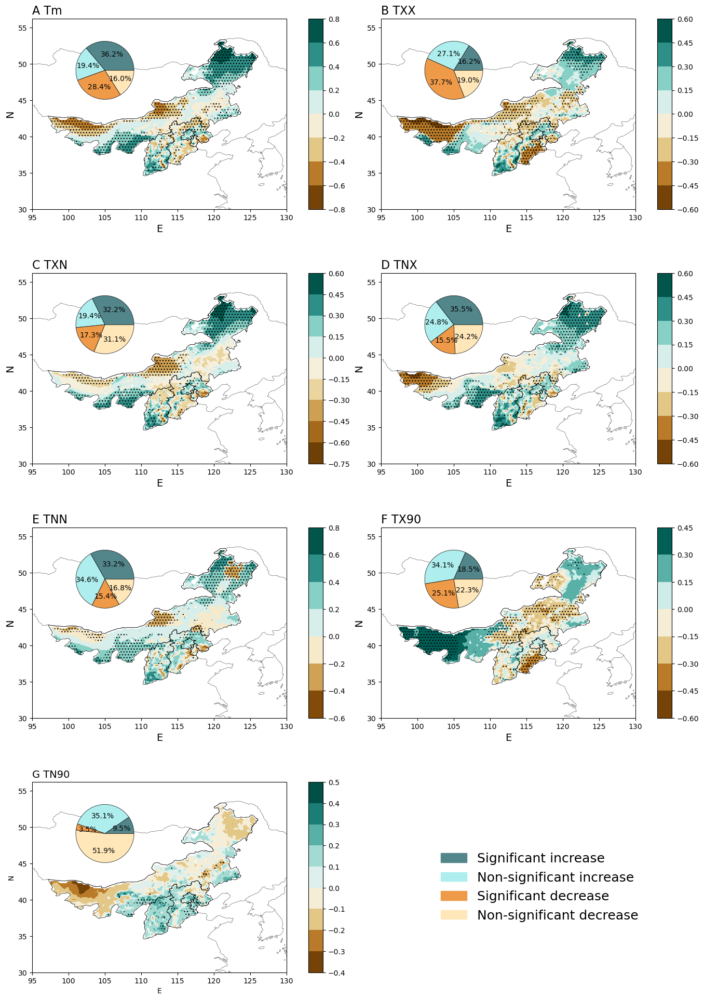

In [18]:
#导入数据
time_correlation = np.load('/mnt/f/cn05/cn05_huabei/output/time_correlation_510.npz')
r0 = time_correlation['r0']
p0 = time_correlation['p0']
r1 = time_correlation['r1']
p1 = time_correlation['p1']
r2 = time_correlation['r2']
p2 = time_correlation['p2']
r3 = time_correlation['r3']
p3 = time_correlation['p3']
r0 = np.delete(r0, [5,7,9,10,11,12,13,14], axis=0)
r1 = np.delete(r1, [5,7,9,10,11,12,13,14], axis=0)
r2 = np.delete(r2, [5,7,9,10,11,12,13,14], axis=0)
r3 = np.delete(r3, [5,7,9,10,11,12,13,14], axis=0)
p0 = np.delete(p0, [5,7,9,10,11,12,13,14], axis=0)
p1 = np.delete(p1, [5,7,9,10,11,12,13,14], axis=0)
p2 = np.delete(p2, [5,7,9,10,11,12,13,14], axis=0)
p3 = np.delete(p3, [5,7,9,10,11,12,13,14], axis=0)

correlation = np.full((7,101,141),fill_value = np.nan)
p_value = np.full((7,101,141),fill_value = np.nan)

for k in range(7):
    for m in range(101):
        for n in range(141):
            if abs(r0[k,m,n]) > abs(r1[k,m,n]) and abs(r0[k,m,n]) > abs(r2[k,m,n]) and abs(r0[k,m,n]) > abs(r3[k,m,n]):
                correlation[k,m,n] = r0[k,m,n]
                p_value[k,m,n] = p0[k,m,n]
            elif abs(r1[k,m,n]) > abs(r0[k,m,n]) and abs(r1[k,m,n]) > abs(r2[k,m,n]) and abs(r1[k,m,n]) > abs(r3[k,m,n]):
                correlation[k,m,n] = r1[k,m,n]
                p_value[k,m,n] = p0[k,m,n]
            elif abs(r2[k,m,n]) > abs(r0[k,m,n]) and abs(r2[k,m,n]) > abs(r1[k,m,n]) and abs(r2[k,m,n]) > abs(r3[k,m,n]):
                correlation[k,m,n] = r2[k,m,n]
                p_value[k,m,n] = p0[k,m,n]
            elif abs(r3[k,m,n]) > abs(r0[k,m,n]) and abs(r3[k,m,n]) > abs(r1[k,m,n]) and abs(r3[k,m,n]) > abs(r2[k,m,n]):
                correlation[k,m,n] = r3[k,m,n]
                p_value[k,m,n] = p0[k,m,n]


#显著正相关，不显著正相关，显著负相关，不显著负相关
#进行循环，分为四种情况，画饼图

proportion = np.full((7,4),fill_value=0)
for k in range(7):
    for i in range(101):
        for j in range(141):
            if correlation[k,i,j] > 0 and p_value[k,i,j] < 0.05:
                proportion[k,0] = proportion[k,0] + 1
            elif correlation[k,i,j] > 0 and p_value[k,i,j] > 0.05:
                proportion[k,1] = proportion[k,1] + 1
            elif correlation[k,i,j] < 0 and p_value[k,i,j] < 0.05:
                proportion[k,2] = proportion[k,2] + 1
            elif correlation[k,i,j] < 0 and p_value[k,i,j] > 0.05:
                proportion[k,3] = proportion[k,3] + 1

title = np.array(['A Tm','B TXX','C TXN','D TNX','E TNN','F TX90'])
title = title.reshape((3,2))
huabei = sr.Reader('/mnt/f/cn05/huabeishp/output/huabei_area.shp')

lon = np.arange(95,130.25,0.25)
lat = np.arange(30,55.25,0.25)

tem_correlation = correlation[0:6,:]
tn90_correlation = correlation[6,:]
tem_correlation = tem_correlation.reshape(3,2,101,141)

tem_proportion = proportion[0:6,:]
tn90_proportion = proportion[6,:]
tem_proportion = tem_proportion.reshape(3,2,4)

tem_p_value = p_value[0:6,:]
tn90_p_value = p_value[6,:]
tem_p_value = tem_p_value.reshape(3,2,101,141)

fig=plt.figure(figsize=(14,14))
for i in range(3):
    for j in range(2):
        ax = fig.add_axes([0.1+j*0.48, 1.5-i*0.35, 0.35, 0.3],projection = ccrs.PlateCarree())
        ax.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
        ax.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
        ax.set_xlabel('E',fontsize=14)
        ax.set_ylabel('N',fontsize=14)
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=16)
        norm = TwoSlopeNorm(vcenter=0)
        r = ax.contourf(lon,lat,tem_correlation[i,j,:],cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5),norm =norm)
        slope_p = ax.contourf(lon,lat,tem_p_value[i,j,:],levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
        ax.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE,lw = 0.3)
        ax.add_feature(cfeature.BORDERS,lw = 0.3)
        ax.set_extent([95, 130, 30, 55])
        cax = fig.add_axes([ax.get_position().x1+0.03,ax.get_position().y0,0.02,ax.get_position().height])
        cb = fig.colorbar(r,cax = cax)
        ax2 = fig.add_axes([0.15+j*0.48, 1.66-i*0.35, 0.1, 0.1])
        ax2.axis('off')
        #colors = ['#EE799F','#FFE4E1','#4D8048','#A8BF91']
        colors =['#53868B','#AFEEEE','#EE9A49','#FFE7BA']
        ax2.pie(tem_proportion[i,j,:],autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

ax3 = fig.add_axes([0.1, 0.45, 0.35, 0.3],projection = ccrs.PlateCarree())
ax3.set_xticks([0,50,100,140],('95°','105°','115°','125°'))
ax3.set_yticks([0,20,40,60,80,100],('30°','35°','40°','45°','50°','55°'))
ax3.set_xlabel('E')
ax3.set_ylabel('N')
ax3.set_title('G TN90',loc='left',fontsize=14)
norm = TwoSlopeNorm(vcenter=0)
s = ax3.contourf(lon,lat,tn90_correlation,norm = norm,cmap = 'BrBG',projection =ccrs.PlateCarree(central_longitude=112.5))
slope_p = ax3.contourf(lon,lat,tn90_p_value,levels=[0,0.05,1], zorder=1,hatches=['...', None],colors="none", projection =ccrs.PlateCarree(central_longitude=112.5))
ax3.add_geometries(huabei.geometries(),ccrs.PlateCarree(),facecolor='none', edgecolor='black',linewidth=0.5)
ax3.add_feature(cfeature.COASTLINE,lw = 0.3)
ax3.add_feature(cfeature.BORDERS,lw = 0.3)
ax3.set_extent([95, 130, 30, 55])
cax = fig.add_axes([ax3.get_position().x1+0.03,ax3.get_position().y0,0.02,ax3.get_position().height])
fig.colorbar(s,cax = cax)
ax4 = fig.add_axes([0.15, 0.61, 0.1, 0.1])
ax4.axis('off')
ax4.pie(tn90_proportion,autopct='%1.1f%%',colors = colors,wedgeprops={'linewidth':0.5, 'edgecolor':'black'})

#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#53868B', label='Significant increase'),mpatches.Patch(color='#AFEEEE', label='Non-significant increase'),mpatches.Patch(color='#EE9A49', label='Significant decrease'),mpatches.Patch(color='#FFE7BA', label='Non-significant decrease')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(0.95,0.65),ncol = 1)

### 不同植被

Text(0.6, 0.35, 'Grasslands')

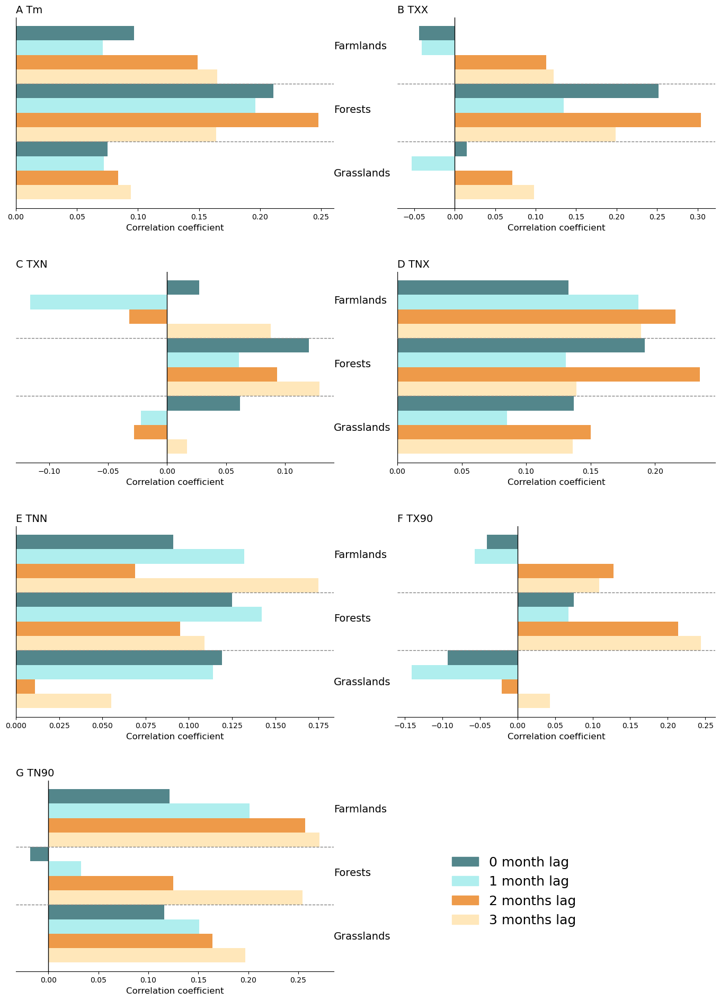

In [8]:
time_correlation = pd.read_csv('/mnt/f/tudi_ndvi/month/output/time_correlation.csv')

r0 = time_correlation['r0']
r1 = time_correlation['r1']
r2 = time_correlation['r2']
r3 = time_correlation['r3']
time_c = np.array([r0,r1,r2,r3])

farmland = np.delete(time_c[:,15:30],[5,7,8,9,10,11,12,13,14], axis=1)
forest = np.delete(time_c[:,30:45],[5,7,8,9,10,11,12,13,14], axis=1)
grassland = np.delete(time_c[:,45:60],[5,7,8,9,10,11,12,13,14], axis=1)

farmland_tn90 = time_c[:,23]
forest_tn90 = time_c[:,38]
grassland_tn90 = time_c[:,53]

farmland = farmland.reshape((4,3,2))
forest = forest.reshape((4,3,2))
grassland = grassland.reshape((4,3,2))

title = np.array(['A Tm','B TXX','C TXN','D TNX','E TNN','F TX90'])
title = title.reshape((3,2))
x1 = np.arange(0,1.2,0.4)
x2 = np.arange(0.1,1.3,0.4)
x3 = np.arange(0.2,1.4,0.4)
x4 = np.arange(0.3,1.5,0.4)

fig=plt.figure(figsize=(12,12))
for i in range(3):
    for j in range(2):
        ax = fig.add_axes([0.1+j*0.6, 1.5-i*0.4, 0.5, 0.3])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.axvline(x=0,c='k',lw=1.0)
        ax.set_yticks([])
        ax.tick_params(axis='y', width=0)
        ax.axhline(y=0.35,c='grey',lw=1.0, ls="--")
        ax.axhline(y=0.75,c='grey',lw=1.0, ls="--")
        ax.set_xlabel('Correlation coefficient',fontsize=12)
        ax.set_title('{}'.format(title[i,j]),loc='left',fontsize=14)
        bar1 = ax.barh(x4,(grassland[0,i,j],forest[0,i,j],farmland[0,i,j]),color='#53868B',height=0.1,align='center')
        bar2 = ax.barh(x3,(grassland[1,i,j],forest[1,i,j],farmland[1,i,j]),color='#AFEEEE',height=0.1,align='center')
        bar3 = ax.barh(x2,(grassland[2,i,j],forest[2,i,j],farmland[2,i,j]),color='#EE9A49',height=0.1,align='center')
        bar4 = ax.barh(x1,(grassland[3,i,j],forest[3,i,j],farmland[3,i,j]),color='#FFE7BA',height=0.1,align='center')
ax = fig.add_axes([0.1, 0.3 , 0.5, 0.3])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.axvline(x=0,c='k',lw=1.0)
ax.set_yticks([])
ax.tick_params(axis='y', width=0)
ax.axhline(y=0.35,c='grey',lw=1.0, ls="--")
ax.axhline(y=0.75,c='grey',lw=1.0, ls="--")
ax.set_xlabel('Correlation coefficient',fontsize=12)
ax.set_title('G TN90',loc='left',fontsize=14)
bar1 = ax.barh(x4,(grassland_tn90[0],forest_tn90[0],farmland_tn90[0]),color='#53868B',height=0.1,align='center')
bar2 = ax.barh(x3,(grassland_tn90[1],forest_tn90[1],farmland_tn90[1]),color='#AFEEEE',height=0.1,align='center')
bar3 = ax.barh(x2,(grassland_tn90[2],forest_tn90[2],farmland_tn90[2]),color='#EE9A49',height=0.1,align='center')
bar4 = ax.barh(x1,(grassland_tn90[3],forest_tn90[3],farmland_tn90[3]),color='#FFE7BA',height=0.1,align='center')


#设置图例分别对应三个颜色
patchs = [mpatches.Patch(color='#53868B', label='0 month lag'),mpatches.Patch(color='#AFEEEE', label='1 month lag'),mpatches.Patch(color='#EE9A49', label='2 months lag'),mpatches.Patch(color='#FFE7BA', label='3 months lag')]
#添加图例
fig.legend(handles=patchs,frameon=False,prop = {'size':18},bbox_to_anchor=(1.0,0.5),ncol = 1)
fig.text(0.6,1.75,'Farmlands',fontsize=14)
fig.text(0.6,1.65,'Forests',fontsize=14)
fig.text(0.6,1.55,'Grasslands',fontsize=14)

fig.text(0.6,1.35,'Farmlands',fontsize=14)
fig.text(0.6,1.25,'Forests',fontsize=14)
fig.text(0.6,1.15,'Grasslands',fontsize=14)

fig.text(0.6,0.95,'Farmlands',fontsize=14)
fig.text(0.6,0.85,'Forests',fontsize=14)
fig.text(0.6,0.75,'Grasslands',fontsize=14)

fig.text(0.6,0.55,'Farmlands',fontsize=14)
fig.text(0.6,0.45,'Forests',fontsize=14)
fig.text(0.6,0.35,'Grasslands',fontsize=14)

## RR

In [4]:
from sklearn import linear_model
from sklearn.linear_model import Ridge,RidgeCV
from sklearn.linear_model import Lasso,LassoCV
from sklearn import model_selection
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
import seaborn as sns
from sklearn import metrics

In [50]:
#去趋势前
indices_mean  = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/indices_mean.csv')
ndvi_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_mean.csv')
mean_mean = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/mean_mean.csv')

tem_mean = np.array(indices_mean[['TXX','TXN','TNX','TNN','TX90','TN90']])
tm_mean = np.array(mean_mean['tm'])
tm_mean = tm_mean.reshape((34, 1))
ndvi_mean = np.array(ndvi_mean['NDVI'])
tem_mean  = np.append(tm_mean,tem_mean,axis=1)

tem_stan = np.full((34,7),fill_value=np.nan)

#标准化(按列)
for i in range(7):
    tem_stan[:,i] = preprocessing.scale(tem_mean[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_mean)

alphas1 = np.arange(0.01,100,0.1)
ridge=RidgeCV(alphas=alphas1,fit_intercept=True,scoring = None,store_cv_values=False,cv = None).fit(tem_stan, ndvi_stan)
a1 = ridge.alpha_
print(ridge.alpha_)
print(ridge.best_score_)
c1 = ridge.coef_
print(ridge.coef_)
i1 = ridge.intercept_
print(ridge.intercept_)
print(ridge.score(tem_stan, ndvi_stan))
ndvi_predict = ridge.predict(tem_stan)
r1,p1=pearsonr(ndvi_stan,ndvi_predict)
print(r1,p1)
#tm TXX','TXN','TNX','TNN','TX90','TN90

0.81
-0.716832564605655
[ 0.39447759  0.22583408 -0.18451517 -0.0816665   0.11731896 -0.98278663
  1.0071637 ]
-1.49153455297945e-15
0.5635992200687079
0.754878020199319 2.4944648032481706e-07


In [51]:
#去趋势后
indices_detrend  = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/indices_detrend.csv')
ndvi_detrend = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/ndvi_detrend.csv')
mean_detrend = pd.read_csv('/mnt/f/cn05/cn05_huabei/output/mean_detread.csv')

tem_detrend = np.array(indices_detrend[['TXX','TXN','TNX','TNN','TX90','TN90']])
tm_detrend = np.array(mean_detrend['tm'])
tm_detrend = tm_detrend.reshape((34, 1))
ndvi_detrend = np.array(ndvi_detrend['NDVI'])
tem_detrend  = np.append(tm_detrend,tem_detrend,axis=1)

tem_stan = np.full((34,7),fill_value=np.nan)

#标准化(按列)
for i in range(7):
    tem_stan[:,i] = preprocessing.scale(tem_detrend[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_detrend)
alphas1 = np.arange(0.1,100,0.01)
ridge=RidgeCV(alphas=alphas1,fit_intercept=True,scoring = None,store_cv_values=False,cv = None).fit(tem_stan, ndvi_stan)
a2 = ridge.alpha_
print(ridge.alpha_)
print(ridge.best_score_)
c2 = ridge.coef_
print(ridge.coef_)
i2 = ridge.intercept_
print(ridge.intercept_)
print(ridge.score(tem_stan, ndvi_stan))
ndvi_predict = ridge.predict(tem_stan)
r2,p2=pearsonr(ndvi_stan,ndvi_predict)
print(r2,p2)
#tm TXX','TXN','TNX','TNN','TX90','TN90

1.5899999999999994
-0.9952688855236709
[ 0.18496858  0.19532905 -0.09735486 -0.11001566  0.06120327 -0.84790216
  0.67564534]
-3.883837988225972e-19
0.3730980833090105
0.6221353367132179 8.560109825540077e-05


In [52]:
#os.path.join 用来连接文件夹路径
path_indices = os.path.join('/mnt/f/tudi_ndvi/output/1112_mean.csv')
#读取极端气候指数的csv文件
indices_mean = pd.read_csv(path_indices)
#读入array数组
tem_mean = indices_mean[['Tm','TXX', 'TXN', 'TNX', 'TNN','TX90','TN90']]
tem_mean = np.array(tem_mean)

path_ndvi = os.path.join('/mnt/f/tudi_ndvi/output/1112_ndvi_mean.csv')
ndvi_mean = pd.read_csv(path_ndvi)
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

tem_stan = np.full((34,7),fill_value=np.nan)
#标准化(按列)
for i in range(7):
    tem_stan[:,i] = preprocessing.scale(tem_mean[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_mean)

alphas1 = np.arange(0.01,100,0.01)
ridge=RidgeCV(alphas=alphas1,fit_intercept=True,scoring = None,store_cv_values=False,cv = None).fit(tem_stan, ndvi_stan)
a3 = ridge.alpha_
print(ridge.alpha_)
print(ridge.best_score_)
c3 = ridge.coef_
print(ridge.coef_)
i3 = ridge.intercept_
print(ridge.intercept_)
print(ridge.score(tem_stan, ndvi_stan))
ndvi_predict = ridge.predict(tem_stan)
r3,p3=pearsonr(ndvi_stan,ndvi_predict)
print(r3,p3)
#tm TXX','TXN','TNX','TNN','TX90','TN90

4.99
-0.7607346070330882
[ 0.32961712 -0.23789024 -0.14985202  0.26676623  0.21884622 -0.22425959
  0.33541414]
-1.7762461325437505e-15
0.4620987405186813
0.690466395550282 6.211134426030505e-06


In [53]:
#os.path.join 用来连接文件夹路径
path_indices = os.path.join('/mnt/f/tudi_ndvi/output/1112_indices_detread.csv')
#读取极端气候指数的csv文件
indices_mean = pd.read_csv(path_indices)
#读入array数组
tem_mean = indices_mean[['Tm','TXX', 'TXN', 'TNX', 'TNN','TX90','TN90']]
tem_mean = np.array(tem_mean)

path_ndvi = os.path.join('/mnt/f/tudi_ndvi/output/1112_ndvi_detread.csv')
ndvi_mean = pd.read_csv(path_ndvi)
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

tem_stan = np.full((34,7),fill_value=np.nan)
#标准化(按列)
for i in range(7):
    tem_stan[:,i] = preprocessing.scale(tem_mean[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_mean)

alphas1 = np.arange(0.01,100,0.01)
ridge=RidgeCV(alphas=alphas1,fit_intercept=True,scoring = None,store_cv_values=False,cv = None).fit(tem_stan, ndvi_stan)
a4 = ridge.alpha_
print(ridge.alpha_)
print(ridge.best_score_)
c4 = ridge.coef_
print(ridge.coef_)
i4 = ridge.intercept_
print(ridge.intercept_)
print(ridge.score(tem_stan, ndvi_stan))
ndvi_predict = ridge.predict(tem_stan)
r4,p4=pearsonr(ndvi_stan,ndvi_predict)
print(r4,p4)
#tm TXX','TXN','TNX','TNN','TX90','TN90

34.35
-1.0400623492099443
[ 0.07067153 -0.17725565 -0.00097521  0.01673388  0.04246639 -0.1191841
  0.07479079]
2.4014018504550023e-17
0.17505455791509983
0.48542237291463775 0.0036136416064454268


In [54]:
#os.path.join 用来连接文件夹路径
path_indices = os.path.join('/mnt/f/tudi_ndvi/output/2124_mean.csv')
#读取极端气候指数的csv文件
indices_mean = pd.read_csv(path_indices)
#读入array数组
tem_mean = indices_mean[['Tm','TXX', 'TXN', 'TNX', 'TNN','TX90','TN90']]
tem_mean = np.array(tem_mean)

path_ndvi = os.path.join('/mnt/f/tudi_ndvi/output/2124_ndvi_mean.csv')
ndvi_mean = pd.read_csv(path_ndvi)
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

tem_stan = np.full((34,7),fill_value=np.nan)
#标准化(按列)
for i in range(7):
    tem_stan[:,i] = preprocessing.scale(tem_mean[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_mean)

alphas1 = np.arange(0.01,100,0.01)
ridge=RidgeCV(alphas=alphas1,fit_intercept=True,scoring = None,store_cv_values=False,cv = None).fit(tem_stan, ndvi_stan)
a5 = ridge.alpha_
print(ridge.alpha_)
print(ridge.best_score_)
c5 = ridge.coef_
print(ridge.coef_)
i5 = ridge.intercept_
print(ridge.intercept_)
print(ridge.score(tem_stan, ndvi_stan))
ndvi_predict = ridge.predict(tem_stan)
r5,p5=pearsonr(ndvi_stan,ndvi_predict)
print(r5,p5)
#tm TXX','TXN','TNX','TNN','TX90','TN90

0.39
-0.6948029052444098
[ 0.38204048  0.97147265  0.54760832 -0.38108193 -0.5486081  -0.84493022
  0.70842459]
7.133812196200708e-17
0.5764508044001002
0.7608351081986647 1.763895451211131e-07


In [55]:
#os.path.join 用来连接文件夹路径
path_indices = os.path.join('/mnt/f/tudi_ndvi/output/2124_indices_detread.csv')
#读取极端气候指数的csv文件
indices_mean = pd.read_csv(path_indices)
#读入array数组
tem_mean = indices_mean[['Tm','TXX', 'TXN', 'TNX', 'TNN','TX90','TN90']]
tem_mean = np.array(tem_mean)

path_ndvi = os.path.join('/mnt/f/tudi_ndvi/output/2124_ndvi_detread.csv')
ndvi_mean = pd.read_csv(path_ndvi)
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

tem_stan = np.full((34,7),fill_value=np.nan)
#标准化(按列)
for i in range(7):
    tem_stan[:,i] = preprocessing.scale(tem_mean[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_mean)

alphas1 = np.arange(0.01,100,0.01)
ridge=RidgeCV(alphas=alphas1,fit_intercept=True,scoring = None,store_cv_values=False,cv = None).fit(tem_stan, ndvi_stan)
a6 = ridge.alpha_
print(ridge.alpha_)
print(ridge.best_score_)
c6 = ridge.coef_
print(ridge.coef_)
i6 = ridge.intercept_
print(ridge.intercept_)
print(ridge.score(tem_stan, ndvi_stan))
ndvi_predict = ridge.predict(tem_stan)
r6,p6=pearsonr(ndvi_stan,ndvi_predict)
print(r6,p6)
#tm TXX','TXN','TNX','TNN','TX90','TN90

0.34
-0.860094336561277
[ 0.34025539  0.95455464  0.63857659 -0.37034884 -0.63456506 -0.80631834
  0.57140192]
-6.826825010394286e-17
0.4805507215241005
0.6947063652469275 5.156602199020365e-06


In [56]:
#os.path.join 用来连接文件夹路径
path_indices = os.path.join('/mnt/f/tudi_ndvi/output/3133_mean.csv')
#读取极端气候指数的csv文件
indices_mean = pd.read_csv(path_indices)
#读入array数组
tem_mean = indices_mean[['Tm','TXX', 'TXN', 'TNX', 'TNN','TX90','TN90']]
tem_mean = np.array(tem_mean)

path_ndvi = os.path.join('/mnt/f/tudi_ndvi/output/3133_ndvi_mean.csv')
ndvi_mean = pd.read_csv(path_ndvi)
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

tem_stan = np.full((34,7),fill_value=np.nan)
#标准化(按列)
for i in range(7):
    tem_stan[:,i] = preprocessing.scale(tem_mean[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_mean)

alphas1 = np.arange(0.01,100,0.01)
ridge=RidgeCV(alphas=alphas1,fit_intercept=True,scoring = None,store_cv_values=False,cv = None).fit(tem_stan, ndvi_stan)
a7 = ridge.alpha_
print(ridge.alpha_)
print(ridge.best_score_)
c7 = ridge.coef_
print(ridge.coef_)
i7 = ridge.intercept_
print(ridge.intercept_)
print(ridge.score(tem_stan, ndvi_stan))
ndvi_predict = ridge.predict(tem_stan)
r7,p7=pearsonr(ndvi_stan,ndvi_predict)
print(r7,p7)
#tm TXX','TXN','TNX','TNN','TX90','TN90

0.7000000000000001
-0.705644007918799
[ 0.29830801  0.07446873 -0.31675502  0.00196526  0.14614689 -1.11959031
  1.07180567]
-7.840503783478566e-15
0.5810606116721886
0.7662909553074718 1.27292275955723e-07


In [57]:
#os.path.join 用来连接文件夹路径
path_indices = os.path.join('/mnt/f/tudi_ndvi/output/3133_indices_detread.csv')
#读取极端气候指数的csv文件
indices_mean = pd.read_csv(path_indices)
#读入array数组
tem_mean = indices_mean[['Tm','TXX', 'TXN', 'TNX', 'TNN','TX90','TN90']]
tem_mean = np.array(tem_mean)

path_ndvi = os.path.join('/mnt/f/tudi_ndvi/output/3133_ndvi_detread.csv')
ndvi_mean = pd.read_csv(path_ndvi)
ndvi_mean = ndvi_mean['NDVI']
ndvi_mean = np.array(ndvi_mean)

tem_stan = np.full((34,7),fill_value=np.nan)
#标准化(按列)
for i in range(7):
    tem_stan[:,i] = preprocessing.scale(tem_mean[:,i])
#标准化
ndvi_stan = preprocessing.scale(ndvi_mean)

alphas1 = np.arange(0.01,100.1,0.01)
ridge=RidgeCV(alphas=alphas1,fit_intercept=True,scoring = None,store_cv_values=False,cv = None).fit(tem_stan, ndvi_stan)
a8 = ridge.alpha_
print(ridge.alpha_)
print(ridge.best_score_)
c8 = ridge.coef_
print(ridge.coef_)
i8 = ridge.intercept_
print(ridge.intercept_)
print(ridge.score(tem_stan, ndvi_stan))
ndvi_predict = ridge.predict(tem_stan)
r8,p8=pearsonr(ndvi_stan,ndvi_predict)
print(r8,p8)
#tm TXX','TXN','TNX','TNN','TX90','TN90

0.8300000000000001
-0.7412862970006469
[ 0.17686934  0.11519491 -0.32205449 -0.02170584  0.13520201 -1.06493974
  0.78693587]
-3.3567049130584986e-18
0.5514432517269612
0.7458184285165091 4.149036456867577e-07


### 输出

In [79]:
a = np.array([a1,a2,a3,a4,a5,a6,a7,a8])
c = np.array([c1,c2,c3,c4,c5,c6,c7,c8])
i = np.array([i1,i2,i3,i4,i5,i6,i7,i8])
r = np.array([r1,r2,r3,r4,r5,r6,r7,r8])
p = np.array([p1,p2,p3,p4,p5,p6,p7,p8])
rr = np.array([a,i,r,p])
rr = rr.transpose(1,0)
rr = np.append(rr,c,axis = 1)

In [86]:
column = ['alpha','intercept','r','p','coef','coef','coef','coef','coef','coef','coef']
rr = pd.DataFrame(columns=column,data=rr)
rr.to_csv('/mnt/f/cn05/cn05_huabei/output/rr.csv')

In [7]:
#导入数据
deseason = np.load('/mnt/f/cn05/cn05_huabei/output/month_deseason.npz')
indices_month_deseason = deseason['indices_month_deseason']
ndvi_month_deseason = deseason['ndvi_month_deseason']
ndvi_month_deseason = ndvi_month_deseason/10000
#去掉tm和pre
delete_index = [0,10]
indices_month_deseason = np.delete(indices_month_deseason,[5,7,9,10,11,12,13,14],axis = 0)

indices_stan = np.full((7,408),fill_value=np.nan)

#标准化(按列)
for i in range(7):
    indices_stan[i,:] = preprocessing.scale(indices_month_deseason[i,:])

#标准化
ndvi_stan = preprocessing.scale(ndvi_month_deseason)

#转置array数组
indices_stan = indices_stan.transpose(1,0)
#进行去季节化并进行标准化的序列
alphas1 = np.arange(0.01,100.1,0.01)
ridge=RidgeCV(alphas=alphas1,fit_intercept=True,scoring = None,store_cv_values=False,cv = None).fit(indices_stan, ndvi_stan)
a8 = ridge.alpha_
print(ridge.alpha_)
print(ridge.best_score_)
c8 = ridge.coef_
print(ridge.coef_)
i8 = ridge.intercept_
print(ridge.intercept_)
print(ridge.score(indices_stan, ndvi_stan))
ndvi_predict = ridge.predict(indices_stan)
r8,p8=pearsonr(ndvi_stan,ndvi_predict)
print(r8,p8)

36.4
-0.9683251948884651
[ 0.07176063  0.09300456 -0.01551381 -0.0024992   0.06500161 -0.2020786
  0.18828868]
-5.709519447634578e-17
0.06172444009350331
0.2516171998792164 2.606080780295257e-07
